# ***Preparing***

In [1]:
import os
import datetime
import random
import math

import torch

from torch import nn, optim
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import Dataset, DataLoader

import albumentations as A
from albumentations.pytorch import ToTensorV2

import cv2

import matplotlib.pyplot as plt

2024-04-29 02:25:20.581186: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-29 02:25:20.581281: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-29 02:25:20.683241: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
labels = ['not hotdog', 'hotdog']
TRESHOLD = 0.5

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# ***Datasets***

In [4]:
class CustomDataset(Dataset):
    def __init__(self, dataset_directory, transform=None, transform_aug=None, target_transform=None):
        self.dataset_directory = dataset_directory

        self.annotations = []
        self.lens = []
        for root, _, files in os.walk(self.dataset_directory):
            if root != self.dataset_directory:
                for filename in files:
                    root_basename = os.path.basename(root)
                    self.annotations.append((filename, root_basename))
                self.lens.append(len(files))

        self.transform = transform
        self.transform_aug = transform_aug
        self.target_transform = target_transform

    def __len__(self):
        return sum(self.lens)

    def __getitem__(self, index):
        label = self.annotations[index][1]
        file_name = f'{self.dataset_directory}/{label}/{self.annotations[index][0]}'
        image = cv2.imread(file_name)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform_aug:
            image = self.transform_aug(image=image)['image']

        if self.transform:
            image = self.transform(image=image)['image']
            image = image.to(device)

        if self.target_transform:
            label = self.target_transform(label)

        return image, label
    
    

In [5]:
train_dataset = CustomDataset('hotdog-nothotdog/train')
val_dataset = CustomDataset('hotdog-nothotdog/val')
test_dataset = CustomDataset('hotdog-nothotdog/test')

In [6]:
total = []

train_dataset.transform = ToTensorV2()

for image, _ in train_dataset:
    total.append(image)

total_tensor = torch.stack(total).to(device) / 255

mean = total_tensor.mean(dim=(0, 2, 3))
std = total_tensor.std(dim=(0, 2, 3))

print(mean)
print(std)

tensor([0.5335, 0.4444, 0.3527], device='cuda:0')
tensor([0.2764, 0.2730, 0.2832], device='cuda:0')


# ***Augmentation***

In [7]:
def test_transformers(transformers, image):
    num_transformers = len(transformers)
    plt.figure(figsize=(20, 10))

    plt.subplot(1, num_transformers + 2, 1)
    plt.axis('off')
    plt.imshow(image)

    result_image = image

    for idx, transformer in enumerate(transformers):
        plt.subplot(1, num_transformers + 2, idx + 2)
        plt.axis('off')
        transformed_image = transformer(image=image)['image']
        plt.imshow(transformed_image)
        result_image = transformer(image=result_image)['image']

    plt.subplot(1, num_transformers + 2, num_transformers + 2)
    plt.axis('off')
    plt.imshow(result_image)

In [8]:
def make_transformations(mode='train'):
    p = 0.5
    smallest_p = 0.01
    if mode == 'test':
        p = 1
        smallest_p = 1
        
    affine = A.SomeOf([A.ElasticTransform(p=p, 
                                          border_mode=1),
                       A.GridDistortion(p=p, 
                                        border_mode=1),
                       A.Flip(p=p),
                       A.OpticalDistortion(p=p, 
                                           border_mode=1),
                       A.Perspective(p=p, 
                                     pad_mode=1, 
                                     fit_output=True),
                       A.Rotate(p=p, 
                                border_mode=1),
                       A.ShiftScaleRotate(p=p, 
                                          border_mode=1, 
                                          rotate_limit=(-90, 90)),
                       A.PiecewiseAffine(p=p)], 1)

    blur = A.SomeOf([A.AdvancedBlur(p=p),
                     A.Blur(p=p),
                     A.GaussianBlur(p=p),
                     A.MedianBlur(p=p),
                     A.MotionBlur(p=p),
                     A.RingingOvershoot(p=p, 
                                        blur_limit=(7, 11), 
                                        cutoff=(0.8, 1.1)),
                     A.ZoomBlur(p=p, 
                                max_factor=1.05)], 1)

    noise = A.SomeOf([A.PixelDropout(p=p),
                      A.GaussNoise(p=p),
                      A.ISONoise(p=p),
                      A.MultiplicativeNoise(p=p),
                      A.Downscale(p=p),
                      A.ImageCompression(p=p, 
                                         quality_lower=80),
                      A.RandomFog(p=p, 
                                  fog_coef_upper=0.4)], 1)

    sharpen = A.SomeOf([A.Emboss(p=p),
                        A.Sharpen(p=p)], 1)

    colors = A.SomeOf([A.CLAHE(p=p),
                       A.Equalize(p=p),
                       A.ColorJitter(p=p, 
                                     hue=0.08),
                       A.FancyPCA(p=p),
                       A.RandomBrightnessContrast(p=p),
                       A.RandomGamma(p=p),
                       A.RandomToneCurve(p=p),
                       A.HueSaturationValue(p=p, 
                                            hue_shift_limit=8),
                       A.RGBShift(p=p),
                       A.RandomBrightnessContrast(p=p),
                       A.ToGray(p=smallest_p),
                       A.ToSepia(p=smallest_p)], 1)
    augmentations = [affine, blur, noise, sharpen, colors]
    return augmentations

In [9]:
augmentations = make_transformations()
print('Number of combinations: ', math.prod([len(augmentation) for augmentation in augmentations]))

transformations = A.Compose(augmentations)
transformations_test = A.Compose(make_transformations('test'))

Number of combinations:  9408


/opt/conda/lib/python3.10/site-packages/albumentations/augmentations/transforms.py:1666: UserWarning: Using default interpolation INTER_NEAREST, which is sub-optimal.Please specify interpolation mode for downscale and upscale explicitly.For additional information see this PR https://github.com/albumentations-team/albumentations/pull/584
  warnings.warn(


	INITIAL			AFFINE			BLUR			NOISE			SHARPEN			COLORS			COMBINED


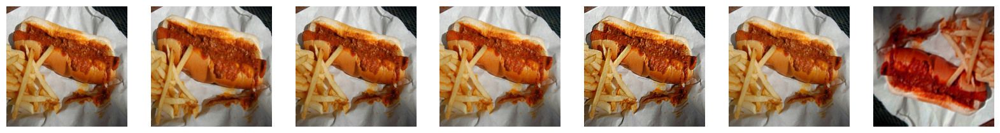

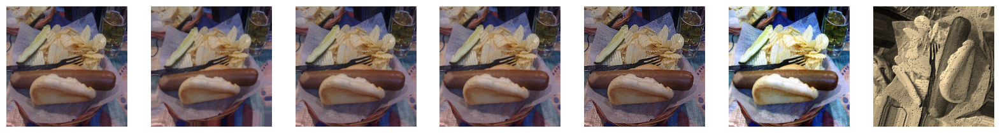

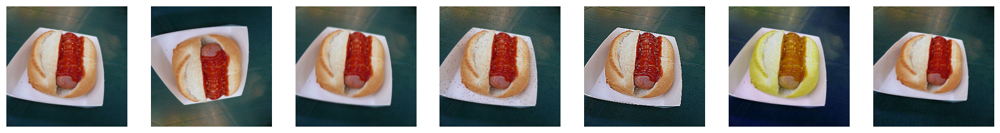

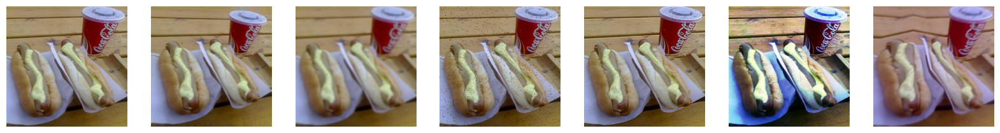

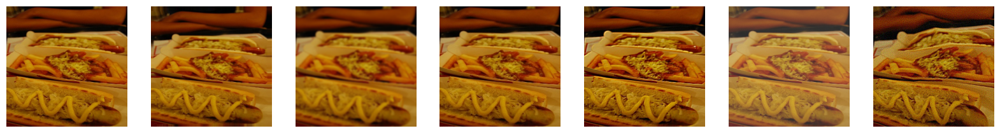

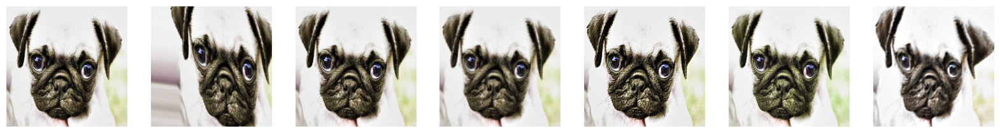

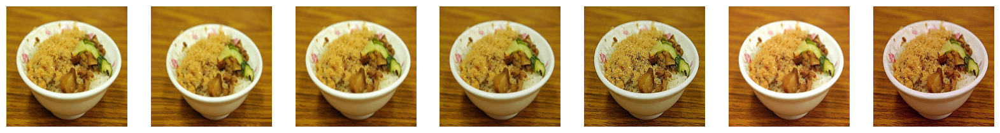

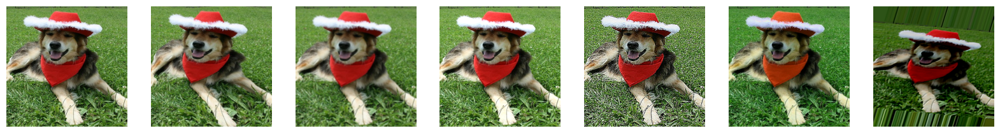

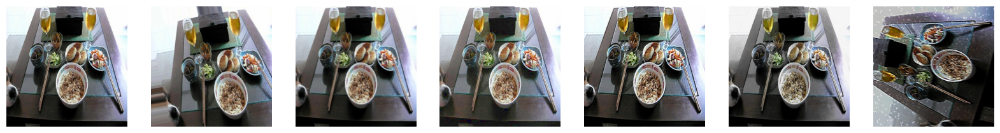

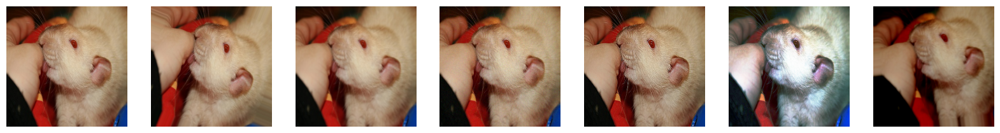

In [10]:
print("\tINITIAL\t\t\tAFFINE\t\t\tBLUR\t\t\tNOISE\t\t\tSHARPEN\t\t\tCOLORS\t\t\tCOMBINED")
for i in range(5):
    image, _ = train_dataset[random.randint(0, train_dataset.lens[0])]
    test_transformers(transformations_test, image.permute(1, 2, 0).cpu().numpy())

for i in range(5):
    image, _ = train_dataset[random.randint(train_dataset.lens[0], len(train_dataset))]
    test_transformers(transformations_test, image.permute(1, 2, 0).cpu().numpy())

	INITIAL			AFFINE			BLUR			NOISE			SHARPEN			COLORS			COMBINED


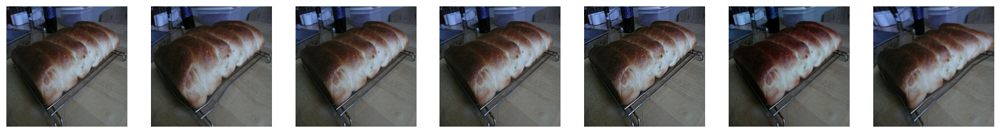

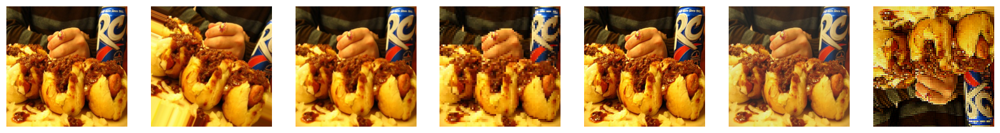

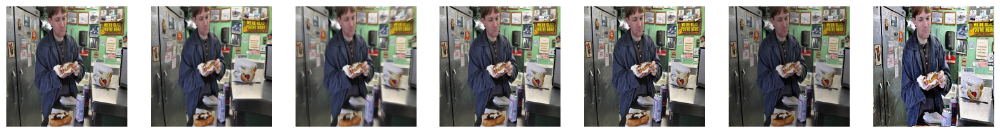

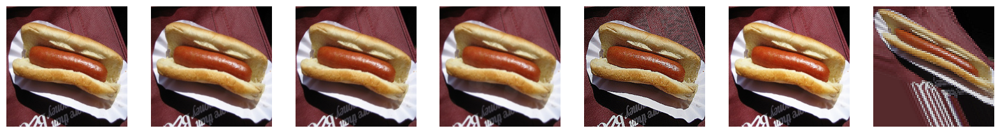

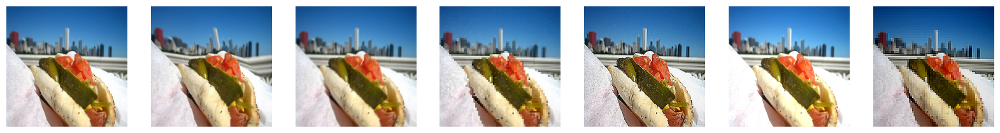

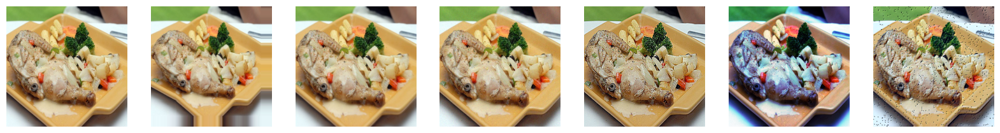

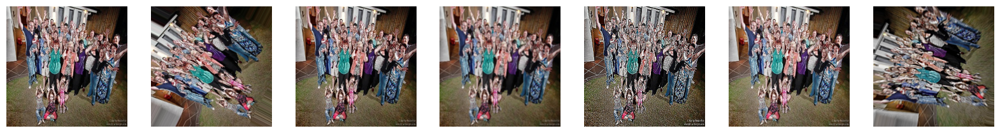

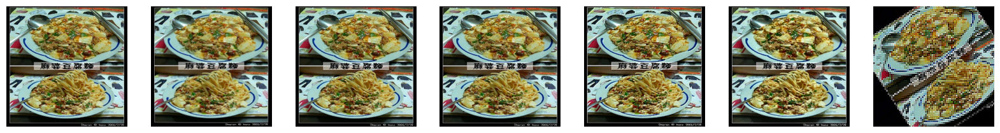

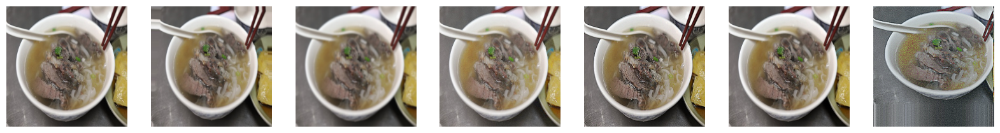

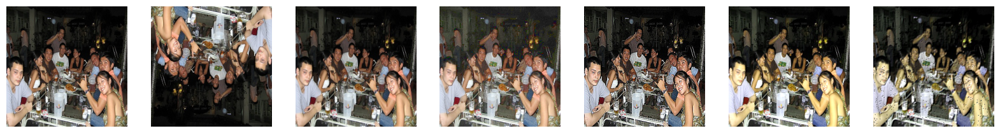

In [11]:
print("\tINITIAL\t\t\tAFFINE\t\t\tBLUR\t\t\tNOISE\t\t\tSHARPEN\t\t\tCOLORS\t\t\tCOMBINED")
for i in range(5):
    image, _ = train_dataset[random.randint(0, train_dataset.lens[0])]
    test_transformers(transformations, image.permute(1, 2, 0).cpu().numpy())

for i in range(5):
    image, _ = train_dataset[random.randint(train_dataset.lens[0], len(train_dataset))]
    test_transformers(transformations, image.permute(1, 2, 0).cpu().numpy())

In [12]:
transform = A.Compose([A.Resize(224, 224),
                       A.Normalize(mean=mean.tolist(), std=std.tolist()),
                       ToTensorV2()])

In [13]:
def transform_label(label):
    if label.startswith('not'):
        return torch.FloatTensor([0]).to(device)
    return torch.FloatTensor([1]).to(device)

In [14]:
train_dataset.transform = transform
val_dataset.transform = transform
test_dataset.transform = transform

train_dataset.transform_aug = transformations

train_dataset.target_transform = transform_label
val_dataset.target_transform = transform_label
test_dataset.target_transform = transform_label

# ***Dataloaders***

In [15]:
print(len(train_dataset))
print(len(val_dataset))
print(len(test_dataset))

2037
872
644


In [16]:
batch_size = 32
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size)


# ***Model***

In [32]:
class Residual(nn.Module):
    def __init__(self, channels_num):
        super().__init__()
        
        self.conv1 = nn.Conv2d(4 * channels_num, channels_num, 1, bias=False)
        nn.init.kaiming_normal_(self.conv1.weight, nonlinearity='selu')
        self.bn1 = nn.BatchNorm2d(channels_num)
        
        self.conv2 = nn.Conv2d(channels_num, channels_num, 3, padding='same', bias=False)
        nn.init.kaiming_normal_(self.conv2.weight, nonlinearity='selu')
        self.bn2 = nn.BatchNorm2d(channels_num)
        
        self.conv3 = nn.Conv2d(channels_num, 4 * channels_num, 1, bias=False)
        nn.init.kaiming_normal_(self.conv3.weight, nonlinearity='selu')
        self.bn3 = nn.BatchNorm2d(4 * channels_num)
        
        self.swish = nn.SiLU()
        
    def forward(self, x):
        x_ = self.swish(self.bn1(self.conv1(x)))
        x_ = self.swish(self.bn2(self.conv2(x_)))
        x_ = self.swish(self.bn3(self.conv3(x_)))
        
        x_ = x_ + x
        
        return x_
    

class DownSampling(nn.Module):
    def __init__(self, c_in, c_out, stride):
        super().__init__()
        
        self.conv1 = nn.Conv2d(c_in, c_out // 4, 1, bias=False)
        nn.init.kaiming_normal_(self.conv1.weight, nonlinearity='selu')
        self.bn1 = nn.BatchNorm2d(c_out // 4)
        
        self.conv2 = nn.Conv2d(c_out // 4, c_out // 4, 3, stride=stride, padding=1, bias=False)
        nn.init.kaiming_normal_(self.conv2.weight, nonlinearity='selu')
        self.bn2 = nn.BatchNorm2d(c_out // 4)
        
        self.conv3 = nn.Conv2d(c_out // 4, c_out, 1, bias=False)
        nn.init.kaiming_normal_(self.conv3.weight, nonlinearity='selu')
        self.bn3 = nn.BatchNorm2d(c_out)
        
        self.extra = nn.Conv2d(c_in, c_out, 1, stride=stride, bias=False)
        nn.init.kaiming_normal_(self.extra.weight, nonlinearity='selu')
        self.bn_extra = nn.BatchNorm2d(c_out)
        
        self.swish = nn.SiLU()
        
    def forward(self, x):
        x_ = self.swish(self.bn1(self.conv1(x)))
        x_ = self.swish(self.bn2(self.conv2(x_)))
        x_ = self.swish(self.bn3(self.conv3(x_)))
        
        x = self.bn_extra(self.extra(x))
        x_ = x_ + x
        
        return x_
        

class CustomModel(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.conv1 = nn.Conv2d(3, 64, 3, padding=1, stride=2, bias=False)
        nn.init.kaiming_normal_(self.conv1.weight, nonlinearity='selu')
        self.bn1 = nn.BatchNorm2d(64)
        
        self.conv2 = nn.Conv2d(64, 64, 3, padding='same', bias=False)
        nn.init.kaiming_normal_(self.conv2.weight, nonlinearity='selu')
        self.bn2 = nn.BatchNorm2d(64)
        
        self.conv3 = nn.Conv2d(64, 64, 3, padding='same', bias=False)
        nn.init.kaiming_normal_(self.conv3.weight, nonlinearity='selu')
        self.bn3 = nn.BatchNorm2d(64)
        
        self.max_pool = nn.MaxPool2d(3, 2, 1)
        
        self.block1 = nn.Sequential(DownSampling(64, 256, 1),
                                    Residual(64),
                                    Residual(64))
        
        self.block2 = nn.Sequential(DownSampling(256, 512, 2),
                                    Residual(128),
                                    Residual(128),
                                    Residual(128),
                                    Residual(128),
                                    Residual(128),
                                    Residual(128),
                                    Residual(128))
        
        self.block3 = nn.Sequential(DownSampling(512, 1024, 2),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256),
                                    Residual(256))
        
        self.block4 = nn.Sequential(DownSampling(1024, 2048, 2),
                                    Residual(512),
                                    Residual(512))
        
        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()
        
        self.fc1 = nn.Linear(2048, 512)
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='selu')
        self.bn4 = nn.BatchNorm1d(512)
        
        self.fc2 = nn.Linear(512, 128)
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='selu')
        self.bn5 = nn.BatchNorm1d(128)
        
        self.fc3 = nn.Linear(128, 1)
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='sigmoid')
        
        self.swish = nn.SiLU()
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        x = self.swish(self.bn1(self.conv1(x)))
        x = self.swish(self.bn2(self.conv2(x)))
        x = self.swish(self.bn3(self.conv3(x)))
        x = self.max_pool(x)
        
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        
        x = self.avg_pool(x)
        x = self.flatten(x)
        
        x = self.bn4(self.swish(self.fc1(x)))
        x = self.bn5(self.swish(self.fc2(x)))
        x = self.sigmoid(self.fc3(x))
        
        return x

In [18]:
def predict(model, images_path):
    for root, _, files in os.walk(images_path):
        for file in files:
            image = cv2.imread(root + '/' + file)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image_transformed = transform(image=image)['image'].to(device)

            prediction = model(image_transformed[None, :, :, :]).item()
            prediction = 1 if prediction > TRESHOLD else 0
            
            plt.imshow(image)
            h, w, _ = image.shape
            plt.text(0.005 * w, 0.05 * h, labels[prediction], c='b')
            plt.savefig(f'predicted/{file}')
            plt.show()

In [19]:
def train_loop(dataloader, model, criterion, optimizer):
    print('----------------- Training -----------------')
    model.train()

    running_loss = 0
    TP, TN, FP, FN = 0, 0, 0, 0

    size = len(dataloader.dataset)
    num_batches = len(dataloader)

    start = datetime.datetime.now()
    for batch, (images, labels) in enumerate(dataloader):
        pred = model(images)
        loss = criterion(pred, labels)
        running_loss += loss.item()

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        pred = torch.where(pred > TRESHOLD, 1, 0)
        TP += ((pred == 1) & (labels == 1)).sum().item()
        TN += ((pred == 0) & (labels == 0)).sum().item()
        FP += ((pred == 1) & (labels == 0)).sum().item()
        FN += ((pred == 0) & (labels == 1)).sum().item()

        if batch % 10 == 0:
            loss, current = loss.item(), batch * dataloader.batch_size + len(images)
            finish = datetime.datetime.now()
            difference = finish - start
            print(f'loss: {loss:>7f} [{current:>5d}/{size:>5d} images] [{batch + 1}/{num_batches} batches] {difference}')

    loss = running_loss / num_batches
    accuracy = (TP + TN) / (TP + FP + TN + FN)
    precision = TP / (TP + FP) if TP + FP != 0 else 0
    recall = TP / (TP + FN) if TP + FN != 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if precision + recall != 0 else 0

    print(f'\tAvg loss: {loss:>3f}')
    print(f'\tAccuracy: {(100 * accuracy):>0.1f}%')
    print(f'\tPrecision: {(100 * precision):>0.1f}%')
    print(f'\tRecall: {(100 * recall):>0.1f}%')
    print(f'\tF1: {(100 * f1):>0.1f}%')

    print('----------------- Finished training! -----------------\n')

    return {'loss': loss,
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1}

In [20]:
def val_loop(dataloader, model, criterion, mode='Validation'):
    print(f'----------------- {mode} -----------------')
    model.eval()

    loss = 0
    TP, TN, FP, FN = 0, 0, 0, 0

    num_batches = len(dataloader)

    with torch.no_grad():
        for images, labels in iter(dataloader):
            pred = model(images)
            loss += criterion(pred, labels).item()

            pred = torch.where(pred > TRESHOLD, 1, 0)
            TP += ((pred == 1) & (labels == 1)).sum().item()
            TN += ((pred == 0) & (labels == 0)).sum().item()
            FP += ((pred == 1) & (labels == 0)).sum().item()
            FN += ((pred == 0) & (labels == 1)).sum().item()

    loss /= num_batches
    accuracy = (TP + TN) / (TP + FP + TN + FN)
    precision = TP / (TP + FP) if TP + FP != 0 else 0
    recall = TP / (TP + FN) if TP + FN != 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if precision + recall != 0 else 0

    print(f'\tAvg loss: {loss:>3f}')
    print(f'\tAccuracy: {(100 * accuracy):>0.1f}%')
    print(f'\tPrecision: {(100 * precision):>0.1f}%')
    print(f'\tRecall: {(100 * recall):>0.1f}%')
    print(f'\tF1: {(100 * f1):>0.1f}%')

    print(f'----------------- Finished {mode.lower()}! -----------------\n')

    return {'loss': loss,
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1}

In [21]:
def plotting(metrics_history, lrs=None, mode=''):
    plt.figure(figsize=(25, 25))
    plt.suptitle("Metrics")

    num_epochs = len(next(iter(next(iter(metrics_history.values())).values())))
    epochs_range = range(1, num_epochs + 1)

    if lrs != None:
        num_rows = math.ceil((len(metrics_history) + 1) / 2)
        add_to_idx = 2
        plt.subplot(num_rows, 2, 1)
        plt.plot(epochs_range, lrs)
        plt.title("Learing Rate")
        plt.xlabel("Epoch №")
    else:
        num_rows = math.ceil(len(metrics_history) / 2)
        add_to_idx = 1

    for idx, (title, metrics) in enumerate(metrics_history.items()):
        plt.subplot(num_rows, 2, idx + add_to_idx)
        for (label, value) in metrics.items():
            plt.plot(epochs_range, value, label=label)
        plt.title(title)
        plt.xlabel("Epoch №")
        plt.legend()

    plt.savefig(f'train/metrics_{mode}.jpg')
    plt.close()

In [22]:
def extend_metrics(metrics_history, new_data, mode):
    for label in metrics_history.keys():
        metrics_history[label][mode].append(new_data[label])

In [23]:
def load_model(pretrained=False):
    if pretrained and os.path.exists('train/best_model.pth'):
        model = torch.load('train/best_model.pth',
                           map_location=device)
    else:
        model = CustomModel().to(device)
    return model

In [27]:
def training(model, optimizer, epochs_num, scheduler, mode='', save=False):
    print(f'\n~~~~~~~~~~~~~~~~~~~~~~~~~~~ START TRAINING ~~~~~~~~~~~~~~~~~~~~~~~~~~~\n')
    writer =  SummaryWriter()
    metrics_history = {metric: {mode: [] for mode in ['train',
                                                      'validation']}
                       for metric in ['loss',
                                      'accuracy',
                                      'precision',
                                      'recall',
                                      'f1']}
    lrs = []
    best_f1 = val_loop(val_dataloader, model, criterion)['f1']

    for epoch in range(epochs_num):
        print(f"\n---------------------------------- Epoch {epoch + 1} ----------------------------------\n")

        lr = optimizer.param_groups[0]["lr"]
        lrs.append(lr)
        print(f'lr = {lr}')
        writer.add_scalar('Learning rate', lr, epoch + 1)

        new_metrics = train_loop(train_dataloader, model, criterion, optimizer)
        extend_metrics(metrics_history, new_metrics, 'train')
        writer.add_scalars('Metrics_train', dict(list(new_metrics.items())[1:]), epoch + 1)
        train_loss = new_metrics['loss']

        new_metrics = val_loop(val_dataloader, model, criterion)
        extend_metrics(metrics_history, new_metrics, 'validation')
        writer.add_scalars('Metrics_val', dict(list(new_metrics.items())[1:]), epoch + 1)
        val_loss = new_metrics['loss']
        
        writer.add_scalars('Loss', {'val': val_loss, 
                                    'train': train_loss}, epoch + 1)

        if scheduler is not None:
            scheduler.step(val_loss)

        if save:
            if best_f1 < new_metrics['f1']:
                best_f1 = new_metrics['f1']
                torch.save(model, 'train/best_model.pth')

        plotting(metrics_history, lrs, mode)

    if save:
        torch.save(model, 'train/last_model.pth')
    
    writer.flush()
    writer.close()

# ***Training***

In [ ]:
model = load_model()

criterion = nn.BCELoss()
optimizer = optim.AdamW(model.parameters(), lr=5e-4)
epochs_num = 1000
scheduler = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=1e-3, total_steps=10)

training(model, optimizer, epochs_num, scheduler, 'training_results_the_deepest', save=True)


~~~~~~~~~~~~~~~~~~~~~~~~~~~ START TRAINING ~~~~~~~~~~~~~~~~~~~~~~~~~~~

----------------- Validation -----------------
	Avg loss: 0.695051
	Accuracy: 48.4%
	Precision: 48.4%
	Recall: 100.0%
	F1: 65.2%
----------------- Finished validation! -----------------


---------------------------------- Epoch 1 ----------------------------------

lr = 3.9999999999999996e-05
----------------- Training -----------------
loss: 0.919943 [   32/ 2037 images] [1/64 batches] 0:00:02.476919
loss: 0.771677 [  352/ 2037 images] [11/64 batches] 0:00:25.589355
loss: 0.640095 [  672/ 2037 images] [21/64 batches] 0:00:46.848140
loss: 0.778654 [  992/ 2037 images] [31/64 batches] 0:01:10.267259
loss: 0.680731 [ 1312/ 2037 images] [41/64 batches] 0:01:32.363986
loss: 0.737272 [ 1632/ 2037 images] [51/64 batches] 0:01:54.322518
loss: 0.680124 [ 1952/ 2037 images] [61/64 batches] 0:02:17.631773
	Avg loss: 0.698385
	Accuracy: 58.2%
	Precision: 55.9%
	Recall: 64.8%
	F1: 60.0%
----------------- Finished training! -

/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 2 ----------------------------------

lr = 0.0002768195702364272
----------------- Training -----------------
loss: 0.712289 [   32/ 2037 images] [1/64 batches] 0:00:02.473207
loss: 0.677530 [  352/ 2037 images] [11/64 batches] 0:00:25.617150
loss: 0.704360 [  672/ 2037 images] [21/64 batches] 0:00:48.802791
loss: 0.660269 [  992/ 2037 images] [31/64 batches] 0:01:12.283215
loss: 0.717320 [ 1312/ 2037 images] [41/64 batches] 0:01:36.632514
loss: 0.688728 [ 1632/ 2037 images] [51/64 batches] 0:01:59.046979
loss: 0.693045 [ 1952/ 2037 images] [61/64 batches] 0:02:20.461121
	Avg loss: 0.689068
	Accuracy: 59.1%
	Precision: 56.8%
	Recall: 65.3%
	F1: 60.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.651992
	Accuracy: 61.9%
	Precision: 59.6%
	Recall: 66.1%
	F1: 62.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 3 ----------------------------------

lr = 0.00027048272944873086
----------------- Training -----------------
loss: 0.784480 [   32/ 2037 images] [1/64 batches] 0:00:02.048284
loss: 0.582330 [  352/ 2037 images] [11/64 batches] 0:00:23.367295
loss: 0.691985 [  672/ 2037 images] [21/64 batches] 0:00:45.925134
loss: 0.664126 [  992/ 2037 images] [31/64 batches] 0:01:09.696494
loss: 0.719265 [ 1312/ 2037 images] [41/64 batches] 0:01:33.916849
loss: 0.672021 [ 1632/ 2037 images] [51/64 batches] 0:01:56.515443
loss: 0.614312 [ 1952/ 2037 images] [61/64 batches] 0:02:19.276355
	Avg loss: 0.652799
	Accuracy: 62.4%
	Precision: 60.6%
	Recall: 64.2%
	F1: 62.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.689839
	Accuracy: 62.2%
	Precision: 60.0%
	Recall: 65.2%
	F1: 62.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 4 ----------------------------------

lr = 0.0002952866739563717
----------------- Training -----------------
loss: 0.674839 [   32/ 2037 images] [1/64 batches] 0:00:02.153063
loss: 0.623021 [  352/ 2037 images] [11/64 batches] 0:00:25.673211
loss: 0.712953 [  672/ 2037 images] [21/64 batches] 0:00:46.514852
loss: 0.616085 [  992/ 2037 images] [31/64 batches] 0:01:08.491582
loss: 0.603991 [ 1312/ 2037 images] [41/64 batches] 0:01:31.357758
loss: 0.683176 [ 1632/ 2037 images] [51/64 batches] 0:01:53.797780
loss: 0.717681 [ 1952/ 2037 images] [61/64 batches] 0:02:17.117568
	Avg loss: 0.646768
	Accuracy: 63.2%
	Precision: 61.4%
	Recall: 64.7%
	F1: 63.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.627836
	Accuracy: 65.9%
	Precision: 65.7%
	Recall: 62.1%
	F1: 63.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 5 ----------------------------------

lr = 0.0002551067063841833
----------------- Training -----------------
loss: 0.636196 [   32/ 2037 images] [1/64 batches] 0:00:02.368136
loss: 0.662353 [  352/ 2037 images] [11/64 batches] 0:00:25.042803
loss: 0.607353 [  672/ 2037 images] [21/64 batches] 0:00:46.568827
loss: 0.843412 [  992/ 2037 images] [31/64 batches] 0:01:10.751510
loss: 0.618529 [ 1312/ 2037 images] [41/64 batches] 0:01:33.354791
loss: 0.637780 [ 1632/ 2037 images] [51/64 batches] 0:01:55.366731
loss: 0.814228 [ 1952/ 2037 images] [61/64 batches] 0:02:16.710032
	Avg loss: 0.625371
	Accuracy: 63.5%
	Precision: 61.5%
	Recall: 66.1%
	F1: 63.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.589158
	Accuracy: 68.3%
	Precision: 68.9%
	Recall: 63.0%
	F1: 65.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 6 ----------------------------------

lr = 0.00023129062567007748
----------------- Training -----------------
loss: 0.705703 [   32/ 2037 images] [1/64 batches] 0:00:02.291740
loss: 0.584453 [  352/ 2037 images] [11/64 batches] 0:00:22.389942
loss: 0.555852 [  672/ 2037 images] [21/64 batches] 0:00:46.069395
loss: 0.533943 [  992/ 2037 images] [31/64 batches] 0:01:06.506159
loss: 0.605122 [ 1312/ 2037 images] [41/64 batches] 0:01:29.788473
loss: 0.582346 [ 1632/ 2037 images] [51/64 batches] 0:01:52.642329
loss: 0.678930 [ 1952/ 2037 images] [61/64 batches] 0:02:14.540195
	Avg loss: 0.608249
	Accuracy: 67.9%
	Precision: 66.7%
	Recall: 67.5%
	F1: 67.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.597627
	Accuracy: 69.8%
	Precision: 66.7%
	Recall: 75.4%
	F1: 70.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 7 ----------------------------------

lr = 0.0002364174094017155
----------------- Training -----------------
loss: 0.587722 [   32/ 2037 images] [1/64 batches] 0:00:03.078214
loss: 0.637292 [  352/ 2037 images] [11/64 batches] 0:00:25.231053
loss: 0.443843 [  672/ 2037 images] [21/64 batches] 0:00:48.683494
loss: 0.456888 [  992/ 2037 images] [31/64 batches] 0:01:10.539022
loss: 0.546338 [ 1312/ 2037 images] [41/64 batches] 0:01:35.377170
loss: 0.776587 [ 1632/ 2037 images] [51/64 batches] 0:01:58.231772
loss: 0.662638 [ 1952/ 2037 images] [61/64 batches] 0:02:24.185212
	Avg loss: 0.601103
	Accuracy: 68.6%
	Precision: 66.5%
	Recall: 70.7%
	F1: 68.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.611210
	Accuracy: 67.7%
	Precision: 63.7%
	Recall: 77.0%
	F1: 69.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 8 ----------------------------------

lr = 0.00024474422999865
----------------- Training -----------------
loss: 0.599263 [   32/ 2037 images] [1/64 batches] 0:00:02.535031
loss: 0.490118 [  352/ 2037 images] [11/64 batches] 0:00:25.868106
loss: 0.505485 [  672/ 2037 images] [21/64 batches] 0:00:47.194410
loss: 0.699425 [  992/ 2037 images] [31/64 batches] 0:01:08.536722
loss: 0.604687 [ 1312/ 2037 images] [41/64 batches] 0:01:30.200540
loss: 0.827655 [ 1632/ 2037 images] [51/64 batches] 0:01:52.503995
loss: 0.656549 [ 1952/ 2037 images] [61/64 batches] 0:02:15.381201
	Avg loss: 0.600827
	Accuracy: 68.9%
	Precision: 66.7%
	Recall: 71.5%
	F1: 69.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.566554
	Accuracy: 71.8%
	Precision: 73.0%
	Recall: 66.1%
	F1: 69.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 9 ----------------------------------

lr = 0.0002178604242006546
----------------- Training -----------------
loss: 0.548190 [   32/ 2037 images] [1/64 batches] 0:00:02.392967
loss: 0.622998 [  352/ 2037 images] [11/64 batches] 0:00:24.961558
loss: 0.607130 [  672/ 2037 images] [21/64 batches] 0:00:47.313644
loss: 0.561050 [  992/ 2037 images] [31/64 batches] 0:01:09.642491
loss: 0.461927 [ 1312/ 2037 images] [41/64 batches] 0:01:32.412582
loss: 0.429693 [ 1632/ 2037 images] [51/64 batches] 0:01:54.070602
loss: 0.596490 [ 1952/ 2037 images] [61/64 batches] 0:02:16.138387
	Avg loss: 0.572248
	Accuracy: 70.3%
	Precision: 68.8%
	Recall: 70.5%
	F1: 69.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.574152
	Accuracy: 70.6%
	Precision: 70.3%
	Recall: 68.0%
	F1: 69.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 10 ----------------------------------

lr = 0.00022233330718178707
----------------- Training -----------------
loss: 0.599022 [   32/ 2037 images] [1/64 batches] 0:00:02.599648
loss: 0.428285 [  352/ 2037 images] [11/64 batches] 0:00:23.731997
loss: 0.549674 [  672/ 2037 images] [21/64 batches] 0:00:44.940748
loss: 0.487157 [  992/ 2037 images] [31/64 batches] 0:01:06.392614
loss: 0.553236 [ 1312/ 2037 images] [41/64 batches] 0:01:27.367009
loss: 0.446918 [ 1632/ 2037 images] [51/64 batches] 0:01:51.317017
loss: 0.609203 [ 1952/ 2037 images] [61/64 batches] 0:02:15.865190
	Avg loss: 0.576523
	Accuracy: 69.0%
	Precision: 69.2%
	Recall: 65.0%
	F1: 67.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.519166
	Accuracy: 73.7%
	Precision: 68.5%
	Recall: 84.6%
	F1: 75.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 11 ----------------------------------

lr = 0.0001909590922902413
----------------- Training -----------------
loss: 0.525022 [   32/ 2037 images] [1/64 batches] 0:00:02.155833
loss: 0.510291 [  352/ 2037 images] [11/64 batches] 0:00:26.008111
loss: 0.657711 [  672/ 2037 images] [21/64 batches] 0:00:49.117659
loss: 0.560623 [  992/ 2037 images] [31/64 batches] 0:01:12.047212
loss: 0.480243 [ 1312/ 2037 images] [41/64 batches] 0:01:34.369049
loss: 0.489576 [ 1632/ 2037 images] [51/64 batches] 0:01:56.678782
loss: 0.550929 [ 1952/ 2037 images] [61/64 batches] 0:02:19.722154
	Avg loss: 0.564788
	Accuracy: 71.1%
	Precision: 70.2%
	Recall: 70.1%
	F1: 70.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.545251
	Accuracy: 74.0%
	Precision: 70.9%
	Recall: 78.4%
	F1: 74.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 12 ----------------------------------

lr = 0.00020555070339037989
----------------- Training -----------------
loss: 0.522607 [   32/ 2037 images] [1/64 batches] 0:00:01.745371
loss: 0.647881 [  352/ 2037 images] [11/64 batches] 0:00:26.193921
loss: 0.651209 [  672/ 2037 images] [21/64 batches] 0:00:50.001915
loss: 0.565213 [  992/ 2037 images] [31/64 batches] 0:01:14.312392
loss: 0.657513 [ 1312/ 2037 images] [41/64 batches] 0:01:35.127751
loss: 0.510815 [ 1632/ 2037 images] [51/64 batches] 0:01:56.916944
loss: 0.406078 [ 1952/ 2037 images] [61/64 batches] 0:02:19.732481
	Avg loss: 0.531129
	Accuracy: 74.5%
	Precision: 73.5%
	Recall: 74.0%
	F1: 73.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.486931
	Accuracy: 77.4%
	Precision: 71.3%
	Recall: 89.1%
	F1: 79.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 13 ----------------------------------

lr = 0.00017369332218153855
----------------- Training -----------------
loss: 0.381018 [   32/ 2037 images] [1/64 batches] 0:00:02.509702
loss: 0.531123 [  352/ 2037 images] [11/64 batches] 0:00:25.108258
loss: 0.577009 [  672/ 2037 images] [21/64 batches] 0:00:47.884728
loss: 0.496021 [  992/ 2037 images] [31/64 batches] 0:01:10.342410
loss: 0.563985 [ 1312/ 2037 images] [41/64 batches] 0:01:32.278173
loss: 0.473666 [ 1632/ 2037 images] [51/64 batches] 0:01:55.826853
loss: 0.515907 [ 1952/ 2037 images] [61/64 batches] 0:02:18.589944
	Avg loss: 0.542980
	Accuracy: 73.6%
	Precision: 75.2%
	Recall: 68.0%
	F1: 71.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.501718
	Accuracy: 76.3%
	Precision: 78.8%
	Recall: 69.7%
	F1: 74.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 14 ----------------------------------

lr = 0.00018150575477584175
----------------- Training -----------------
loss: 0.622847 [   32/ 2037 images] [1/64 batches] 0:00:02.508464
loss: 0.455026 [  352/ 2037 images] [11/64 batches] 0:00:26.140602
loss: 0.346417 [  672/ 2037 images] [21/64 batches] 0:00:49.158285
loss: 0.532036 [  992/ 2037 images] [31/64 batches] 0:01:12.590198
loss: 0.534041 [ 1312/ 2037 images] [41/64 batches] 0:01:36.200761
loss: 0.438321 [ 1632/ 2037 images] [51/64 batches] 0:01:58.795029
loss: 0.456855 [ 1952/ 2037 images] [61/64 batches] 0:02:22.393384
	Avg loss: 0.519474
	Accuracy: 74.5%
	Precision: 74.5%
	Recall: 72.0%
	F1: 73.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.563532
	Accuracy: 75.6%
	Precision: 74.2%
	Recall: 75.8%
	F1: 75.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 15 ----------------------------------

lr = 0.00021609322286150322
----------------- Training -----------------
loss: 0.484312 [   32/ 2037 images] [1/64 batches] 0:00:02.425328
loss: 0.404996 [  352/ 2037 images] [11/64 batches] 0:00:23.268674
loss: 0.675939 [  672/ 2037 images] [21/64 batches] 0:00:46.384464
loss: 0.497474 [  992/ 2037 images] [31/64 batches] 0:01:09.868906
loss: 0.605866 [ 1312/ 2037 images] [41/64 batches] 0:01:32.514668
loss: 0.525788 [ 1632/ 2037 images] [51/64 batches] 0:01:55.076868
loss: 0.362355 [ 1952/ 2037 images] [61/64 batches] 0:02:19.751336
	Avg loss: 0.531012
	Accuracy: 73.9%
	Precision: 73.8%
	Recall: 71.4%
	F1: 72.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.511659
	Accuracy: 74.1%
	Precision: 68.5%
	Recall: 86.0%
	F1: 76.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 16 ----------------------------------

lr = 0.00018686105961042226
----------------- Training -----------------
loss: 0.481510 [   32/ 2037 images] [1/64 batches] 0:00:02.443223
loss: 0.306880 [  352/ 2037 images] [11/64 batches] 0:00:23.250321
loss: 0.496642 [  672/ 2037 images] [21/64 batches] 0:00:46.899300
loss: 0.444088 [  992/ 2037 images] [31/64 batches] 0:01:09.292708
loss: 0.540613 [ 1312/ 2037 images] [41/64 batches] 0:01:32.715058
loss: 0.660749 [ 1632/ 2037 images] [51/64 batches] 0:01:56.920675
loss: 0.642455 [ 1952/ 2037 images] [61/64 batches] 0:02:19.209291
	Avg loss: 0.528037
	Accuracy: 73.7%
	Precision: 73.1%
	Recall: 72.4%
	F1: 72.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.472950
	Accuracy: 77.3%
	Precision: 77.2%
	Recall: 75.4%
	F1: 76.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 17 ----------------------------------

lr = 0.0001664776348603217
----------------- Training -----------------
loss: 0.470240 [   32/ 2037 images] [1/64 batches] 0:00:02.342807
loss: 0.663053 [  352/ 2037 images] [11/64 batches] 0:00:26.111239
loss: 0.563563 [  672/ 2037 images] [21/64 batches] 0:00:49.296249
loss: 0.431608 [  992/ 2037 images] [31/64 batches] 0:01:12.700178
loss: 0.509288 [ 1312/ 2037 images] [41/64 batches] 0:01:34.798412
loss: 0.331492 [ 1632/ 2037 images] [51/64 batches] 0:01:57.609872
loss: 0.455768 [ 1952/ 2037 images] [61/64 batches] 0:02:19.936634
	Avg loss: 0.500490
	Accuracy: 76.5%
	Precision: 76.3%
	Recall: 74.7%
	F1: 75.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.439577
	Accuracy: 78.8%
	Precision: 76.4%
	Recall: 81.3%
	F1: 78.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 18 ----------------------------------

lr = 0.0001499502515003977
----------------- Training -----------------
loss: 0.457314 [   32/ 2037 images] [1/64 batches] 0:00:01.985769
loss: 0.414179 [  352/ 2037 images] [11/64 batches] 0:00:24.550633
loss: 0.486555 [  672/ 2037 images] [21/64 batches] 0:00:47.134512
loss: 0.733204 [  992/ 2037 images] [31/64 batches] 0:01:09.081475
loss: 0.490752 [ 1312/ 2037 images] [41/64 batches] 0:01:33.090315
loss: 0.439672 [ 1632/ 2037 images] [51/64 batches] 0:01:54.993047
loss: 0.668965 [ 1952/ 2037 images] [61/64 batches] 0:02:17.737970
	Avg loss: 0.512052
	Accuracy: 75.0%
	Precision: 74.2%
	Recall: 74.3%
	F1: 74.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.441170
	Accuracy: 79.4%
	Precision: 79.4%
	Recall: 77.5%
	F1: 78.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 19 ----------------------------------

lr = 0.00015071652263440002
----------------- Training -----------------
loss: 0.461945 [   32/ 2037 images] [1/64 batches] 0:00:02.073389
loss: 0.488795 [  352/ 2037 images] [11/64 batches] 0:00:23.974432
loss: 0.504768 [  672/ 2037 images] [21/64 batches] 0:00:46.940355
loss: 0.641922 [  992/ 2037 images] [31/64 batches] 0:01:09.237480
loss: 0.477516 [ 1312/ 2037 images] [41/64 batches] 0:01:32.616908
loss: 0.563118 [ 1632/ 2037 images] [51/64 batches] 0:01:54.921709
loss: 0.486757 [ 1952/ 2037 images] [61/64 batches] 0:02:15.319730
	Avg loss: 0.478028
	Accuracy: 76.5%
	Precision: 76.2%
	Recall: 75.0%
	F1: 75.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.482603
	Accuracy: 76.9%
	Precision: 73.8%
	Recall: 81.3%
	F1: 77.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 20 ----------------------------------

lr = 0.00017144140881064477
----------------- Training -----------------
loss: 0.640158 [   32/ 2037 images] [1/64 batches] 0:00:02.192870
loss: 0.456362 [  352/ 2037 images] [11/64 batches] 0:00:24.568498
loss: 0.449923 [  672/ 2037 images] [21/64 batches] 0:00:46.667041
loss: 0.483388 [  992/ 2037 images] [31/64 batches] 0:01:07.857997
loss: 0.542703 [ 1312/ 2037 images] [41/64 batches] 0:01:32.635875
loss: 0.369810 [ 1632/ 2037 images] [51/64 batches] 0:01:55.395540
loss: 0.705560 [ 1952/ 2037 images] [61/64 batches] 0:02:17.253563
	Avg loss: 0.487743
	Accuracy: 76.7%
	Precision: 77.2%
	Recall: 73.6%
	F1: 75.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.500593
	Accuracy: 76.8%
	Precision: 70.3%
	Recall: 90.3%
	F1: 79.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 21 ----------------------------------

lr = 0.00018090508112867493
----------------- Training -----------------
loss: 0.416759 [   32/ 2037 images] [1/64 batches] 0:00:02.069984
loss: 0.522167 [  352/ 2037 images] [11/64 batches] 0:00:23.891038
loss: 0.288434 [  672/ 2037 images] [21/64 batches] 0:00:46.096483
loss: 0.389667 [  992/ 2037 images] [31/64 batches] 0:01:07.513194
loss: 0.521893 [ 1312/ 2037 images] [41/64 batches] 0:01:29.161632
loss: 0.454991 [ 1632/ 2037 images] [51/64 batches] 0:01:53.460728
loss: 0.501038 [ 1952/ 2037 images] [61/64 batches] 0:02:16.813795
	Avg loss: 0.465329
	Accuracy: 77.8%
	Precision: 78.6%
	Recall: 74.5%
	F1: 76.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.451953
	Accuracy: 79.9%
	Precision: 77.5%
	Recall: 82.5%
	F1: 79.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 22 ----------------------------------

lr = 0.0001559634227252134
----------------- Training -----------------
loss: 0.707507 [   32/ 2037 images] [1/64 batches] 0:00:02.095785
loss: 0.610477 [  352/ 2037 images] [11/64 batches] 0:00:27.991908
loss: 0.484413 [  672/ 2037 images] [21/64 batches] 0:00:51.564818
loss: 0.402044 [  992/ 2037 images] [31/64 batches] 0:01:16.072125
loss: 0.636085 [ 1312/ 2037 images] [41/64 batches] 0:01:41.790657
loss: 0.608590 [ 1632/ 2037 images] [51/64 batches] 0:02:05.856971
loss: 0.446370 [ 1952/ 2037 images] [61/64 batches] 0:02:29.267335
	Avg loss: 0.490040
	Accuracy: 75.7%
	Precision: 75.7%
	Recall: 73.5%
	F1: 74.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.502124
	Accuracy: 78.9%
	Precision: 71.7%
	Recall: 93.1%
	F1: 81.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 23 ----------------------------------

lr = 0.00018172278564728501
----------------- Training -----------------
loss: 0.546684 [   32/ 2037 images] [1/64 batches] 0:00:02.650516
loss: 0.506446 [  352/ 2037 images] [11/64 batches] 0:00:26.513383
loss: 0.371174 [  672/ 2037 images] [21/64 batches] 0:00:49.606067
loss: 0.489227 [  992/ 2037 images] [31/64 batches] 0:01:15.764809
loss: 0.637992 [ 1312/ 2037 images] [41/64 batches] 0:01:39.615838
loss: 0.399605 [ 1632/ 2037 images] [51/64 batches] 0:02:01.988884
loss: 0.469508 [ 1952/ 2037 images] [61/64 batches] 0:02:22.240098
	Avg loss: 0.473956
	Accuracy: 77.8%
	Precision: 78.3%
	Recall: 74.9%
	F1: 76.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.467236
	Accuracy: 76.4%
	Precision: 79.7%
	Recall: 68.7%
	F1: 73.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 24 ----------------------------------

lr = 0.00016357776034310622
----------------- Training -----------------
loss: 0.683133 [   32/ 2037 images] [1/64 batches] 0:00:02.047516
loss: 0.447781 [  352/ 2037 images] [11/64 batches] 0:00:26.142671
loss: 0.606339 [  672/ 2037 images] [21/64 batches] 0:00:47.820405
loss: 0.302109 [  992/ 2037 images] [31/64 batches] 0:01:10.005478
loss: 0.547244 [ 1312/ 2037 images] [41/64 batches] 0:01:31.035185
loss: 0.380884 [ 1632/ 2037 images] [51/64 batches] 0:01:56.275411
loss: 0.641668 [ 1952/ 2037 images] [61/64 batches] 0:02:17.729109
	Avg loss: 0.484093
	Accuracy: 76.5%
	Precision: 77.3%
	Recall: 72.9%
	F1: 75.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.458743
	Accuracy: 79.4%
	Precision: 74.4%
	Recall: 87.4%
	F1: 80.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 25 ----------------------------------

lr = 0.0001593204992209117
----------------- Training -----------------
loss: 0.528553 [   32/ 2037 images] [1/64 batches] 0:00:02.424026
loss: 0.386359 [  352/ 2037 images] [11/64 batches] 0:00:24.674860
loss: 0.342484 [  672/ 2037 images] [21/64 batches] 0:00:46.780072
loss: 0.389483 [  992/ 2037 images] [31/64 batches] 0:01:09.265220
loss: 0.373324 [ 1312/ 2037 images] [41/64 batches] 0:01:33.287859
loss: 0.283666 [ 1632/ 2037 images] [51/64 batches] 0:01:55.141825
loss: 0.586950 [ 1952/ 2037 images] [61/64 batches] 0:02:19.224713
	Avg loss: 0.470407
	Accuracy: 77.8%
	Precision: 77.0%
	Recall: 77.3%
	F1: 77.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.458906
	Accuracy: 78.0%
	Precision: 74.0%
	Recall: 84.1%
	F1: 78.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 26 ----------------------------------

lr = 0.00015940167738703632
----------------- Training -----------------
loss: 0.721505 [   32/ 2037 images] [1/64 batches] 0:00:02.339638
loss: 0.474215 [  352/ 2037 images] [11/64 batches] 0:00:25.279357
loss: 0.437236 [  672/ 2037 images] [21/64 batches] 0:00:49.869355
loss: 0.389314 [  992/ 2037 images] [31/64 batches] 0:01:12.077760
loss: 0.581820 [ 1312/ 2037 images] [41/64 batches] 0:01:34.645519
loss: 0.519857 [ 1632/ 2037 images] [51/64 batches] 0:01:57.474447
loss: 0.461081 [ 1952/ 2037 images] [61/64 batches] 0:02:21.381176
	Avg loss: 0.467979
	Accuracy: 77.4%
	Precision: 77.1%
	Recall: 75.9%
	F1: 76.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.487630
	Accuracy: 78.0%
	Precision: 73.6%
	Recall: 85.1%
	F1: 78.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 27 ----------------------------------

lr = 0.00017405812274933635
----------------- Training -----------------
loss: 0.570025 [   32/ 2037 images] [1/64 batches] 0:00:02.851698
loss: 0.522542 [  352/ 2037 images] [11/64 batches] 0:00:25.183762
loss: 0.395765 [  672/ 2037 images] [21/64 batches] 0:00:47.325924
loss: 0.653375 [  992/ 2037 images] [31/64 batches] 0:01:08.590399
loss: 0.389738 [ 1312/ 2037 images] [41/64 batches] 0:01:31.839486
loss: 0.511970 [ 1632/ 2037 images] [51/64 batches] 0:01:55.236483
loss: 0.453947 [ 1952/ 2037 images] [61/64 batches] 0:02:16.889858
	Avg loss: 0.472720
	Accuracy: 76.8%
	Precision: 76.4%
	Recall: 75.6%
	F1: 76.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.430600
	Accuracy: 79.5%
	Precision: 73.3%
	Recall: 90.5%
	F1: 81.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 28 ----------------------------------

lr = 0.00014567653407249062
----------------- Training -----------------
loss: 0.563818 [   32/ 2037 images] [1/64 batches] 0:00:01.936791
loss: 0.288972 [  352/ 2037 images] [11/64 batches] 0:00:25.841593
loss: 0.525020 [  672/ 2037 images] [21/64 batches] 0:00:47.854864
loss: 0.451998 [  992/ 2037 images] [31/64 batches] 0:01:10.692049
loss: 0.537266 [ 1312/ 2037 images] [41/64 batches] 0:01:33.672479
loss: 0.624663 [ 1632/ 2037 images] [51/64 batches] 0:01:55.847644
loss: 0.357633 [ 1952/ 2037 images] [61/64 batches] 0:02:16.750610
	Avg loss: 0.445416
	Accuracy: 80.1%
	Precision: 81.0%
	Recall: 77.0%
	F1: 79.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.405835
	Accuracy: 81.0%
	Precision: 83.5%
	Recall: 75.6%
	F1: 79.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 29 ----------------------------------

lr = 0.00013427408264365167
----------------- Training -----------------
loss: 0.461934 [   32/ 2037 images] [1/64 batches] 0:00:02.022628
loss: 0.306011 [  352/ 2037 images] [11/64 batches] 0:00:24.867710
loss: 0.355707 [  672/ 2037 images] [21/64 batches] 0:00:45.452169
loss: 0.447407 [  992/ 2037 images] [31/64 batches] 0:01:07.685030
loss: 0.490631 [ 1312/ 2037 images] [41/64 batches] 0:01:32.340369
loss: 0.402014 [ 1632/ 2037 images] [51/64 batches] 0:01:52.817521
loss: 0.812000 [ 1952/ 2037 images] [61/64 batches] 0:02:16.229502
	Avg loss: 0.439537
	Accuracy: 79.2%
	Precision: 79.1%
	Recall: 77.7%
	F1: 78.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.405955
	Accuracy: 80.4%
	Precision: 78.9%
	Recall: 81.3%
	F1: 80.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 30 ----------------------------------

lr = 0.0001343281062677848
----------------- Training -----------------
loss: 0.438003 [   32/ 2037 images] [1/64 batches] 0:00:02.576728
loss: 0.338954 [  352/ 2037 images] [11/64 batches] 0:00:25.214718
loss: 0.351008 [  672/ 2037 images] [21/64 batches] 0:00:46.121253
loss: 0.405288 [  992/ 2037 images] [31/64 batches] 0:01:09.117460
loss: 0.388833 [ 1312/ 2037 images] [41/64 batches] 0:01:30.544839
loss: 0.779734 [ 1632/ 2037 images] [51/64 batches] 0:01:55.246229
loss: 0.374720 [ 1952/ 2037 images] [61/64 batches] 0:02:19.369328
	Avg loss: 0.440957
	Accuracy: 79.9%
	Precision: 80.7%
	Recall: 76.8%
	F1: 78.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.446897
	Accuracy: 79.1%
	Precision: 74.9%
	Recall: 85.5%
	F1: 79.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 31 ----------------------------------

lr = 0.00015348997798447935
----------------- Training -----------------
loss: 0.525014 [   32/ 2037 images] [1/64 batches] 0:00:02.180899
loss: 0.486951 [  352/ 2037 images] [11/64 batches] 0:00:23.750350
loss: 0.365354 [  672/ 2037 images] [21/64 batches] 0:00:45.532266
loss: 0.390761 [  992/ 2037 images] [31/64 batches] 0:01:08.094666
loss: 0.411396 [ 1312/ 2037 images] [41/64 batches] 0:01:30.683733
loss: 0.435901 [ 1632/ 2037 images] [51/64 batches] 0:01:53.808572
loss: 0.416659 [ 1952/ 2037 images] [61/64 batches] 0:02:16.940063
	Avg loss: 0.456296
	Accuracy: 78.7%
	Precision: 79.6%
	Recall: 75.5%
	F1: 77.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.484766
	Accuracy: 79.1%
	Precision: 72.1%
	Recall: 92.7%
	F1: 81.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 32 ----------------------------------

lr = 0.00017256482582764232
----------------- Training -----------------
loss: 0.399606 [   32/ 2037 images] [1/64 batches] 0:00:02.036109
loss: 0.366918 [  352/ 2037 images] [11/64 batches] 0:00:25.343849
loss: 0.357126 [  672/ 2037 images] [21/64 batches] 0:00:49.109599
loss: 0.388842 [  992/ 2037 images] [31/64 batches] 0:01:12.729781
loss: 0.419172 [ 1312/ 2037 images] [41/64 batches] 0:01:35.698224
loss: 0.369007 [ 1632/ 2037 images] [51/64 batches] 0:01:57.515330
loss: 0.453710 [ 1952/ 2037 images] [61/64 batches] 0:02:20.395845
	Avg loss: 0.450055
	Accuracy: 79.0%
	Precision: 79.7%
	Recall: 76.0%
	F1: 77.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.449190
	Accuracy: 79.1%
	Precision: 74.1%
	Recall: 87.4%
	F1: 80.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 33 ----------------------------------

lr = 0.00015460900088790422
----------------- Training -----------------
loss: 0.410463 [   32/ 2037 images] [1/64 batches] 0:00:01.962882
loss: 0.386626 [  352/ 2037 images] [11/64 batches] 0:00:23.407808
loss: 0.452915 [  672/ 2037 images] [21/64 batches] 0:00:45.509610
loss: 0.369222 [  992/ 2037 images] [31/64 batches] 0:01:09.782301
loss: 0.443959 [ 1312/ 2037 images] [41/64 batches] 0:01:33.354159
loss: 0.438533 [ 1632/ 2037 images] [51/64 batches] 0:01:54.475625
loss: 0.361550 [ 1952/ 2037 images] [61/64 batches] 0:02:16.306845
	Avg loss: 0.455232
	Accuracy: 78.3%
	Precision: 76.7%
	Recall: 79.2%
	F1: 78.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.387774
	Accuracy: 81.3%
	Precision: 76.5%
	Recall: 88.6%
	F1: 82.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 34 ----------------------------------

lr = 0.00012632544703336513
----------------- Training -----------------
loss: 0.619003 [   32/ 2037 images] [1/64 batches] 0:00:02.627889
loss: 0.301381 [  352/ 2037 images] [11/64 batches] 0:00:26.282399
loss: 0.391488 [  672/ 2037 images] [21/64 batches] 0:00:49.171896
loss: 0.451700 [  992/ 2037 images] [31/64 batches] 0:01:12.203459
loss: 0.425101 [ 1312/ 2037 images] [41/64 batches] 0:01:35.316543
loss: 0.355354 [ 1632/ 2037 images] [51/64 batches] 0:01:57.625949
loss: 0.564693 [ 1952/ 2037 images] [61/64 batches] 0:02:22.191318
	Avg loss: 0.427843
	Accuracy: 80.6%
	Precision: 81.6%
	Recall: 77.5%
	F1: 79.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.470925
	Accuracy: 81.1%
	Precision: 80.4%
	Recall: 80.6%
	F1: 80.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 35 ----------------------------------

lr = 0.00016544675456510124
----------------- Training -----------------
loss: 0.463229 [   32/ 2037 images] [1/64 batches] 0:00:01.966306
loss: 0.308670 [  352/ 2037 images] [11/64 batches] 0:00:23.308539
loss: 0.557747 [  672/ 2037 images] [21/64 batches] 0:00:46.902057
loss: 0.719672 [  992/ 2037 images] [31/64 batches] 0:01:09.987620
loss: 0.376202 [ 1312/ 2037 images] [41/64 batches] 0:01:30.896340
loss: 0.371710 [ 1632/ 2037 images] [51/64 batches] 0:01:53.896057
loss: 0.331927 [ 1952/ 2037 images] [61/64 batches] 0:02:15.129237
	Avg loss: 0.413722
	Accuracy: 80.3%
	Precision: 80.7%
	Recall: 77.9%
	F1: 79.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.438109
	Accuracy: 81.2%
	Precision: 78.5%
	Recall: 84.1%
	F1: 81.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 36 ----------------------------------

lr = 0.00014924636736122143
----------------- Training -----------------
loss: 0.409483 [   32/ 2037 images] [1/64 batches] 0:00:02.535135
loss: 0.237356 [  352/ 2037 images] [11/64 batches] 0:00:25.041902
loss: 0.512630 [  672/ 2037 images] [21/64 batches] 0:00:49.321857
loss: 0.311441 [  992/ 2037 images] [31/64 batches] 0:01:11.802076
loss: 0.342806 [ 1312/ 2037 images] [41/64 batches] 0:01:33.252032
loss: 0.304156 [ 1632/ 2037 images] [51/64 batches] 0:01:55.572759
loss: 0.460757 [ 1952/ 2037 images] [61/64 batches] 0:02:18.796007
	Avg loss: 0.414159
	Accuracy: 80.7%
	Precision: 80.7%
	Recall: 79.0%
	F1: 79.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.418518
	Accuracy: 80.6%
	Precision: 75.4%
	Recall: 89.1%
	F1: 81.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 37 ----------------------------------

lr = 0.0001400419359705628
----------------- Training -----------------
loss: 0.466356 [   32/ 2037 images] [1/64 batches] 0:00:02.532088
loss: 0.428179 [  352/ 2037 images] [11/64 batches] 0:00:25.775297
loss: 0.402739 [  672/ 2037 images] [21/64 batches] 0:00:48.928296
loss: 0.438728 [  992/ 2037 images] [31/64 batches] 0:01:11.569936
loss: 0.450440 [ 1312/ 2037 images] [41/64 batches] 0:01:35.954658
loss: 0.416302 [ 1632/ 2037 images] [51/64 batches] 0:01:58.653326
loss: 0.342779 [ 1952/ 2037 images] [61/64 batches] 0:02:20.229274
	Avg loss: 0.430348
	Accuracy: 80.8%
	Precision: 81.3%
	Recall: 78.3%
	F1: 79.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.404666
	Accuracy: 81.9%
	Precision: 80.4%
	Recall: 82.7%
	F1: 81.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 38 ----------------------------------

lr = 0.0001337499461226537
----------------- Training -----------------
loss: 0.314651 [   32/ 2037 images] [1/64 batches] 0:00:02.256638
loss: 0.338001 [  352/ 2037 images] [11/64 batches] 0:00:26.170077
loss: 0.416300 [  672/ 2037 images] [21/64 batches] 0:00:47.574221
loss: 0.645772 [  992/ 2037 images] [31/64 batches] 0:01:11.116036
loss: 0.295946 [ 1312/ 2037 images] [41/64 batches] 0:01:32.615091
loss: 0.592307 [ 1632/ 2037 images] [51/64 batches] 0:01:56.327270
loss: 0.493658 [ 1952/ 2037 images] [61/64 batches] 0:02:20.330888
	Avg loss: 0.421066
	Accuracy: 80.0%
	Precision: 79.4%
	Recall: 79.2%
	F1: 79.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.481094
	Accuracy: 77.2%
	Precision: 70.1%
	Recall: 92.2%
	F1: 79.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 39 ----------------------------------

lr = 0.00017066024905429444
----------------- Training -----------------
loss: 0.468337 [   32/ 2037 images] [1/64 batches] 0:00:02.480080
loss: 0.399761 [  352/ 2037 images] [11/64 batches] 0:00:25.034382
loss: 0.313017 [  672/ 2037 images] [21/64 batches] 0:00:46.255934
loss: 0.310581 [  992/ 2037 images] [31/64 batches] 0:01:06.517054
loss: 0.434233 [ 1312/ 2037 images] [41/64 batches] 0:01:29.182216
loss: 0.465267 [ 1632/ 2037 images] [51/64 batches] 0:01:51.266428
loss: 0.370480 [ 1952/ 2037 images] [61/64 batches] 0:02:13.459169
	Avg loss: 0.427676
	Accuracy: 81.2%
	Precision: 80.5%
	Recall: 80.7%
	F1: 80.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.419826
	Accuracy: 82.6%
	Precision: 82.3%
	Recall: 81.5%
	F1: 81.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 40 ----------------------------------

lr = 0.00014064526204192343
----------------- Training -----------------
loss: 0.474364 [   32/ 2037 images] [1/64 batches] 0:00:01.921588
loss: 0.542992 [  352/ 2037 images] [11/64 batches] 0:00:23.070539
loss: 0.540513 [  672/ 2037 images] [21/64 batches] 0:00:45.321582
loss: 0.373516 [  992/ 2037 images] [31/64 batches] 0:01:07.603631
loss: 0.417765 [ 1312/ 2037 images] [41/64 batches] 0:01:31.347388
loss: 0.327256 [ 1632/ 2037 images] [51/64 batches] 0:01:54.130697
loss: 0.424579 [ 1952/ 2037 images] [61/64 batches] 0:02:16.355104
	Avg loss: 0.405927
	Accuracy: 81.5%
	Precision: 80.7%
	Recall: 81.2%
	F1: 80.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.370531
	Accuracy: 82.9%
	Precision: 85.6%
	Recall: 77.7%
	F1: 81.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 41 ----------------------------------

lr = 0.0001190325032283941
----------------- Training -----------------
loss: 0.339284 [   32/ 2037 images] [1/64 batches] 0:00:01.518147
loss: 0.313278 [  352/ 2037 images] [11/64 batches] 0:00:23.098617
loss: 0.447260 [  672/ 2037 images] [21/64 batches] 0:00:46.270732
loss: 0.379980 [  992/ 2037 images] [31/64 batches] 0:01:08.919680
loss: 0.417961 [ 1312/ 2037 images] [41/64 batches] 0:01:31.994405
loss: 0.343278 [ 1632/ 2037 images] [51/64 batches] 0:01:56.008719
loss: 0.499289 [ 1952/ 2037 images] [61/64 batches] 0:02:17.782772
	Avg loss: 0.423013
	Accuracy: 81.1%
	Precision: 81.0%
	Recall: 79.7%
	F1: 80.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.419747
	Accuracy: 81.9%
	Precision: 77.2%
	Recall: 88.9%
	F1: 82.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 42 ----------------------------------

lr = 0.00014060859814383835
----------------- Training -----------------
loss: 0.349684 [   32/ 2037 images] [1/64 batches] 0:00:02.245051
loss: 0.345077 [  352/ 2037 images] [11/64 batches] 0:00:24.778146
loss: 0.401071 [  672/ 2037 images] [21/64 batches] 0:00:47.227184
loss: 0.285985 [  992/ 2037 images] [31/64 batches] 0:01:09.041093
loss: 0.486986 [ 1312/ 2037 images] [41/64 batches] 0:01:29.947138
loss: 0.533485 [ 1632/ 2037 images] [51/64 batches] 0:01:51.452947
loss: 0.373098 [ 1952/ 2037 images] [61/64 batches] 0:02:13.290684
	Avg loss: 0.403435
	Accuracy: 81.8%
	Precision: 82.6%
	Recall: 79.2%
	F1: 80.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.500645
	Accuracy: 79.9%
	Precision: 74.5%
	Recall: 89.1%
	F1: 81.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 43 ----------------------------------

lr = 0.00018093268638656734
----------------- Training -----------------
loss: 0.516829 [   32/ 2037 images] [1/64 batches] 0:00:01.898997
loss: 0.533234 [  352/ 2037 images] [11/64 batches] 0:00:24.767513
loss: 0.552366 [  672/ 2037 images] [21/64 batches] 0:00:48.070850
loss: 0.343990 [  992/ 2037 images] [31/64 batches] 0:01:11.003022
loss: 0.295350 [ 1312/ 2037 images] [41/64 batches] 0:01:34.792344
loss: 0.475042 [ 1632/ 2037 images] [51/64 batches] 0:01:58.775066
loss: 0.410450 [ 1952/ 2037 images] [61/64 batches] 0:02:23.350747
	Avg loss: 0.427850
	Accuracy: 80.4%
	Precision: 80.9%
	Recall: 77.9%
	F1: 79.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.410100
	Accuracy: 81.3%
	Precision: 79.6%
	Recall: 82.5%
	F1: 81.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 44 ----------------------------------

lr = 0.00013619683867625583
----------------- Training -----------------
loss: 0.397421 [   32/ 2037 images] [1/64 batches] 0:00:02.401607
loss: 0.376416 [  352/ 2037 images] [11/64 batches] 0:00:23.156297
loss: 0.366928 [  672/ 2037 images] [21/64 batches] 0:00:47.435459
loss: 0.414502 [  992/ 2037 images] [31/64 batches] 0:01:10.840654
loss: 0.266214 [ 1312/ 2037 images] [41/64 batches] 0:01:33.846509
loss: 0.332462 [ 1632/ 2037 images] [51/64 batches] 0:01:56.777122
loss: 0.282905 [ 1952/ 2037 images] [61/64 batches] 0:02:21.549088
	Avg loss: 0.411684
	Accuracy: 81.0%
	Precision: 82.2%
	Recall: 77.5%
	F1: 79.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.366982
	Accuracy: 82.8%
	Precision: 84.3%
	Recall: 79.1%
	F1: 81.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 45 ----------------------------------

lr = 0.00011756759944979921
----------------- Training -----------------
loss: 0.497758 [   32/ 2037 images] [1/64 batches] 0:00:02.468121
loss: 0.422573 [  352/ 2037 images] [11/64 batches] 0:00:24.821778
loss: 0.245754 [  672/ 2037 images] [21/64 batches] 0:00:46.435010
loss: 0.348205 [  992/ 2037 images] [31/64 batches] 0:01:09.826860
loss: 0.246458 [ 1312/ 2037 images] [41/64 batches] 0:01:33.599245
loss: 0.487277 [ 1632/ 2037 images] [51/64 batches] 0:01:55.859405
loss: 0.401338 [ 1952/ 2037 images] [61/64 batches] 0:02:19.280664
	Avg loss: 0.398559
	Accuracy: 81.9%
	Precision: 83.6%
	Recall: 77.9%
	F1: 80.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.420027
	Accuracy: 79.2%
	Precision: 84.7%
	Recall: 69.7%
	F1: 76.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 46 ----------------------------------

lr = 0.0001407378459038326
----------------- Training -----------------
loss: 0.370448 [   32/ 2037 images] [1/64 batches] 0:00:02.550947
loss: 0.394044 [  352/ 2037 images] [11/64 batches] 0:00:24.815986
loss: 0.488722 [  672/ 2037 images] [21/64 batches] 0:00:46.929721
loss: 0.418052 [  992/ 2037 images] [31/64 batches] 0:01:09.176263
loss: 0.360343 [ 1312/ 2037 images] [41/64 batches] 0:01:31.289216
loss: 0.329768 [ 1632/ 2037 images] [51/64 batches] 0:01:51.400601
loss: 0.633801 [ 1952/ 2037 images] [61/64 batches] 0:02:12.352763
	Avg loss: 0.394022
	Accuracy: 82.6%
	Precision: 84.4%
	Recall: 78.6%
	F1: 81.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.403404
	Accuracy: 81.5%
	Precision: 80.9%
	Recall: 81.0%
	F1: 80.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 47 ----------------------------------

lr = 0.00013318575023417564
----------------- Training -----------------
loss: 0.263316 [   32/ 2037 images] [1/64 batches] 0:00:02.866733
loss: 0.357123 [  352/ 2037 images] [11/64 batches] 0:00:26.265996
loss: 0.608638 [  672/ 2037 images] [21/64 batches] 0:00:48.866868
loss: 0.373082 [  992/ 2037 images] [31/64 batches] 0:01:11.614820
loss: 0.490581 [ 1312/ 2037 images] [41/64 batches] 0:01:35.408038
loss: 0.326824 [ 1632/ 2037 images] [51/64 batches] 0:01:58.572568
loss: 0.390107 [ 1952/ 2037 images] [61/64 batches] 0:02:20.621661
	Avg loss: 0.394056
	Accuracy: 82.5%
	Precision: 83.7%
	Recall: 79.4%
	F1: 81.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372351
	Accuracy: 84.6%
	Precision: 85.5%
	Recall: 82.2%
	F1: 83.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 48 ----------------------------------

lr = 0.00011978828352260265
----------------- Training -----------------
loss: 0.291669 [   32/ 2037 images] [1/64 batches] 0:00:01.951881
loss: 0.286947 [  352/ 2037 images] [11/64 batches] 0:00:23.689728
loss: 0.332972 [  672/ 2037 images] [21/64 batches] 0:00:47.395699
loss: 0.298095 [  992/ 2037 images] [31/64 batches] 0:01:09.973396
loss: 0.374657 [ 1312/ 2037 images] [41/64 batches] 0:01:31.986273
loss: 0.235361 [ 1632/ 2037 images] [51/64 batches] 0:01:54.573478
loss: 0.487155 [ 1952/ 2037 images] [61/64 batches] 0:02:19.047472
	Avg loss: 0.385272
	Accuracy: 83.1%
	Precision: 83.0%
	Recall: 81.9%
	F1: 82.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.350606
	Accuracy: 83.8%
	Precision: 84.7%
	Recall: 81.3%
	F1: 83.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 49 ----------------------------------

lr = 0.00011097146128678185
----------------- Training -----------------
loss: 0.313828 [   32/ 2037 images] [1/64 batches] 0:00:03.044121
loss: 0.389929 [  352/ 2037 images] [11/64 batches] 0:00:25.574326
loss: 0.353242 [  672/ 2037 images] [21/64 batches] 0:00:48.875675
loss: 0.314631 [  992/ 2037 images] [31/64 batches] 0:01:10.144011
loss: 0.414195 [ 1312/ 2037 images] [41/64 batches] 0:01:31.180474
loss: 0.237429 [ 1632/ 2037 images] [51/64 batches] 0:01:57.540873
loss: 0.516941 [ 1952/ 2037 images] [61/64 batches] 0:02:21.748352
	Avg loss: 0.366190
	Accuracy: 84.5%
	Precision: 85.3%
	Recall: 82.2%
	F1: 83.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.526281
	Accuracy: 84.1%
	Precision: 80.2%
	Recall: 89.1%
	F1: 84.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 50 ----------------------------------

lr = 0.00019488536677229147
----------------- Training -----------------
loss: 0.411805 [   32/ 2037 images] [1/64 batches] 0:00:02.858452
loss: 0.360104 [  352/ 2037 images] [11/64 batches] 0:00:26.652925
loss: 0.223916 [  672/ 2037 images] [21/64 batches] 0:00:48.058635
loss: 0.251493 [  992/ 2037 images] [31/64 batches] 0:01:09.050584
loss: 0.326551 [ 1312/ 2037 images] [41/64 batches] 0:01:30.031501
loss: 0.579950 [ 1632/ 2037 images] [51/64 batches] 0:01:52.533912
loss: 0.360167 [ 1952/ 2037 images] [61/64 batches] 0:02:15.863479
	Avg loss: 0.389810
	Accuracy: 83.2%
	Precision: 83.6%
	Recall: 81.4%
	F1: 82.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.418690
	Accuracy: 81.8%
	Precision: 83.8%
	Recall: 77.3%
	F1: 80.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 51 ----------------------------------

lr = 0.00014012121992323457
----------------- Training -----------------
loss: 0.408508 [   32/ 2037 images] [1/64 batches] 0:00:02.325341
loss: 0.278053 [  352/ 2037 images] [11/64 batches] 0:00:24.145589
loss: 0.356447 [  672/ 2037 images] [21/64 batches] 0:00:46.006032
loss: 0.506403 [  992/ 2037 images] [31/64 batches] 0:01:06.857079
loss: 0.250717 [ 1312/ 2037 images] [41/64 batches] 0:01:28.417051
loss: 0.311786 [ 1632/ 2037 images] [51/64 batches] 0:01:51.143250
loss: 0.446364 [ 1952/ 2037 images] [61/64 batches] 0:02:14.395793
	Avg loss: 0.373436
	Accuracy: 83.6%
	Precision: 84.2%
	Recall: 81.4%
	F1: 82.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.377273
	Accuracy: 82.0%
	Precision: 78.6%
	Recall: 86.3%
	F1: 82.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 52 ----------------------------------

lr = 0.0001218493613637661
----------------- Training -----------------
loss: 0.427986 [   32/ 2037 images] [1/64 batches] 0:00:02.275192
loss: 0.302176 [  352/ 2037 images] [11/64 batches] 0:00:25.782971
loss: 0.595527 [  672/ 2037 images] [21/64 batches] 0:00:49.381275
loss: 0.407523 [  992/ 2037 images] [31/64 batches] 0:01:10.855010
loss: 0.273283 [ 1312/ 2037 images] [41/64 batches] 0:01:33.715556
loss: 0.369327 [ 1632/ 2037 images] [51/64 batches] 0:01:55.865859
loss: 0.293320 [ 1952/ 2037 images] [61/64 batches] 0:02:17.326955
	Avg loss: 0.359235
	Accuracy: 83.8%
	Precision: 83.8%
	Recall: 82.5%
	F1: 83.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.397186
	Accuracy: 81.2%
	Precision: 80.3%
	Recall: 81.0%
	F1: 80.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 53 ----------------------------------

lr = 0.00013042865310754974
----------------- Training -----------------
loss: 0.318378 [   32/ 2037 images] [1/64 batches] 0:00:02.609185
loss: 0.298282 [  352/ 2037 images] [11/64 batches] 0:00:24.406447
loss: 0.209086 [  672/ 2037 images] [21/64 batches] 0:00:48.506390
loss: 0.543623 [  992/ 2037 images] [31/64 batches] 0:01:11.722719
loss: 0.422120 [ 1312/ 2037 images] [41/64 batches] 0:01:34.051069
loss: 0.415500 [ 1632/ 2037 images] [51/64 batches] 0:01:57.414884
loss: 0.207374 [ 1952/ 2037 images] [61/64 batches] 0:02:20.283119
	Avg loss: 0.352644
	Accuracy: 84.8%
	Precision: 85.9%
	Recall: 82.1%
	F1: 83.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.378156
	Accuracy: 83.4%
	Precision: 87.9%
	Recall: 76.1%
	F1: 81.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 54 ----------------------------------

lr = 0.0001222216353987006
----------------- Training -----------------
loss: 0.280564 [   32/ 2037 images] [1/64 batches] 0:00:02.424081
loss: 0.403259 [  352/ 2037 images] [11/64 batches] 0:00:25.649221
loss: 0.359015 [  672/ 2037 images] [21/64 batches] 0:00:47.661586
loss: 0.317116 [  992/ 2037 images] [31/64 batches] 0:01:09.990146
loss: 0.372699 [ 1312/ 2037 images] [41/64 batches] 0:01:32.659140
loss: 0.280595 [ 1632/ 2037 images] [51/64 batches] 0:01:53.694330
loss: 0.370718 [ 1952/ 2037 images] [61/64 batches] 0:02:14.998348
	Avg loss: 0.370000
	Accuracy: 83.2%
	Precision: 83.3%
	Recall: 81.7%
	F1: 82.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.411429
	Accuracy: 80.4%
	Precision: 75.5%
	Recall: 88.2%
	F1: 81.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 55 ----------------------------------

lr = 0.00013679929717422994
----------------- Training -----------------
loss: 0.509531 [   32/ 2037 images] [1/64 batches] 0:00:01.847514
loss: 0.357185 [  352/ 2037 images] [11/64 batches] 0:00:24.434936
loss: 0.292709 [  672/ 2037 images] [21/64 batches] 0:00:50.158158
loss: 0.421588 [  992/ 2037 images] [31/64 batches] 0:01:14.438244
loss: 0.371937 [ 1312/ 2037 images] [41/64 batches] 0:01:36.563166
loss: 0.382828 [ 1632/ 2037 images] [51/64 batches] 0:02:00.886957
loss: 0.283341 [ 1952/ 2037 images] [61/64 batches] 0:02:22.968945
	Avg loss: 0.346890
	Accuracy: 84.6%
	Precision: 85.5%
	Recall: 82.2%
	F1: 83.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.466412
	Accuracy: 79.8%
	Precision: 73.2%
	Recall: 91.9%
	F1: 81.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 56 ----------------------------------

lr = 0.00016316222157528027
----------------- Training -----------------
loss: 0.230219 [   32/ 2037 images] [1/64 batches] 0:00:02.781493
loss: 0.395521 [  352/ 2037 images] [11/64 batches] 0:00:24.194040
loss: 0.398721 [  672/ 2037 images] [21/64 batches] 0:00:50.109128
loss: 0.290705 [  992/ 2037 images] [31/64 batches] 0:01:11.378199
loss: 0.284886 [ 1312/ 2037 images] [41/64 batches] 0:01:34.287421
loss: 0.378068 [ 1632/ 2037 images] [51/64 batches] 0:01:55.428427
loss: 0.585326 [ 1952/ 2037 images] [61/64 batches] 0:02:21.140986
	Avg loss: 0.365060
	Accuracy: 83.9%
	Precision: 84.0%
	Recall: 82.5%
	F1: 83.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 1.124239
	Accuracy: 79.8%
	Precision: 75.5%
	Recall: 86.3%
	F1: 80.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 57 ----------------------------------

lr = 0.0006130808522476333
----------------- Training -----------------
loss: 0.425553 [   32/ 2037 images] [1/64 batches] 0:00:02.379350
loss: 0.332133 [  352/ 2037 images] [11/64 batches] 0:00:24.719960
loss: 0.578094 [  672/ 2037 images] [21/64 batches] 0:00:45.619449
loss: 0.428636 [  992/ 2037 images] [31/64 batches] 0:01:09.667676
loss: 0.661114 [ 1312/ 2037 images] [41/64 batches] 0:01:33.767849
loss: 0.473766 [ 1632/ 2037 images] [51/64 batches] 0:01:56.036929
loss: 0.670939 [ 1952/ 2037 images] [61/64 batches] 0:02:19.132914
	Avg loss: 0.507502
	Accuracy: 75.6%
	Precision: 74.7%
	Recall: 74.9%
	F1: 74.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.625991
	Accuracy: 66.2%
	Precision: 60.5%
	Recall: 86.5%
	F1: 71.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 58 ----------------------------------

lr = 0.0002539480141010241
----------------- Training -----------------
loss: 0.588054 [   32/ 2037 images] [1/64 batches] 0:00:02.480758
loss: 0.546309 [  352/ 2037 images] [11/64 batches] 0:00:25.242645
loss: 0.692790 [  672/ 2037 images] [21/64 batches] 0:00:46.518279
loss: 0.556916 [  992/ 2037 images] [31/64 batches] 0:01:09.297821
loss: 0.408602 [ 1312/ 2037 images] [41/64 batches] 0:01:32.709726
loss: 0.515984 [ 1632/ 2037 images] [51/64 batches] 0:01:57.191079
loss: 0.382871 [ 1952/ 2037 images] [61/64 batches] 0:02:20.192587
	Avg loss: 0.485284
	Accuracy: 76.9%
	Precision: 75.7%
	Recall: 77.1%
	F1: 76.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.450394
	Accuracy: 79.0%
	Precision: 83.7%
	Recall: 70.4%
	F1: 76.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 59 ----------------------------------

lr = 0.00015519838179976493
----------------- Training -----------------
loss: 0.608363 [   32/ 2037 images] [1/64 batches] 0:00:02.367610
loss: 0.574083 [  352/ 2037 images] [11/64 batches] 0:00:24.978135
loss: 0.556622 [  672/ 2037 images] [21/64 batches] 0:00:46.512470
loss: 0.365138 [  992/ 2037 images] [31/64 batches] 0:01:08.760094
loss: 0.344554 [ 1312/ 2037 images] [41/64 batches] 0:01:30.721840
loss: 0.524191 [ 1632/ 2037 images] [51/64 batches] 0:01:52.855652
loss: 0.390013 [ 1952/ 2037 images] [61/64 batches] 0:02:15.870298
	Avg loss: 0.454705
	Accuracy: 79.3%
	Precision: 78.9%
	Recall: 78.2%
	F1: 78.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.412480
	Accuracy: 80.6%
	Precision: 77.8%
	Recall: 83.9%
	F1: 80.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 60 ----------------------------------

lr = 0.00013727715830631944
----------------- Training -----------------
loss: 0.376079 [   32/ 2037 images] [1/64 batches] 0:00:02.067587
loss: 0.340566 [  352/ 2037 images] [11/64 batches] 0:00:24.028718
loss: 0.408734 [  672/ 2037 images] [21/64 batches] 0:00:47.766224
loss: 0.369576 [  992/ 2037 images] [31/64 batches] 0:01:09.518479
loss: 0.690113 [ 1312/ 2037 images] [41/64 batches] 0:01:33.701057
loss: 0.465194 [ 1632/ 2037 images] [51/64 batches] 0:01:57.458611
loss: 0.589809 [ 1952/ 2037 images] [61/64 batches] 0:02:20.117998
	Avg loss: 0.426966
	Accuracy: 80.4%
	Precision: 79.9%
	Recall: 79.4%
	F1: 79.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.415103
	Accuracy: 82.7%
	Precision: 83.1%
	Recall: 80.6%
	F1: 81.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 61 ----------------------------------

lr = 0.0001384740257864721
----------------- Training -----------------
loss: 0.516887 [   32/ 2037 images] [1/64 batches] 0:00:02.252123
loss: 0.446802 [  352/ 2037 images] [11/64 batches] 0:00:24.319541
loss: 0.320629 [  672/ 2037 images] [21/64 batches] 0:00:48.569528
loss: 0.403600 [  992/ 2037 images] [31/64 batches] 0:01:09.469116
loss: 0.195302 [ 1312/ 2037 images] [41/64 batches] 0:01:30.717675
loss: 0.388527 [ 1632/ 2037 images] [51/64 batches] 0:01:53.385430
loss: 0.355515 [ 1952/ 2037 images] [61/64 batches] 0:02:14.163754
	Avg loss: 0.382238
	Accuracy: 83.3%
	Precision: 83.4%
	Recall: 81.9%
	F1: 82.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372031
	Accuracy: 83.5%
	Precision: 83.4%
	Recall: 82.2%
	F1: 82.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 62 ----------------------------------

lr = 0.00011965521611921246
----------------- Training -----------------
loss: 0.249125 [   32/ 2037 images] [1/64 batches] 0:00:02.083647
loss: 0.492471 [  352/ 2037 images] [11/64 batches] 0:00:25.120510
loss: 0.217806 [  672/ 2037 images] [21/64 batches] 0:00:50.542462
loss: 0.533592 [  992/ 2037 images] [31/64 batches] 0:01:12.608801
loss: 0.357953 [ 1312/ 2037 images] [41/64 batches] 0:01:35.989280
loss: 0.353622 [ 1632/ 2037 images] [51/64 batches] 0:01:57.728892
loss: 0.465415 [ 1952/ 2037 images] [61/64 batches] 0:02:19.393966
	Avg loss: 0.387693
	Accuracy: 82.8%
	Precision: 83.7%
	Recall: 80.0%
	F1: 81.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.406866
	Accuracy: 82.5%
	Precision: 77.3%
	Recall: 90.3%
	F1: 83.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 63 ----------------------------------

lr = 0.00013473730271595225
----------------- Training -----------------
loss: 0.377691 [   32/ 2037 images] [1/64 batches] 0:00:01.901595
loss: 0.246582 [  352/ 2037 images] [11/64 batches] 0:00:24.123766
loss: 0.294301 [  672/ 2037 images] [21/64 batches] 0:00:49.145561
loss: 0.483814 [  992/ 2037 images] [31/64 batches] 0:01:10.951679
loss: 0.333927 [ 1312/ 2037 images] [41/64 batches] 0:01:34.993121
loss: 0.679263 [ 1632/ 2037 images] [51/64 batches] 0:01:56.192561
loss: 0.347723 [ 1952/ 2037 images] [61/64 batches] 0:02:17.056869
	Avg loss: 0.373874
	Accuracy: 83.1%
	Precision: 85.1%
	Recall: 78.8%
	F1: 81.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.408412
	Accuracy: 81.7%
	Precision: 78.2%
	Recall: 86.0%
	F1: 81.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 64 ----------------------------------

lr = 0.00013543387749667863
----------------- Training -----------------
loss: 0.302130 [   32/ 2037 images] [1/64 batches] 0:00:02.441771
loss: 0.386443 [  352/ 2037 images] [11/64 batches] 0:00:24.127240
loss: 0.304993 [  672/ 2037 images] [21/64 batches] 0:00:46.752250
loss: 0.353228 [  992/ 2037 images] [31/64 batches] 0:01:10.173641
loss: 0.279948 [ 1312/ 2037 images] [41/64 batches] 0:01:34.204216
loss: 0.230290 [ 1632/ 2037 images] [51/64 batches] 0:01:55.280663
loss: 0.176770 [ 1952/ 2037 images] [61/64 batches] 0:02:18.472417
	Avg loss: 0.370564
	Accuracy: 82.9%
	Precision: 82.8%
	Recall: 81.7%
	F1: 82.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.484751
	Accuracy: 78.2%
	Precision: 80.5%
	Recall: 72.5%
	F1: 76.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 65 ----------------------------------

lr = 0.0001725571311003019
----------------- Training -----------------
loss: 0.240172 [   32/ 2037 images] [1/64 batches] 0:00:02.586525
loss: 0.376163 [  352/ 2037 images] [11/64 batches] 0:00:25.033946
loss: 0.382315 [  672/ 2037 images] [21/64 batches] 0:00:48.015188
loss: 0.301217 [  992/ 2037 images] [31/64 batches] 0:01:10.870011
loss: 0.615981 [ 1312/ 2037 images] [41/64 batches] 0:01:34.859207
loss: 0.224758 [ 1632/ 2037 images] [51/64 batches] 0:01:57.490438
loss: 0.336601 [ 1952/ 2037 images] [61/64 batches] 0:02:20.507146
	Avg loss: 0.363379
	Accuracy: 82.9%
	Precision: 82.2%
	Recall: 82.6%
	F1: 82.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.376238
	Accuracy: 83.3%
	Precision: 79.4%
	Recall: 88.4%
	F1: 83.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 66 ----------------------------------

lr = 0.00012141393579921222
----------------- Training -----------------
loss: 0.269816 [   32/ 2037 images] [1/64 batches] 0:00:02.756627
loss: 0.250458 [  352/ 2037 images] [11/64 batches] 0:00:25.702221
loss: 0.286585 [  672/ 2037 images] [21/64 batches] 0:00:48.115829
loss: 0.668712 [  992/ 2037 images] [31/64 batches] 0:01:10.143535
loss: 0.277463 [ 1312/ 2037 images] [41/64 batches] 0:01:31.351625
loss: 0.199107 [ 1632/ 2037 images] [51/64 batches] 0:01:52.353180
loss: 0.272726 [ 1952/ 2037 images] [61/64 batches] 0:02:14.376018
	Avg loss: 0.366751
	Accuracy: 82.8%
	Precision: 83.5%
	Recall: 80.4%
	F1: 81.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.384232
	Accuracy: 82.7%
	Precision: 81.0%
	Recall: 83.9%
	F1: 82.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 67 ----------------------------------

lr = 0.00012480349555874177
----------------- Training -----------------
loss: 0.357142 [   32/ 2037 images] [1/64 batches] 0:00:02.453011
loss: 0.593389 [  352/ 2037 images] [11/64 batches] 0:00:26.018669
loss: 0.364397 [  672/ 2037 images] [21/64 batches] 0:00:47.618436
loss: 0.543421 [  992/ 2037 images] [31/64 batches] 0:01:08.225203
loss: 0.393097 [ 1312/ 2037 images] [41/64 batches] 0:01:31.534430
loss: 0.275337 [ 1632/ 2037 images] [51/64 batches] 0:01:52.962503
loss: 0.389536 [ 1952/ 2037 images] [61/64 batches] 0:02:15.166141
	Avg loss: 0.353821
	Accuracy: 85.0%
	Precision: 87.1%
	Recall: 81.0%
	F1: 83.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.369018
	Accuracy: 84.3%
	Precision: 82.3%
	Recall: 86.0%
	F1: 84.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 68 ----------------------------------

lr = 0.00011840640308261063
----------------- Training -----------------
loss: 0.294011 [   32/ 2037 images] [1/64 batches] 0:00:02.596129
loss: 0.431382 [  352/ 2037 images] [11/64 batches] 0:00:27.208546
loss: 0.377184 [  672/ 2037 images] [21/64 batches] 0:00:49.470871
loss: 0.332022 [  992/ 2037 images] [31/64 batches] 0:01:10.815496
loss: 0.492563 [ 1312/ 2037 images] [41/64 batches] 0:01:32.999269
loss: 0.271122 [ 1632/ 2037 images] [51/64 batches] 0:01:53.577953
loss: 0.470745 [ 1952/ 2037 images] [61/64 batches] 0:02:15.533574
	Avg loss: 0.358071
	Accuracy: 84.0%
	Precision: 85.1%
	Recall: 81.3%
	F1: 83.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.395997
	Accuracy: 83.8%
	Precision: 80.9%
	Recall: 87.2%
	F1: 83.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 69 ----------------------------------

lr = 0.00012990528739125005
----------------- Training -----------------
loss: 0.398173 [   32/ 2037 images] [1/64 batches] 0:00:01.716466
loss: 0.512691 [  352/ 2037 images] [11/64 batches] 0:00:23.553591
loss: 0.414649 [  672/ 2037 images] [21/64 batches] 0:00:46.584758
loss: 0.449834 [  992/ 2037 images] [31/64 batches] 0:01:08.902880
loss: 0.317905 [ 1312/ 2037 images] [41/64 batches] 0:01:31.832969
loss: 0.552868 [ 1632/ 2037 images] [51/64 batches] 0:01:54.304223
loss: 0.353598 [ 1952/ 2037 images] [61/64 batches] 0:02:15.685537
	Avg loss: 0.334419
	Accuracy: 85.1%
	Precision: 86.3%
	Recall: 82.4%
	F1: 84.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.391357
	Accuracy: 83.9%
	Precision: 85.8%
	Recall: 80.1%
	F1: 82.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 70 ----------------------------------

lr = 0.0001278771313893937
----------------- Training -----------------
loss: 0.377187 [   32/ 2037 images] [1/64 batches] 0:00:02.534242
loss: 0.248496 [  352/ 2037 images] [11/64 batches] 0:00:27.304199
loss: 0.266208 [  672/ 2037 images] [21/64 batches] 0:00:48.734422
loss: 0.371589 [  992/ 2037 images] [31/64 batches] 0:01:12.300651
loss: 0.446075 [ 1312/ 2037 images] [41/64 batches] 0:01:35.267938
loss: 0.413489 [ 1632/ 2037 images] [51/64 batches] 0:01:59.040386
loss: 0.346873 [ 1952/ 2037 images] [61/64 batches] 0:02:23.023267
	Avg loss: 0.348322
	Accuracy: 84.5%
	Precision: 85.3%
	Recall: 82.2%
	F1: 83.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.401629
	Accuracy: 82.1%
	Precision: 83.9%
	Recall: 78.0%
	F1: 80.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 71 ----------------------------------

lr = 0.00013239519265968844
----------------- Training -----------------
loss: 0.532634 [   32/ 2037 images] [1/64 batches] 0:00:02.422076
loss: 0.517549 [  352/ 2037 images] [11/64 batches] 0:00:25.383385
loss: 0.250429 [  672/ 2037 images] [21/64 batches] 0:00:46.902279
loss: 0.291606 [  992/ 2037 images] [31/64 batches] 0:01:09.611439
loss: 0.241831 [ 1312/ 2037 images] [41/64 batches] 0:01:32.542805
loss: 0.324730 [ 1632/ 2037 images] [51/64 batches] 0:01:55.983929
loss: 0.313471 [ 1952/ 2037 images] [61/64 batches] 0:02:19.582101
	Avg loss: 0.354415
	Accuracy: 84.6%
	Precision: 85.2%
	Recall: 82.5%
	F1: 83.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.368004
	Accuracy: 85.2%
	Precision: 85.5%
	Recall: 83.6%
	F1: 84.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 72 ----------------------------------

lr = 0.0001179882404496814
----------------- Training -----------------
loss: 0.436529 [   32/ 2037 images] [1/64 batches] 0:00:02.500092
loss: 0.182159 [  352/ 2037 images] [11/64 batches] 0:00:25.771827
loss: 0.435825 [  672/ 2037 images] [21/64 batches] 0:00:49.299332
loss: 0.244243 [  992/ 2037 images] [31/64 batches] 0:01:13.870558
loss: 0.290197 [ 1312/ 2037 images] [41/64 batches] 0:01:37.004496
loss: 0.264717 [ 1632/ 2037 images] [51/64 batches] 0:01:59.143319
loss: 0.455487 [ 1952/ 2037 images] [61/64 batches] 0:02:21.066740
	Avg loss: 0.318651
	Accuracy: 86.7%
	Precision: 87.3%
	Recall: 85.0%
	F1: 86.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.400771
	Accuracy: 82.0%
	Precision: 77.4%
	Recall: 88.6%
	F1: 82.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 73 ----------------------------------

lr = 0.00013201361810475125
----------------- Training -----------------
loss: 0.227489 [   32/ 2037 images] [1/64 batches] 0:00:02.360609
loss: 0.553754 [  352/ 2037 images] [11/64 batches] 0:00:26.010375
loss: 0.286947 [  672/ 2037 images] [21/64 batches] 0:00:50.755928
loss: 0.614198 [  992/ 2037 images] [31/64 batches] 0:01:12.420116
loss: 0.251480 [ 1312/ 2037 images] [41/64 batches] 0:01:34.301524
loss: 0.199475 [ 1632/ 2037 images] [51/64 batches] 0:01:56.807580
loss: 0.445341 [ 1952/ 2037 images] [61/64 batches] 0:02:21.620700
	Avg loss: 0.330952
	Accuracy: 86.5%
	Precision: 87.6%
	Recall: 83.9%
	F1: 85.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.382281
	Accuracy: 82.6%
	Precision: 84.3%
	Recall: 78.7%
	F1: 81.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 74 ----------------------------------

lr = 0.0001239705551944574
----------------- Training -----------------
loss: 0.347250 [   32/ 2037 images] [1/64 batches] 0:00:02.241164
loss: 0.284673 [  352/ 2037 images] [11/64 batches] 0:00:26.015120
loss: 0.307241 [  672/ 2037 images] [21/64 batches] 0:00:48.356349
loss: 0.318663 [  992/ 2037 images] [31/64 batches] 0:01:11.113174
loss: 0.325257 [ 1312/ 2037 images] [41/64 batches] 0:01:34.763945
loss: 0.262658 [ 1632/ 2037 images] [51/64 batches] 0:01:57.397159
loss: 0.265471 [ 1952/ 2037 images] [61/64 batches] 0:02:20.496657
	Avg loss: 0.356038
	Accuracy: 84.6%
	Precision: 86.4%
	Recall: 81.1%
	F1: 83.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.414909
	Accuracy: 81.2%
	Precision: 77.8%
	Recall: 85.5%
	F1: 81.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 75 ----------------------------------

lr = 0.00013838530002817687
----------------- Training -----------------
loss: 0.486047 [   32/ 2037 images] [1/64 batches] 0:00:02.561299
loss: 0.225459 [  352/ 2037 images] [11/64 batches] 0:00:25.871382
loss: 0.309676 [  672/ 2037 images] [21/64 batches] 0:00:48.536381
loss: 0.301522 [  992/ 2037 images] [31/64 batches] 0:01:11.372486
loss: 0.294221 [ 1312/ 2037 images] [41/64 batches] 0:01:34.625908
loss: 0.235622 [ 1632/ 2037 images] [51/64 batches] 0:01:55.418200
loss: 0.199504 [ 1952/ 2037 images] [61/64 batches] 0:02:15.667196
	Avg loss: 0.327855
	Accuracy: 85.8%
	Precision: 87.1%
	Recall: 82.9%
	F1: 84.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.395814
	Accuracy: 82.2%
	Precision: 83.8%
	Recall: 78.4%
	F1: 81.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 76 ----------------------------------

lr = 0.0001298252456909916
----------------- Training -----------------
loss: 0.319488 [   32/ 2037 images] [1/64 batches] 0:00:02.929278
loss: 0.354245 [  352/ 2037 images] [11/64 batches] 0:00:24.862170
loss: 0.482818 [  672/ 2037 images] [21/64 batches] 0:00:48.220675
loss: 0.295487 [  992/ 2037 images] [31/64 batches] 0:01:11.521760
loss: 0.549396 [ 1312/ 2037 images] [41/64 batches] 0:01:35.602805
loss: 0.339824 [ 1632/ 2037 images] [51/64 batches] 0:01:57.829099
loss: 0.268608 [ 1952/ 2037 images] [61/64 batches] 0:02:21.282415
	Avg loss: 0.340494
	Accuracy: 85.5%
	Precision: 86.4%
	Recall: 83.2%
	F1: 84.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.386542
	Accuracy: 83.1%
	Precision: 81.2%
	Recall: 84.8%
	F1: 83.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 77 ----------------------------------

lr = 0.0001257948851565501
----------------- Training -----------------
loss: 0.257832 [   32/ 2037 images] [1/64 batches] 0:00:02.533461
loss: 0.370178 [  352/ 2037 images] [11/64 batches] 0:00:24.868187
loss: 0.270379 [  672/ 2037 images] [21/64 batches] 0:00:47.256739
loss: 0.337291 [  992/ 2037 images] [31/64 batches] 0:01:09.948722
loss: 0.176388 [ 1312/ 2037 images] [41/64 batches] 0:01:31.801429
loss: 0.304447 [ 1632/ 2037 images] [51/64 batches] 0:01:54.525952
loss: 0.361610 [ 1952/ 2037 images] [61/64 batches] 0:02:16.505819
	Avg loss: 0.328104
	Accuracy: 86.1%
	Precision: 85.8%
	Recall: 85.4%
	F1: 85.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.385092
	Accuracy: 82.8%
	Precision: 82.2%
	Recall: 82.2%
	F1: 82.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 78 ----------------------------------

lr = 0.00012517215396476043
----------------- Training -----------------
loss: 0.275061 [   32/ 2037 images] [1/64 batches] 0:00:02.437705
loss: 0.322509 [  352/ 2037 images] [11/64 batches] 0:00:25.685917
loss: 0.164056 [  672/ 2037 images] [21/64 batches] 0:00:49.648857
loss: 0.583412 [  992/ 2037 images] [31/64 batches] 0:01:12.427453
loss: 0.413925 [ 1312/ 2037 images] [41/64 batches] 0:01:34.212940
loss: 0.237827 [ 1632/ 2037 images] [51/64 batches] 0:01:58.495492
loss: 0.375708 [ 1952/ 2037 images] [61/64 batches] 0:02:21.053017
	Avg loss: 0.319851
	Accuracy: 86.7%
	Precision: 87.9%
	Recall: 84.2%
	F1: 86.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.363971
	Accuracy: 85.1%
	Precision: 86.7%
	Recall: 81.8%
	F1: 84.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 79 ----------------------------------

lr = 0.00011633486750026623
----------------- Training -----------------
loss: 0.498189 [   32/ 2037 images] [1/64 batches] 0:00:02.255638
loss: 0.423523 [  352/ 2037 images] [11/64 batches] 0:00:25.464828
loss: 0.324645 [  672/ 2037 images] [21/64 batches] 0:00:48.602919
loss: 0.376524 [  992/ 2037 images] [31/64 batches] 0:01:09.702138
loss: 0.195639 [ 1312/ 2037 images] [41/64 batches] 0:01:32.597365
loss: 0.439806 [ 1632/ 2037 images] [51/64 batches] 0:01:54.717576
loss: 0.349808 [ 1952/ 2037 images] [61/64 batches] 0:02:17.269104
	Avg loss: 0.319526
	Accuracy: 86.5%
	Precision: 87.3%
	Recall: 84.5%
	F1: 85.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.363170
	Accuracy: 83.5%
	Precision: 83.4%
	Recall: 82.2%
	F1: 82.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 80 ----------------------------------

lr = 0.00011600839404864876
----------------- Training -----------------
loss: 0.276301 [   32/ 2037 images] [1/64 batches] 0:00:01.921006
loss: 0.150170 [  352/ 2037 images] [11/64 batches] 0:00:23.371372
loss: 0.242508 [  672/ 2037 images] [21/64 batches] 0:00:47.525783
loss: 0.313149 [  992/ 2037 images] [31/64 batches] 0:01:08.900937
loss: 0.532201 [ 1312/ 2037 images] [41/64 batches] 0:01:33.431191
loss: 0.250339 [ 1632/ 2037 images] [51/64 batches] 0:01:57.743617
loss: 0.366260 [ 1952/ 2037 images] [61/64 batches] 0:02:21.596164
	Avg loss: 0.294076
	Accuracy: 87.6%
	Precision: 87.9%
	Recall: 86.2%
	F1: 87.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.363292
	Accuracy: 83.9%
	Precision: 85.1%
	Recall: 81.0%
	F1: 83.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 81 ----------------------------------

lr = 0.00011605805530472927
----------------- Training -----------------
loss: 0.313465 [   32/ 2037 images] [1/64 batches] 0:00:02.420509
loss: 0.269579 [  352/ 2037 images] [11/64 batches] 0:00:26.964060
loss: 0.287176 [  672/ 2037 images] [21/64 batches] 0:00:49.612519
loss: 0.285144 [  992/ 2037 images] [31/64 batches] 0:01:14.473038
loss: 0.208794 [ 1312/ 2037 images] [41/64 batches] 0:01:36.824453
loss: 0.256964 [ 1632/ 2037 images] [51/64 batches] 0:02:00.689311
loss: 0.383757 [ 1952/ 2037 images] [61/64 batches] 0:02:25.156766
	Avg loss: 0.298323
	Accuracy: 87.0%
	Precision: 86.5%
	Recall: 86.7%
	F1: 86.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.391013
	Accuracy: 84.3%
	Precision: 83.8%
	Recall: 83.6%
	F1: 83.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 82 ----------------------------------

lr = 0.00012772797715067668
----------------- Training -----------------
loss: 0.295999 [   32/ 2037 images] [1/64 batches] 0:00:02.431955
loss: 0.171117 [  352/ 2037 images] [11/64 batches] 0:00:27.612768
loss: 0.383912 [  672/ 2037 images] [21/64 batches] 0:00:50.788408
loss: 0.264545 [  992/ 2037 images] [31/64 batches] 0:01:13.034774
loss: 0.654717 [ 1312/ 2037 images] [41/64 batches] 0:01:37.875456
loss: 0.350367 [ 1632/ 2037 images] [51/64 batches] 0:02:01.979730
loss: 0.146216 [ 1952/ 2037 images] [61/64 batches] 0:02:25.425613
	Avg loss: 0.321002
	Accuracy: 87.0%
	Precision: 88.2%
	Recall: 84.4%
	F1: 86.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.417589
	Accuracy: 81.9%
	Precision: 84.2%
	Recall: 77.0%
	F1: 80.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 83 ----------------------------------

lr = 0.00013961414444648573
----------------- Training -----------------
loss: 0.291769 [   32/ 2037 images] [1/64 batches] 0:00:01.735808
loss: 0.334557 [  352/ 2037 images] [11/64 batches] 0:00:23.312591
loss: 0.406319 [  672/ 2037 images] [21/64 batches] 0:00:46.329885
loss: 0.185089 [  992/ 2037 images] [31/64 batches] 0:01:09.755421
loss: 0.458451 [ 1312/ 2037 images] [41/64 batches] 0:01:32.467569
loss: 0.204335 [ 1632/ 2037 images] [51/64 batches] 0:01:53.358239
loss: 0.223462 [ 1952/ 2037 images] [61/64 batches] 0:02:16.418517
	Avg loss: 0.314318
	Accuracy: 86.2%
	Precision: 87.8%
	Recall: 83.1%
	F1: 85.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372370
	Accuracy: 83.4%
	Precision: 81.3%
	Recall: 85.3%
	F1: 83.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 84 ----------------------------------

lr = 0.00011979617283264037
----------------- Training -----------------
loss: 0.372631 [   32/ 2037 images] [1/64 batches] 0:00:01.898560
loss: 0.437955 [  352/ 2037 images] [11/64 batches] 0:00:25.890824
loss: 0.293234 [  672/ 2037 images] [21/64 batches] 0:00:48.371445
loss: 0.290832 [  992/ 2037 images] [31/64 batches] 0:01:10.205501
loss: 0.356192 [ 1312/ 2037 images] [41/64 batches] 0:01:33.473848
loss: 0.361710 [ 1632/ 2037 images] [51/64 batches] 0:01:56.432071
loss: 0.436931 [ 1952/ 2037 images] [61/64 batches] 0:02:21.713715
	Avg loss: 0.296755
	Accuracy: 88.1%
	Precision: 88.9%
	Recall: 86.1%
	F1: 87.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.390897
	Accuracy: 84.2%
	Precision: 84.8%
	Recall: 82.0%
	F1: 83.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 85 ----------------------------------

lr = 0.0001276773782125394
----------------- Training -----------------
loss: 0.530890 [   32/ 2037 images] [1/64 batches] 0:00:02.112363
loss: 0.359407 [  352/ 2037 images] [11/64 batches] 0:00:26.897576
loss: 0.261557 [  672/ 2037 images] [21/64 batches] 0:00:52.438974
loss: 0.306357 [  992/ 2037 images] [31/64 batches] 0:01:14.738039
loss: 0.323135 [ 1312/ 2037 images] [41/64 batches] 0:01:40.095009
loss: 0.328895 [ 1632/ 2037 images] [51/64 batches] 0:02:03.959640
loss: 0.277735 [ 1952/ 2037 images] [61/64 batches] 0:02:27.346891
	Avg loss: 0.313562
	Accuracy: 85.8%
	Precision: 86.0%
	Recall: 84.3%
	F1: 85.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372067
	Accuracy: 85.0%
	Precision: 85.9%
	Recall: 82.5%
	F1: 84.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 86 ----------------------------------

lr = 0.00011967027335388477
----------------- Training -----------------
loss: 0.317239 [   32/ 2037 images] [1/64 batches] 0:00:02.187594
loss: 0.349883 [  352/ 2037 images] [11/64 batches] 0:00:25.492596
loss: 0.399079 [  672/ 2037 images] [21/64 batches] 0:00:48.780249
loss: 0.411380 [  992/ 2037 images] [31/64 batches] 0:01:13.571601
loss: 0.382701 [ 1312/ 2037 images] [41/64 batches] 0:01:36.095537
loss: 0.571730 [ 1632/ 2037 images] [51/64 batches] 0:02:00.779616
loss: 0.472964 [ 1952/ 2037 images] [61/64 batches] 0:02:23.851482
	Avg loss: 0.281561
	Accuracy: 88.8%
	Precision: 88.8%
	Recall: 87.9%
	F1: 88.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.409351
	Accuracy: 82.7%
	Precision: 80.3%
	Recall: 85.1%
	F1: 82.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 87 ----------------------------------

lr = 0.00013585789367666346
----------------- Training -----------------
loss: 0.222177 [   32/ 2037 images] [1/64 batches] 0:00:02.427712
loss: 0.385985 [  352/ 2037 images] [11/64 batches] 0:00:24.873149
loss: 0.271778 [  672/ 2037 images] [21/64 batches] 0:00:47.180171
loss: 0.193458 [  992/ 2037 images] [31/64 batches] 0:01:11.926049
loss: 0.406688 [ 1312/ 2037 images] [41/64 batches] 0:01:35.178886
loss: 0.355588 [ 1632/ 2037 images] [51/64 batches] 0:02:01.161360
loss: 0.376408 [ 1952/ 2037 images] [61/64 batches] 0:02:25.606670
	Avg loss: 0.298990
	Accuracy: 86.5%
	Precision: 87.2%
	Recall: 84.6%
	F1: 85.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.371018
	Accuracy: 84.3%
	Precision: 86.4%
	Recall: 80.1%
	F1: 83.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 88 ----------------------------------

lr = 0.00011923453802306421
----------------- Training -----------------
loss: 0.452729 [   32/ 2037 images] [1/64 batches] 0:00:02.132883
loss: 0.271148 [  352/ 2037 images] [11/64 batches] 0:00:26.124228
loss: 0.418166 [  672/ 2037 images] [21/64 batches] 0:00:51.953538
loss: 0.148749 [  992/ 2037 images] [31/64 batches] 0:01:12.752874
loss: 0.165018 [ 1312/ 2037 images] [41/64 batches] 0:01:36.268701
loss: 0.491767 [ 1632/ 2037 images] [51/64 batches] 0:01:59.161923
loss: 0.393452 [ 1952/ 2037 images] [61/64 batches] 0:02:23.320524
	Avg loss: 0.290830
	Accuracy: 89.1%
	Precision: 88.8%
	Recall: 88.6%
	F1: 88.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.353669
	Accuracy: 84.3%
	Precision: 82.9%
	Recall: 85.1%
	F1: 84.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 89 ----------------------------------

lr = 0.00011218508426627603
----------------- Training -----------------
loss: 0.421676 [   32/ 2037 images] [1/64 batches] 0:00:01.994992
loss: 0.256212 [  352/ 2037 images] [11/64 batches] 0:00:26.039264
loss: 0.373328 [  672/ 2037 images] [21/64 batches] 0:00:49.286666
loss: 0.199248 [  992/ 2037 images] [31/64 batches] 0:01:13.193820
loss: 0.584410 [ 1312/ 2037 images] [41/64 batches] 0:01:36.037875
loss: 0.178212 [ 1632/ 2037 images] [51/64 batches] 0:02:00.307769
loss: 0.308193 [ 1952/ 2037 images] [61/64 batches] 0:02:25.425681
	Avg loss: 0.283468
	Accuracy: 88.3%
	Precision: 89.5%
	Recall: 86.0%
	F1: 87.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.392921
	Accuracy: 83.7%
	Precision: 84.3%
	Recall: 81.5%
	F1: 82.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 90 ----------------------------------

lr = 0.00012855884046851225
----------------- Training -----------------
loss: 0.242395 [   32/ 2037 images] [1/64 batches] 0:00:02.274850
loss: 0.404530 [  352/ 2037 images] [11/64 batches] 0:00:27.101409
loss: 0.227434 [  672/ 2037 images] [21/64 batches] 0:00:50.948748
loss: 0.377659 [  992/ 2037 images] [31/64 batches] 0:01:16.296239
loss: 0.209068 [ 1312/ 2037 images] [41/64 batches] 0:01:38.529651
loss: 0.231213 [ 1632/ 2037 images] [51/64 batches] 0:02:01.069526
loss: 0.221148 [ 1952/ 2037 images] [61/64 batches] 0:02:24.145955
	Avg loss: 0.268211
	Accuracy: 88.7%
	Precision: 89.6%
	Recall: 86.6%
	F1: 88.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.381595
	Accuracy: 84.3%
	Precision: 81.5%
	Recall: 87.4%
	F1: 84.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 91 ----------------------------------

lr = 0.0001236783727284321
----------------- Training -----------------
loss: 0.219402 [   32/ 2037 images] [1/64 batches] 0:00:02.930986
loss: 0.224875 [  352/ 2037 images] [11/64 batches] 0:00:26.013201
loss: 0.451709 [  672/ 2037 images] [21/64 batches] 0:00:48.628282
loss: 0.228758 [  992/ 2037 images] [31/64 batches] 0:01:16.430759
loss: 0.163349 [ 1312/ 2037 images] [41/64 batches] 0:01:41.173679
loss: 0.365746 [ 1632/ 2037 images] [51/64 batches] 0:02:07.846406
loss: 0.423486 [ 1952/ 2037 images] [61/64 batches] 0:02:32.366575
	Avg loss: 0.296850
	Accuracy: 86.7%
	Precision: 86.7%
	Recall: 85.7%
	F1: 86.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.353652
	Accuracy: 83.8%
	Precision: 82.8%
	Recall: 84.1%
	F1: 83.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 92 ----------------------------------

lr = 0.00011217827093642878
----------------- Training -----------------
loss: 0.242810 [   32/ 2037 images] [1/64 batches] 0:00:02.167956
loss: 0.310373 [  352/ 2037 images] [11/64 batches] 0:00:25.243554
loss: 0.295043 [  672/ 2037 images] [21/64 batches] 0:00:47.945690
loss: 0.283424 [  992/ 2037 images] [31/64 batches] 0:01:10.394116
loss: 0.679394 [ 1312/ 2037 images] [41/64 batches] 0:01:35.262957
loss: 0.352972 [ 1632/ 2037 images] [51/64 batches] 0:01:57.982676
loss: 0.282634 [ 1952/ 2037 images] [61/64 batches] 0:02:20.976135
	Avg loss: 0.269976
	Accuracy: 89.0%
	Precision: 88.8%
	Recall: 88.4%
	F1: 88.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.392043
	Accuracy: 84.3%
	Precision: 83.2%
	Recall: 84.6%
	F1: 83.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 93 ----------------------------------

lr = 0.00012817566984436228
----------------- Training -----------------
loss: 0.183586 [   32/ 2037 images] [1/64 batches] 0:00:02.254713
loss: 0.290983 [  352/ 2037 images] [11/64 batches] 0:00:25.821354
loss: 0.129797 [  672/ 2037 images] [21/64 batches] 0:00:48.592370
loss: 0.281150 [  992/ 2037 images] [31/64 batches] 0:01:13.299489
loss: 0.190583 [ 1312/ 2037 images] [41/64 batches] 0:01:34.736756
loss: 0.406564 [ 1632/ 2037 images] [51/64 batches] 0:01:57.467257
loss: 0.182290 [ 1952/ 2037 images] [61/64 batches] 0:02:19.532842
	Avg loss: 0.297259
	Accuracy: 88.0%
	Precision: 90.8%
	Recall: 83.8%
	F1: 87.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.382053
	Accuracy: 83.4%
	Precision: 81.8%
	Recall: 84.4%
	F1: 83.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 94 ----------------------------------

lr = 0.00012387341504079723
----------------- Training -----------------
loss: 0.133148 [   32/ 2037 images] [1/64 batches] 0:00:02.951121
loss: 0.618131 [  352/ 2037 images] [11/64 batches] 0:00:26.253085
loss: 0.366910 [  672/ 2037 images] [21/64 batches] 0:00:49.382818
loss: 0.341448 [  992/ 2037 images] [31/64 batches] 0:01:11.379991
loss: 0.418142 [ 1312/ 2037 images] [41/64 batches] 0:01:34.635037
loss: 0.265740 [ 1632/ 2037 images] [51/64 batches] 0:01:57.894812
loss: 0.245397 [ 1952/ 2037 images] [61/64 batches] 0:02:21.277048
	Avg loss: 0.265158
	Accuracy: 88.8%
	Precision: 88.4%
	Recall: 88.6%
	F1: 88.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.360121
	Accuracy: 83.9%
	Precision: 87.7%
	Recall: 77.7%
	F1: 82.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 95 ----------------------------------

lr = 0.00011477161961210756
----------------- Training -----------------
loss: 0.265103 [   32/ 2037 images] [1/64 batches] 0:00:02.500317
loss: 0.421953 [  352/ 2037 images] [11/64 batches] 0:00:24.370749
loss: 0.549359 [  672/ 2037 images] [21/64 batches] 0:00:48.236481
loss: 0.194139 [  992/ 2037 images] [31/64 batches] 0:01:13.507842
loss: 0.117000 [ 1312/ 2037 images] [41/64 batches] 0:01:39.797624
loss: 0.128941 [ 1632/ 2037 images] [51/64 batches] 0:02:04.104610
loss: 0.116590 [ 1952/ 2037 images] [61/64 batches] 0:02:29.304040
	Avg loss: 0.267071
	Accuracy: 89.5%
	Precision: 90.0%
	Recall: 88.1%
	F1: 89.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.350747
	Accuracy: 84.6%
	Precision: 85.8%
	Recall: 81.8%
	F1: 83.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 96 ----------------------------------

lr = 0.00011102718645266676
----------------- Training -----------------
loss: 0.369816 [   32/ 2037 images] [1/64 batches] 0:00:02.486027
loss: 0.504260 [  352/ 2037 images] [11/64 batches] 0:00:25.040190
loss: 0.352757 [  672/ 2037 images] [21/64 batches] 0:00:47.175325
loss: 0.556884 [  992/ 2037 images] [31/64 batches] 0:01:09.955744
loss: 0.435758 [ 1312/ 2037 images] [41/64 batches] 0:01:33.097642
loss: 0.362568 [ 1632/ 2037 images] [51/64 batches] 0:01:55.948093
loss: 0.428355 [ 1952/ 2037 images] [61/64 batches] 0:02:20.449117
	Avg loss: 0.269646
	Accuracy: 88.6%
	Precision: 89.4%
	Recall: 86.7%
	F1: 88.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.339180
	Accuracy: 84.7%
	Precision: 85.0%
	Recall: 83.2%
	F1: 84.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 97 ----------------------------------

lr = 0.0001065294359815633
----------------- Training -----------------
loss: 0.501002 [   32/ 2037 images] [1/64 batches] 0:00:02.042808
loss: 0.296876 [  352/ 2037 images] [11/64 batches] 0:00:25.839215
loss: 0.226480 [  672/ 2037 images] [21/64 batches] 0:00:46.881550
loss: 0.247008 [  992/ 2037 images] [31/64 batches] 0:01:09.045606
loss: 0.266441 [ 1312/ 2037 images] [41/64 batches] 0:01:32.283306
loss: 0.341322 [ 1632/ 2037 images] [51/64 batches] 0:01:53.912520
loss: 0.260377 [ 1952/ 2037 images] [61/64 batches] 0:02:18.199844
	Avg loss: 0.283247
	Accuracy: 88.6%
	Precision: 88.7%
	Recall: 87.5%
	F1: 88.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.348330
	Accuracy: 84.5%
	Precision: 85.3%
	Recall: 82.2%
	F1: 83.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 98 ----------------------------------

lr = 0.00011007615005263912
----------------- Training -----------------
loss: 0.375144 [   32/ 2037 images] [1/64 batches] 0:00:02.434506
loss: 0.255736 [  352/ 2037 images] [11/64 batches] 0:00:25.898654
loss: 0.245779 [  672/ 2037 images] [21/64 batches] 0:00:48.967405
loss: 0.301774 [  992/ 2037 images] [31/64 batches] 0:01:12.319327
loss: 0.206447 [ 1312/ 2037 images] [41/64 batches] 0:01:35.092125
loss: 0.120468 [ 1632/ 2037 images] [51/64 batches] 0:01:58.278420
loss: 0.271339 [ 1952/ 2037 images] [61/64 batches] 0:02:20.660977
	Avg loss: 0.279131
	Accuracy: 88.6%
	Precision: 89.3%
	Recall: 86.8%
	F1: 88.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.352095
	Accuracy: 85.3%
	Precision: 87.3%
	Recall: 81.5%
	F1: 84.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 99 ----------------------------------

lr = 0.0001115604485242295
----------------- Training -----------------
loss: 0.350303 [   32/ 2037 images] [1/64 batches] 0:00:02.432818
loss: 0.175295 [  352/ 2037 images] [11/64 batches] 0:00:24.297090
loss: 0.420656 [  672/ 2037 images] [21/64 batches] 0:00:48.564752
loss: 0.195085 [  992/ 2037 images] [31/64 batches] 0:01:11.851358
loss: 0.240031 [ 1312/ 2037 images] [41/64 batches] 0:01:36.135320
loss: 0.175176 [ 1632/ 2037 images] [51/64 batches] 0:01:58.576748
loss: 0.343038 [ 1952/ 2037 images] [61/64 batches] 0:02:20.389442
	Avg loss: 0.269966
	Accuracy: 88.4%
	Precision: 88.5%
	Recall: 87.4%
	F1: 88.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.349426
	Accuracy: 85.2%
	Precision: 83.1%
	Recall: 87.2%
	F1: 85.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 100 ----------------------------------

lr = 0.000110506774171318
----------------- Training -----------------
loss: 0.298028 [   32/ 2037 images] [1/64 batches] 0:00:02.606237
loss: 0.456683 [  352/ 2037 images] [11/64 batches] 0:00:28.974109
loss: 0.304543 [  672/ 2037 images] [21/64 batches] 0:00:51.955249
loss: 0.221743 [  992/ 2037 images] [31/64 batches] 0:01:18.381039
loss: 0.125285 [ 1312/ 2037 images] [41/64 batches] 0:01:40.528309
loss: 0.331308 [ 1632/ 2037 images] [51/64 batches] 0:02:03.518596
loss: 0.220021 [ 1952/ 2037 images] [61/64 batches] 0:02:27.427096
	Avg loss: 0.268303
	Accuracy: 89.0%
	Precision: 89.9%
	Recall: 87.1%
	F1: 88.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372664
	Accuracy: 84.2%
	Precision: 81.1%
	Recall: 87.7%
	F1: 84.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 101 ----------------------------------

lr = 0.00011991885975723004
----------------- Training -----------------
loss: 0.136677 [   32/ 2037 images] [1/64 batches] 0:00:02.057656
loss: 0.214461 [  352/ 2037 images] [11/64 batches] 0:00:26.198008
loss: 0.301608 [  672/ 2037 images] [21/64 batches] 0:00:47.469464
loss: 0.225319 [  992/ 2037 images] [31/64 batches] 0:01:11.433049
loss: 0.315221 [ 1312/ 2037 images] [41/64 batches] 0:01:33.626673
loss: 0.109055 [ 1632/ 2037 images] [51/64 batches] 0:01:55.302556
loss: 0.372013 [ 1952/ 2037 images] [61/64 batches] 0:02:20.308624
	Avg loss: 0.258411
	Accuracy: 89.2%
	Precision: 89.9%
	Recall: 87.4%
	F1: 88.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.390518
	Accuracy: 82.9%
	Precision: 78.4%
	Recall: 89.3%
	F1: 83.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 102 ----------------------------------

lr = 0.00012751272996962444
----------------- Training -----------------
loss: 0.175645 [   32/ 2037 images] [1/64 batches] 0:00:02.140469
loss: 0.129435 [  352/ 2037 images] [11/64 batches] 0:00:24.138264
loss: 0.228778 [  672/ 2037 images] [21/64 batches] 0:00:47.663260
loss: 0.208528 [  992/ 2037 images] [31/64 batches] 0:01:12.922507
loss: 0.213037 [ 1312/ 2037 images] [41/64 batches] 0:01:36.501044
loss: 0.180384 [ 1632/ 2037 images] [51/64 batches] 0:02:00.015208
loss: 0.171828 [ 1952/ 2037 images] [61/64 batches] 0:02:24.647955
	Avg loss: 0.254565
	Accuracy: 89.6%
	Precision: 90.6%
	Recall: 87.6%
	F1: 89.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.370864
	Accuracy: 84.9%
	Precision: 90.7%
	Recall: 76.5%
	F1: 83.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 103 ----------------------------------

lr = 0.00011917058834215325
----------------- Training -----------------
loss: 0.158644 [   32/ 2037 images] [1/64 batches] 0:00:02.497058
loss: 0.198140 [  352/ 2037 images] [11/64 batches] 0:00:24.204163
loss: 0.259471 [  672/ 2037 images] [21/64 batches] 0:00:48.899628
loss: 0.383602 [  992/ 2037 images] [31/64 batches] 0:01:15.518786
loss: 0.198991 [ 1312/ 2037 images] [41/64 batches] 0:01:37.533691
loss: 0.346914 [ 1632/ 2037 images] [51/64 batches] 0:02:02.414741
loss: 0.347797 [ 1952/ 2037 images] [61/64 batches] 0:02:26.611866
	Avg loss: 0.265108
	Accuracy: 88.7%
	Precision: 89.1%
	Recall: 87.2%
	F1: 88.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.383221
	Accuracy: 84.4%
	Precision: 88.0%
	Recall: 78.4%
	F1: 83.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 104 ----------------------------------

lr = 0.00012437134591519316
----------------- Training -----------------
loss: 0.185380 [   32/ 2037 images] [1/64 batches] 0:00:02.749528
loss: 0.242497 [  352/ 2037 images] [11/64 batches] 0:00:25.210476
loss: 0.268120 [  672/ 2037 images] [21/64 batches] 0:00:47.389986
loss: 0.122888 [  992/ 2037 images] [31/64 batches] 0:01:09.789880
loss: 0.257179 [ 1312/ 2037 images] [41/64 batches] 0:01:35.140230
loss: 0.170505 [ 1632/ 2037 images] [51/64 batches] 0:01:58.313233
loss: 0.345261 [ 1952/ 2037 images] [61/64 batches] 0:02:20.440001
	Avg loss: 0.276930
	Accuracy: 88.8%
	Precision: 89.2%
	Recall: 87.3%
	F1: 88.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.437740
	Accuracy: 82.8%
	Precision: 78.7%
	Recall: 88.4%
	F1: 83.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 105 ----------------------------------

lr = 0.00014906987039677055
----------------- Training -----------------
loss: 0.346309 [   32/ 2037 images] [1/64 batches] 0:00:01.896037
loss: 0.275288 [  352/ 2037 images] [11/64 batches] 0:00:23.600977
loss: 0.148828 [  672/ 2037 images] [21/64 batches] 0:00:48.538167
loss: 0.389849 [  992/ 2037 images] [31/64 batches] 0:01:12.719384
loss: 0.323382 [ 1312/ 2037 images] [41/64 batches] 0:01:35.157381
loss: 0.203179 [ 1632/ 2037 images] [51/64 batches] 0:01:57.200381
loss: 0.220555 [ 1952/ 2037 images] [61/64 batches] 0:02:19.679575
	Avg loss: 0.265975
	Accuracy: 88.3%
	Precision: 89.6%
	Recall: 85.8%
	F1: 87.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.390021
	Accuracy: 83.3%
	Precision: 84.5%
	Recall: 80.1%
	F1: 82.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 106 ----------------------------------

lr = 0.00012729711015815827
----------------- Training -----------------
loss: 0.274813 [   32/ 2037 images] [1/64 batches] 0:00:02.840567
loss: 0.131130 [  352/ 2037 images] [11/64 batches] 0:00:25.330403
loss: 0.210936 [  672/ 2037 images] [21/64 batches] 0:00:46.568292
loss: 0.152993 [  992/ 2037 images] [31/64 batches] 0:01:08.214826
loss: 0.145056 [ 1312/ 2037 images] [41/64 batches] 0:01:32.291279
loss: 0.348763 [ 1632/ 2037 images] [51/64 batches] 0:01:55.895028
loss: 0.478522 [ 1952/ 2037 images] [61/64 batches] 0:02:19.076566
	Avg loss: 0.253639
	Accuracy: 89.4%
	Precision: 88.5%
	Recall: 89.8%
	F1: 89.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.385558
	Accuracy: 82.8%
	Precision: 84.7%
	Recall: 78.7%
	F1: 81.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 107 ----------------------------------

lr = 0.0001253717441894969
----------------- Training -----------------
loss: 0.251699 [   32/ 2037 images] [1/64 batches] 0:00:02.635343
loss: 0.178649 [  352/ 2037 images] [11/64 batches] 0:00:23.894750
loss: 0.308590 [  672/ 2037 images] [21/64 batches] 0:00:47.067761
loss: 0.297748 [  992/ 2037 images] [31/64 batches] 0:01:08.937653
loss: 0.233112 [ 1312/ 2037 images] [41/64 batches] 0:01:30.825897
loss: 0.158226 [ 1632/ 2037 images] [51/64 batches] 0:01:53.552866
loss: 0.346599 [ 1952/ 2037 images] [61/64 batches] 0:02:17.100868
	Avg loss: 0.257657
	Accuracy: 89.0%
	Precision: 88.6%
	Recall: 88.6%
	F1: 88.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.400488
	Accuracy: 83.8%
	Precision: 81.0%
	Recall: 87.0%
	F1: 83.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 108 ----------------------------------

lr = 0.00013188819294270156
----------------- Training -----------------
loss: 0.240553 [   32/ 2037 images] [1/64 batches] 0:00:02.301047
loss: 0.184656 [  352/ 2037 images] [11/64 batches] 0:00:25.755081
loss: 0.286019 [  672/ 2037 images] [21/64 batches] 0:00:47.961939
loss: 0.207890 [  992/ 2037 images] [31/64 batches] 0:01:11.358923
loss: 0.096737 [ 1312/ 2037 images] [41/64 batches] 0:01:34.697368
loss: 0.177052 [ 1632/ 2037 images] [51/64 batches] 0:01:59.752610
loss: 0.283946 [ 1952/ 2037 images] [61/64 batches] 0:02:23.044060
	Avg loss: 0.258616
	Accuracy: 89.8%
	Precision: 90.4%
	Recall: 88.2%
	F1: 89.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.380343
	Accuracy: 83.9%
	Precision: 81.9%
	Recall: 85.8%
	F1: 83.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 109 ----------------------------------

lr = 0.0001231466665535274
----------------- Training -----------------
loss: 0.170473 [   32/ 2037 images] [1/64 batches] 0:00:02.339169
loss: 0.181189 [  352/ 2037 images] [11/64 batches] 0:00:26.642963
loss: 0.265189 [  672/ 2037 images] [21/64 batches] 0:00:48.937247
loss: 0.467718 [  992/ 2037 images] [31/64 batches] 0:01:12.937600
loss: 0.100089 [ 1312/ 2037 images] [41/64 batches] 0:01:37.065597
loss: 0.371610 [ 1632/ 2037 images] [51/64 batches] 0:01:59.737053
loss: 0.490629 [ 1952/ 2037 images] [61/64 batches] 0:02:22.802089
	Avg loss: 0.266383
	Accuracy: 88.4%
	Precision: 88.8%
	Recall: 87.0%
	F1: 87.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.358703
	Accuracy: 84.2%
	Precision: 84.3%
	Recall: 82.7%
	F1: 83.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 110 ----------------------------------

lr = 0.00011419927687456792
----------------- Training -----------------
loss: 0.177285 [   32/ 2037 images] [1/64 batches] 0:00:02.313432
loss: 0.124045 [  352/ 2037 images] [11/64 batches] 0:00:26.316375
loss: 0.171030 [  672/ 2037 images] [21/64 batches] 0:00:50.449408
loss: 0.161364 [  992/ 2037 images] [31/64 batches] 0:01:13.381319
loss: 0.136137 [ 1312/ 2037 images] [41/64 batches] 0:01:35.749302
loss: 0.294098 [ 1632/ 2037 images] [51/64 batches] 0:01:59.093317
loss: 0.232118 [ 1952/ 2037 images] [61/64 batches] 0:02:23.866526
	Avg loss: 0.227955
	Accuracy: 91.6%
	Precision: 91.6%
	Recall: 91.0%
	F1: 91.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372704
	Accuracy: 85.4%
	Precision: 84.5%
	Recall: 85.5%
	F1: 85.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 111 ----------------------------------

lr = 0.0001199352726163795
----------------- Training -----------------
loss: 0.202204 [   32/ 2037 images] [1/64 batches] 0:00:02.713452
loss: 0.113161 [  352/ 2037 images] [11/64 batches] 0:00:23.659168
loss: 0.455276 [  672/ 2037 images] [21/64 batches] 0:00:46.248146
loss: 0.378546 [  992/ 2037 images] [31/64 batches] 0:01:11.453014
loss: 0.132960 [ 1312/ 2037 images] [41/64 batches] 0:01:35.204169
loss: 0.146420 [ 1632/ 2037 images] [51/64 batches] 0:01:59.110012
loss: 0.115592 [ 1952/ 2037 images] [61/64 batches] 0:02:20.481467
	Avg loss: 0.242043
	Accuracy: 90.2%
	Precision: 91.0%
	Recall: 88.4%
	F1: 89.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.439147
	Accuracy: 81.4%
	Precision: 77.3%
	Recall: 87.2%
	F1: 82.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 112 ----------------------------------

lr = 0.00014974396923001735
----------------- Training -----------------
loss: 0.096320 [   32/ 2037 images] [1/64 batches] 0:00:02.055824
loss: 0.137910 [  352/ 2037 images] [11/64 batches] 0:00:25.324713
loss: 0.259284 [  672/ 2037 images] [21/64 batches] 0:00:47.813349
loss: 0.386541 [  992/ 2037 images] [31/64 batches] 0:01:10.325759
loss: 0.289062 [ 1312/ 2037 images] [41/64 batches] 0:01:33.217272
loss: 0.193103 [ 1632/ 2037 images] [51/64 batches] 0:01:56.722481
loss: 0.248517 [ 1952/ 2037 images] [61/64 batches] 0:02:20.465698
	Avg loss: 0.277044
	Accuracy: 89.1%
	Precision: 90.5%
	Recall: 86.6%
	F1: 88.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.392002
	Accuracy: 83.9%
	Precision: 80.8%
	Recall: 87.7%
	F1: 84.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 113 ----------------------------------

lr = 0.00012815820226486834
----------------- Training -----------------
loss: 0.184150 [   32/ 2037 images] [1/64 batches] 0:00:02.309250
loss: 0.245796 [  352/ 2037 images] [11/64 batches] 0:00:23.194804
loss: 0.283677 [  672/ 2037 images] [21/64 batches] 0:00:47.978716
loss: 0.138613 [  992/ 2037 images] [31/64 batches] 0:01:10.023560
loss: 0.138409 [ 1312/ 2037 images] [41/64 batches] 0:01:34.767802
loss: 0.141217 [ 1632/ 2037 images] [51/64 batches] 0:01:55.807531
loss: 0.286797 [ 1952/ 2037 images] [61/64 batches] 0:02:21.122638
	Avg loss: 0.234588
	Accuracy: 90.7%
	Precision: 90.1%
	Recall: 90.7%
	F1: 90.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.382084
	Accuracy: 82.5%
	Precision: 83.0%
	Recall: 80.1%
	F1: 81.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 114 ----------------------------------

lr = 0.00012388660915122244
----------------- Training -----------------
loss: 0.075295 [   32/ 2037 images] [1/64 batches] 0:00:01.931268
loss: 0.055007 [  352/ 2037 images] [11/64 batches] 0:00:24.257391
loss: 0.250020 [  672/ 2037 images] [21/64 batches] 0:00:47.276019
loss: 0.265312 [  992/ 2037 images] [31/64 batches] 0:01:09.451681
loss: 0.142357 [ 1312/ 2037 images] [41/64 batches] 0:01:32.413382
loss: 0.124476 [ 1632/ 2037 images] [51/64 batches] 0:01:57.075723
loss: 0.189241 [ 1952/ 2037 images] [61/64 batches] 0:02:21.116732
	Avg loss: 0.230225
	Accuracy: 90.5%
	Precision: 92.0%
	Recall: 88.1%
	F1: 90.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.370655
	Accuracy: 84.4%
	Precision: 85.4%
	Recall: 81.8%
	F1: 83.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 115 ----------------------------------

lr = 0.00011908379835893742
----------------- Training -----------------
loss: 0.316073 [   32/ 2037 images] [1/64 batches] 0:00:02.669454
loss: 0.252755 [  352/ 2037 images] [11/64 batches] 0:00:25.977549
loss: 0.236040 [  672/ 2037 images] [21/64 batches] 0:00:48.417872
loss: 0.098881 [  992/ 2037 images] [31/64 batches] 0:01:13.433855
loss: 0.453544 [ 1312/ 2037 images] [41/64 batches] 0:01:37.144370
loss: 0.298674 [ 1632/ 2037 images] [51/64 batches] 0:02:01.819283
loss: 0.109636 [ 1952/ 2037 images] [61/64 batches] 0:02:25.277538
	Avg loss: 0.244760
	Accuracy: 89.9%
	Precision: 89.6%
	Recall: 89.6%
	F1: 89.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.361385
	Accuracy: 85.8%
	Precision: 85.1%
	Recall: 85.5%
	F1: 85.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 116 ----------------------------------

lr = 0.00011528298224383767
----------------- Training -----------------
loss: 0.074902 [   32/ 2037 images] [1/64 batches] 0:00:02.007368
loss: 0.228887 [  352/ 2037 images] [11/64 batches] 0:00:26.058146
loss: 0.193855 [  672/ 2037 images] [21/64 batches] 0:00:49.815885
loss: 0.174718 [  992/ 2037 images] [31/64 batches] 0:01:12.746057
loss: 0.299234 [ 1312/ 2037 images] [41/64 batches] 0:01:34.536816
loss: 0.138581 [ 1632/ 2037 images] [51/64 batches] 0:01:57.608771
loss: 0.193359 [ 1952/ 2037 images] [61/64 batches] 0:02:20.800374
	Avg loss: 0.243202
	Accuracy: 90.9%
	Precision: 91.1%
	Recall: 90.1%
	F1: 90.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.370338
	Accuracy: 83.7%
	Precision: 81.4%
	Recall: 86.0%
	F1: 83.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 117 ----------------------------------

lr = 0.00011895257641268383
----------------- Training -----------------
loss: 0.234912 [   32/ 2037 images] [1/64 batches] 0:00:01.899292
loss: 0.261140 [  352/ 2037 images] [11/64 batches] 0:00:23.707520
loss: 0.121009 [  672/ 2037 images] [21/64 batches] 0:00:46.721983
loss: 0.199662 [  992/ 2037 images] [31/64 batches] 0:01:11.343832
loss: 0.166495 [ 1312/ 2037 images] [41/64 batches] 0:01:34.684250
loss: 0.335240 [ 1632/ 2037 images] [51/64 batches] 0:01:58.499510
loss: 0.179955 [ 1952/ 2037 images] [61/64 batches] 0:02:20.424295
	Avg loss: 0.214321
	Accuracy: 91.3%
	Precision: 91.8%
	Recall: 90.1%
	F1: 90.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.365275
	Accuracy: 84.9%
	Precision: 85.2%
	Recall: 83.2%
	F1: 84.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 118 ----------------------------------

lr = 0.00011686751759147846
----------------- Training -----------------
loss: 0.127322 [   32/ 2037 images] [1/64 batches] 0:00:01.862478
loss: 0.075695 [  352/ 2037 images] [11/64 batches] 0:00:23.707096
loss: 0.417543 [  672/ 2037 images] [21/64 batches] 0:00:46.674193
loss: 0.334888 [  992/ 2037 images] [31/64 batches] 0:01:13.021144
loss: 0.156156 [ 1312/ 2037 images] [41/64 batches] 0:01:37.725246
loss: 0.066692 [ 1632/ 2037 images] [51/64 batches] 0:02:00.049974
loss: 0.243208 [ 1952/ 2037 images] [61/64 batches] 0:02:24.815335
	Avg loss: 0.219497
	Accuracy: 90.5%
	Precision: 91.0%
	Recall: 89.2%
	F1: 90.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.379229
	Accuracy: 85.6%
	Precision: 87.0%
	Recall: 82.5%
	F1: 84.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 119 ----------------------------------

lr = 0.00012267503961767626
----------------- Training -----------------
loss: 0.361978 [   32/ 2037 images] [1/64 batches] 0:00:02.073518
loss: 0.330234 [  352/ 2037 images] [11/64 batches] 0:00:27.476592
loss: 0.256789 [  672/ 2037 images] [21/64 batches] 0:00:50.887765
loss: 0.225320 [  992/ 2037 images] [31/64 batches] 0:01:15.714686
loss: 0.118701 [ 1312/ 2037 images] [41/64 batches] 0:01:39.173257
loss: 0.282354 [ 1632/ 2037 images] [51/64 batches] 0:02:04.350452
loss: 0.273918 [ 1952/ 2037 images] [61/64 batches] 0:02:28.047125
	Avg loss: 0.249788
	Accuracy: 89.7%
	Precision: 89.9%
	Recall: 88.9%
	F1: 89.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.355706
	Accuracy: 85.3%
	Precision: 87.9%
	Recall: 80.8%
	F1: 84.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 120 ----------------------------------

lr = 0.00011299698181488273
----------------- Training -----------------
loss: 0.399049 [   32/ 2037 images] [1/64 batches] 0:00:02.100009
loss: 0.179016 [  352/ 2037 images] [11/64 batches] 0:00:25.465218
loss: 0.128428 [  672/ 2037 images] [21/64 batches] 0:00:49.577395
loss: 0.352293 [  992/ 2037 images] [31/64 batches] 0:01:14.622159
loss: 0.056568 [ 1312/ 2037 images] [41/64 batches] 0:01:38.177453
loss: 0.149035 [ 1632/ 2037 images] [51/64 batches] 0:02:02.336663
loss: 0.175926 [ 1952/ 2037 images] [61/64 batches] 0:02:25.068999
	Avg loss: 0.223410
	Accuracy: 91.1%
	Precision: 91.1%
	Recall: 90.5%
	F1: 90.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.359259
	Accuracy: 85.1%
	Precision: 84.0%
	Recall: 85.5%
	F1: 84.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 121 ----------------------------------

lr = 0.0001144236450377785
----------------- Training -----------------
loss: 0.189603 [   32/ 2037 images] [1/64 batches] 0:00:02.257026
loss: 0.158863 [  352/ 2037 images] [11/64 batches] 0:00:26.229826
loss: 0.253321 [  672/ 2037 images] [21/64 batches] 0:00:47.463702
loss: 0.150563 [  992/ 2037 images] [31/64 batches] 0:01:09.596749
loss: 0.280415 [ 1312/ 2037 images] [41/64 batches] 0:01:31.591135
loss: 0.210493 [ 1632/ 2037 images] [51/64 batches] 0:01:53.706573
loss: 0.242315 [ 1952/ 2037 images] [61/64 batches] 0:02:16.876938
	Avg loss: 0.211161
	Accuracy: 91.2%
	Precision: 91.2%
	Recall: 90.6%
	F1: 90.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.399801
	Accuracy: 84.3%
	Precision: 87.8%
	Recall: 78.4%
	F1: 82.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 122 ----------------------------------

lr = 0.0001315837463203237
----------------- Training -----------------
loss: 0.217350 [   32/ 2037 images] [1/64 batches] 0:00:02.516167
loss: 0.171991 [  352/ 2037 images] [11/64 batches] 0:00:27.302012
loss: 0.351448 [  672/ 2037 images] [21/64 batches] 0:00:52.428111
loss: 0.090761 [  992/ 2037 images] [31/64 batches] 0:01:15.969929
loss: 0.269276 [ 1312/ 2037 images] [41/64 batches] 0:01:38.805031
loss: 0.175893 [ 1632/ 2037 images] [51/64 batches] 0:02:03.682532
loss: 0.214700 [ 1952/ 2037 images] [61/64 batches] 0:02:27.136099
	Avg loss: 0.212135
	Accuracy: 92.0%
	Precision: 91.9%
	Recall: 91.6%
	F1: 91.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.400173
	Accuracy: 83.5%
	Precision: 83.1%
	Recall: 82.7%
	F1: 82.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 123 ----------------------------------

lr = 0.00013174859385415932
----------------- Training -----------------
loss: 0.399787 [   32/ 2037 images] [1/64 batches] 0:00:02.558142
loss: 0.211644 [  352/ 2037 images] [11/64 batches] 0:00:27.198542
loss: 0.180072 [  672/ 2037 images] [21/64 batches] 0:00:50.516312
loss: 0.114792 [  992/ 2037 images] [31/64 batches] 0:01:14.006720
loss: 0.225932 [ 1312/ 2037 images] [41/64 batches] 0:01:39.440905
loss: 0.247956 [ 1632/ 2037 images] [51/64 batches] 0:02:05.067359
loss: 0.271161 [ 1952/ 2037 images] [61/64 batches] 0:02:27.987492
	Avg loss: 0.238815
	Accuracy: 90.3%
	Precision: 91.7%
	Recall: 87.9%
	F1: 89.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.363908
	Accuracy: 85.6%
	Precision: 86.5%
	Recall: 83.2%
	F1: 84.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 124 ----------------------------------

lr = 0.00011630927175167519
----------------- Training -----------------
loss: 0.304263 [   32/ 2037 images] [1/64 batches] 0:00:01.966592
loss: 0.324733 [  352/ 2037 images] [11/64 batches] 0:00:26.066238
loss: 0.110322 [  672/ 2037 images] [21/64 batches] 0:00:48.261119
loss: 0.167578 [  992/ 2037 images] [31/64 batches] 0:01:10.223669
loss: 0.303061 [ 1312/ 2037 images] [41/64 batches] 0:01:32.186873
loss: 0.231451 [ 1632/ 2037 images] [51/64 batches] 0:01:55.053839
loss: 0.166171 [ 1952/ 2037 images] [61/64 batches] 0:02:20.232462
	Avg loss: 0.206321
	Accuracy: 91.2%
	Precision: 90.2%
	Recall: 91.7%
	F1: 91.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372586
	Accuracy: 85.0%
	Precision: 86.5%
	Recall: 81.8%
	F1: 84.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 125 ----------------------------------

lr = 0.00011988626672351321
----------------- Training -----------------
loss: 0.315182 [   32/ 2037 images] [1/64 batches] 0:00:02.169239
loss: 0.095106 [  352/ 2037 images] [11/64 batches] 0:00:25.275106
loss: 0.239372 [  672/ 2037 images] [21/64 batches] 0:00:47.385273
loss: 0.156896 [  992/ 2037 images] [31/64 batches] 0:01:11.208146
loss: 0.214252 [ 1312/ 2037 images] [41/64 batches] 0:01:32.937164
loss: 0.280393 [ 1632/ 2037 images] [51/64 batches] 0:01:56.768870
loss: 0.478406 [ 1952/ 2037 images] [61/64 batches] 0:02:17.762118
	Avg loss: 0.224645
	Accuracy: 91.4%
	Precision: 92.6%
	Recall: 89.4%
	F1: 91.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372164
	Accuracy: 84.7%
	Precision: 81.8%
	Recall: 88.2%
	F1: 84.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 126 ----------------------------------

lr = 0.00011971043773201543
----------------- Training -----------------
loss: 0.386548 [   32/ 2037 images] [1/64 batches] 0:00:02.174907
loss: 0.184178 [  352/ 2037 images] [11/64 batches] 0:00:24.595800
loss: 0.218557 [  672/ 2037 images] [21/64 batches] 0:00:49.039228
loss: 0.204489 [  992/ 2037 images] [31/64 batches] 0:01:13.092580
loss: 0.243527 [ 1312/ 2037 images] [41/64 batches] 0:01:39.618461
loss: 0.215273 [ 1632/ 2037 images] [51/64 batches] 0:02:03.800586
loss: 0.248508 [ 1952/ 2037 images] [61/64 batches] 0:02:28.177820
	Avg loss: 0.251240
	Accuracy: 89.3%
	Precision: 90.3%
	Recall: 87.2%
	F1: 88.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.348876
	Accuracy: 86.1%
	Precision: 85.2%
	Recall: 86.3%
	F1: 85.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 127 ----------------------------------

lr = 0.0001102903961736736
----------------- Training -----------------
loss: 0.229234 [   32/ 2037 images] [1/64 batches] 0:00:02.603239
loss: 0.255729 [  352/ 2037 images] [11/64 batches] 0:00:26.207432
loss: 0.209287 [  672/ 2037 images] [21/64 batches] 0:00:49.752462
loss: 0.128587 [  992/ 2037 images] [31/64 batches] 0:01:13.014760
loss: 0.319709 [ 1312/ 2037 images] [41/64 batches] 0:01:37.443338
loss: 0.088741 [ 1632/ 2037 images] [51/64 batches] 0:02:00.580780
loss: 0.119598 [ 1952/ 2037 images] [61/64 batches] 0:02:25.110248
	Avg loss: 0.213906
	Accuracy: 91.6%
	Precision: 91.2%
	Recall: 91.5%
	F1: 91.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.376023
	Accuracy: 83.7%
	Precision: 82.0%
	Recall: 85.1%
	F1: 83.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 128 ----------------------------------

lr = 0.00012132360580032993
----------------- Training -----------------
loss: 0.166407 [   32/ 2037 images] [1/64 batches] 0:00:01.919878
loss: 0.175836 [  352/ 2037 images] [11/64 batches] 0:00:25.276691
loss: 0.173777 [  672/ 2037 images] [21/64 batches] 0:00:49.344940
loss: 0.155936 [  992/ 2037 images] [31/64 batches] 0:01:14.519618
loss: 0.170294 [ 1312/ 2037 images] [41/64 batches] 0:01:35.754768
loss: 0.127628 [ 1632/ 2037 images] [51/64 batches] 0:01:57.596939
loss: 0.165681 [ 1952/ 2037 images] [61/64 batches] 0:02:19.217704
	Avg loss: 0.238670
	Accuracy: 91.1%
	Precision: 92.1%
	Recall: 89.3%
	F1: 90.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.374840
	Accuracy: 84.5%
	Precision: 87.5%
	Recall: 79.4%
	F1: 83.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 129 ----------------------------------

lr = 0.00012082744106777974
----------------- Training -----------------
loss: 0.158218 [   32/ 2037 images] [1/64 batches] 0:00:02.290327
loss: 0.174875 [  352/ 2037 images] [11/64 batches] 0:00:25.917382
loss: 0.151919 [  672/ 2037 images] [21/64 batches] 0:00:48.255331
loss: 0.103042 [  992/ 2037 images] [31/64 batches] 0:01:11.453150
loss: 0.359597 [ 1312/ 2037 images] [41/64 batches] 0:01:36.623024
loss: 0.208995 [ 1632/ 2037 images] [51/64 batches] 0:02:00.477212
loss: 0.310579 [ 1952/ 2037 images] [61/64 batches] 0:02:22.611370
	Avg loss: 0.219724
	Accuracy: 91.6%
	Precision: 92.1%
	Recall: 90.3%
	F1: 91.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.354619
	Accuracy: 84.5%
	Precision: 88.7%
	Recall: 78.0%
	F1: 83.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 130 ----------------------------------

lr = 0.00011256323165314218
----------------- Training -----------------
loss: 0.179351 [   32/ 2037 images] [1/64 batches] 0:00:02.836664
loss: 0.267336 [  352/ 2037 images] [11/64 batches] 0:00:26.777662
loss: 0.309010 [  672/ 2037 images] [21/64 batches] 0:00:50.578501
loss: 0.151942 [  992/ 2037 images] [31/64 batches] 0:01:11.960475
loss: 0.371951 [ 1312/ 2037 images] [41/64 batches] 0:01:36.490260
loss: 0.266203 [ 1632/ 2037 images] [51/64 batches] 0:01:58.680008
loss: 0.109563 [ 1952/ 2037 images] [61/64 batches] 0:02:21.303407
	Avg loss: 0.227433
	Accuracy: 90.5%
	Precision: 90.8%
	Recall: 89.5%
	F1: 90.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.335943
	Accuracy: 85.3%
	Precision: 86.9%
	Recall: 82.0%
	F1: 84.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 131 ----------------------------------

lr = 0.00010529503400384926
----------------- Training -----------------
loss: 0.263547 [   32/ 2037 images] [1/64 batches] 0:00:02.277661
loss: 0.123232 [  352/ 2037 images] [11/64 batches] 0:00:26.319520
loss: 0.232644 [  672/ 2037 images] [21/64 batches] 0:00:50.454264
loss: 0.228650 [  992/ 2037 images] [31/64 batches] 0:01:17.301637
loss: 0.297714 [ 1312/ 2037 images] [41/64 batches] 0:01:40.545614
loss: 0.135984 [ 1632/ 2037 images] [51/64 batches] 0:02:04.511667
loss: 0.084253 [ 1952/ 2037 images] [61/64 batches] 0:02:27.494608
	Avg loss: 0.207092
	Accuracy: 92.0%
	Precision: 92.4%
	Recall: 91.1%
	F1: 91.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.392310
	Accuracy: 83.4%
	Precision: 80.3%
	Recall: 87.0%
	F1: 83.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 132 ----------------------------------

lr = 0.00012829212679943327
----------------- Training -----------------
loss: 0.156385 [   32/ 2037 images] [1/64 batches] 0:00:02.265174
loss: 0.177196 [  352/ 2037 images] [11/64 batches] 0:00:27.262472
loss: 0.226515 [  672/ 2037 images] [21/64 batches] 0:00:51.507754
loss: 0.186266 [  992/ 2037 images] [31/64 batches] 0:01:14.883460
loss: 0.253449 [ 1312/ 2037 images] [41/64 batches] 0:01:36.214878
loss: 0.103125 [ 1632/ 2037 images] [51/64 batches] 0:01:59.899672
loss: 0.169727 [ 1952/ 2037 images] [61/64 batches] 0:02:22.347110
	Avg loss: 0.232764
	Accuracy: 90.2%
	Precision: 91.0%
	Recall: 88.7%
	F1: 89.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.397378
	Accuracy: 84.2%
	Precision: 83.6%
	Recall: 83.6%
	F1: 83.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 133 ----------------------------------

lr = 0.00013051333718487688
----------------- Training -----------------
loss: 0.295599 [   32/ 2037 images] [1/64 batches] 0:00:02.267153
loss: 0.257226 [  352/ 2037 images] [11/64 batches] 0:00:26.652903
loss: 0.182799 [  672/ 2037 images] [21/64 batches] 0:00:51.241330
loss: 0.154166 [  992/ 2037 images] [31/64 batches] 0:01:15.289080
loss: 0.244074 [ 1312/ 2037 images] [41/64 batches] 0:01:38.322639
loss: 0.152773 [ 1632/ 2037 images] [51/64 batches] 0:02:02.853041
loss: 0.163914 [ 1952/ 2037 images] [61/64 batches] 0:02:26.135684
	Avg loss: 0.234733
	Accuracy: 90.6%
	Precision: 90.0%
	Recall: 90.8%
	F1: 90.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.364949
	Accuracy: 85.2%
	Precision: 85.1%
	Recall: 84.1%
	F1: 84.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 134 ----------------------------------

lr = 0.00011673417927685927
----------------- Training -----------------
loss: 0.140465 [   32/ 2037 images] [1/64 batches] 0:00:02.104965
loss: 0.131076 [  352/ 2037 images] [11/64 batches] 0:00:23.626007
loss: 0.092941 [  672/ 2037 images] [21/64 batches] 0:00:46.602782
loss: 0.130909 [  992/ 2037 images] [31/64 batches] 0:01:08.868781
loss: 0.228841 [ 1312/ 2037 images] [41/64 batches] 0:01:31.730871
loss: 0.195610 [ 1632/ 2037 images] [51/64 batches] 0:01:52.409037
loss: 0.093053 [ 1952/ 2037 images] [61/64 batches] 0:02:16.021381
	Avg loss: 0.190769
	Accuracy: 92.9%
	Precision: 92.4%
	Recall: 92.9%
	F1: 92.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.401170
	Accuracy: 85.7%
	Precision: 82.5%
	Recall: 89.3%
	F1: 85.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 135 ----------------------------------

lr = 0.00013219084090056025
----------------- Training -----------------
loss: 0.201908 [   32/ 2037 images] [1/64 batches] 0:00:02.079028
loss: 0.357160 [  352/ 2037 images] [11/64 batches] 0:00:24.515161
loss: 0.212698 [  672/ 2037 images] [21/64 batches] 0:00:46.621668
loss: 0.116941 [  992/ 2037 images] [31/64 batches] 0:01:10.033731
loss: 0.117189 [ 1312/ 2037 images] [41/64 batches] 0:01:32.733399
loss: 0.186066 [ 1632/ 2037 images] [51/64 batches] 0:01:55.307973
loss: 0.432526 [ 1952/ 2037 images] [61/64 batches] 0:02:17.887654
	Avg loss: 0.206881
	Accuracy: 92.6%
	Precision: 92.7%
	Recall: 92.0%
	F1: 92.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.397276
	Accuracy: 83.7%
	Precision: 83.3%
	Recall: 82.9%
	F1: 83.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 136 ----------------------------------

lr = 0.0001304679961968467
----------------- Training -----------------
loss: 0.167845 [   32/ 2037 images] [1/64 batches] 0:00:02.135360
loss: 0.316773 [  352/ 2037 images] [11/64 batches] 0:00:24.849394
loss: 0.419267 [  672/ 2037 images] [21/64 batches] 0:00:47.154284
loss: 0.202488 [  992/ 2037 images] [31/64 batches] 0:01:09.713658
loss: 0.273840 [ 1312/ 2037 images] [41/64 batches] 0:01:33.486608
loss: 0.078635 [ 1632/ 2037 images] [51/64 batches] 0:01:55.945830
loss: 0.239149 [ 1952/ 2037 images] [61/64 batches] 0:02:17.955631
	Avg loss: 0.237981
	Accuracy: 90.1%
	Precision: 88.8%
	Recall: 91.1%
	F1: 89.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.391274
	Accuracy: 83.9%
	Precision: 87.1%
	Recall: 78.4%
	F1: 82.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 137 ----------------------------------

lr = 0.0001278414733340105
----------------- Training -----------------
loss: 0.173083 [   32/ 2037 images] [1/64 batches] 0:00:01.962917
loss: 0.169049 [  352/ 2037 images] [11/64 batches] 0:00:25.105320
loss: 0.252111 [  672/ 2037 images] [21/64 batches] 0:00:47.510213
loss: 0.294805 [  992/ 2037 images] [31/64 batches] 0:01:12.151249
loss: 0.202977 [ 1312/ 2037 images] [41/64 batches] 0:01:35.294255
loss: 0.105721 [ 1632/ 2037 images] [51/64 batches] 0:01:57.538707
loss: 0.170698 [ 1952/ 2037 images] [61/64 batches] 0:02:20.148048
	Avg loss: 0.196740
	Accuracy: 92.5%
	Precision: 93.2%
	Recall: 91.3%
	F1: 92.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.412392
	Accuracy: 85.7%
	Precision: 82.4%
	Recall: 89.6%
	F1: 85.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 138 ----------------------------------

lr = 0.00013723702931685115
----------------- Training -----------------
loss: 0.446392 [   32/ 2037 images] [1/64 batches] 0:00:02.224943
loss: 0.094610 [  352/ 2037 images] [11/64 batches] 0:00:25.536560
loss: 0.252899 [  672/ 2037 images] [21/64 batches] 0:00:48.255202
loss: 0.308660 [  992/ 2037 images] [31/64 batches] 0:01:10.726229
loss: 0.175898 [ 1312/ 2037 images] [41/64 batches] 0:01:33.483504
loss: 0.173585 [ 1632/ 2037 images] [51/64 batches] 0:01:56.669141
loss: 0.159801 [ 1952/ 2037 images] [61/64 batches] 0:02:18.339574
	Avg loss: 0.217351
	Accuracy: 91.4%
	Precision: 90.8%
	Recall: 91.4%
	F1: 91.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.439208
	Accuracy: 82.2%
	Precision: 84.1%
	Recall: 78.0%
	F1: 80.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 139 ----------------------------------

lr = 0.0001497734797152342
----------------- Training -----------------
loss: 0.277508 [   32/ 2037 images] [1/64 batches] 0:00:02.486930
loss: 0.225495 [  352/ 2037 images] [11/64 batches] 0:00:26.489763
loss: 0.272859 [  672/ 2037 images] [21/64 batches] 0:00:50.134961
loss: 0.160857 [  992/ 2037 images] [31/64 batches] 0:01:14.090421
loss: 0.132741 [ 1312/ 2037 images] [41/64 batches] 0:01:36.411836
loss: 0.229790 [ 1632/ 2037 images] [51/64 batches] 0:02:00.856846
loss: 0.317124 [ 1952/ 2037 images] [61/64 batches] 0:02:24.066755
	Avg loss: 0.222569
	Accuracy: 91.7%
	Precision: 91.9%
	Recall: 90.8%
	F1: 91.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.341592
	Accuracy: 85.4%
	Precision: 85.2%
	Recall: 84.6%
	F1: 84.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 140 ----------------------------------

lr = 0.00010745628148508591
----------------- Training -----------------
loss: 0.179794 [   32/ 2037 images] [1/64 batches] 0:00:02.220737
loss: 0.194999 [  352/ 2037 images] [11/64 batches] 0:00:24.853716
loss: 0.215179 [  672/ 2037 images] [21/64 batches] 0:00:48.756875
loss: 0.211805 [  992/ 2037 images] [31/64 batches] 0:01:11.994263
loss: 0.099335 [ 1312/ 2037 images] [41/64 batches] 0:01:37.132128
loss: 0.238123 [ 1632/ 2037 images] [51/64 batches] 0:02:00.063799
loss: 0.168579 [ 1952/ 2037 images] [61/64 batches] 0:02:23.822179
	Avg loss: 0.207422
	Accuracy: 91.6%
	Precision: 92.8%
	Recall: 89.6%
	F1: 91.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.418718
	Accuracy: 83.1%
	Precision: 88.7%
	Recall: 74.6%
	F1: 81.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 141 ----------------------------------

lr = 0.0001401339113549766
----------------- Training -----------------
loss: 0.151168 [   32/ 2037 images] [1/64 batches] 0:00:02.093716
loss: 0.210154 [  352/ 2037 images] [11/64 batches] 0:00:25.889129
loss: 0.188897 [  672/ 2037 images] [21/64 batches] 0:00:48.368324
loss: 0.097278 [  992/ 2037 images] [31/64 batches] 0:01:12.835439
loss: 0.134486 [ 1312/ 2037 images] [41/64 batches] 0:01:35.672383
loss: 0.408694 [ 1632/ 2037 images] [51/64 batches] 0:01:59.418267
loss: 0.230055 [ 1952/ 2037 images] [61/64 batches] 0:02:21.829582
	Avg loss: 0.212871
	Accuracy: 90.8%
	Precision: 91.1%
	Recall: 89.9%
	F1: 90.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.383456
	Accuracy: 84.6%
	Precision: 86.5%
	Recall: 80.8%
	F1: 83.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 142 ----------------------------------

lr = 0.00012447186480213704
----------------- Training -----------------
loss: 0.272044 [   32/ 2037 images] [1/64 batches] 0:00:02.078962
loss: 0.213264 [  352/ 2037 images] [11/64 batches] 0:00:24.792140
loss: 0.178140 [  672/ 2037 images] [21/64 batches] 0:00:48.828435
loss: 0.191883 [  992/ 2037 images] [31/64 batches] 0:01:15.228544
loss: 0.254439 [ 1312/ 2037 images] [41/64 batches] 0:01:40.443024
loss: 0.214120 [ 1632/ 2037 images] [51/64 batches] 0:02:02.094786
loss: 0.289507 [ 1952/ 2037 images] [61/64 batches] 0:02:26.449149
	Avg loss: 0.218166
	Accuracy: 91.1%
	Precision: 92.1%
	Recall: 89.3%
	F1: 90.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.398878
	Accuracy: 84.9%
	Precision: 82.4%
	Recall: 87.4%
	F1: 84.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 143 ----------------------------------

lr = 0.00013117525998110606
----------------- Training -----------------
loss: 0.256340 [   32/ 2037 images] [1/64 batches] 0:00:03.218471
loss: 0.187027 [  352/ 2037 images] [11/64 batches] 0:00:25.660723
loss: 0.140331 [  672/ 2037 images] [21/64 batches] 0:00:47.537620
loss: 0.233076 [  992/ 2037 images] [31/64 batches] 0:01:10.568620
loss: 0.296362 [ 1312/ 2037 images] [41/64 batches] 0:01:33.719891
loss: 0.262961 [ 1632/ 2037 images] [51/64 batches] 0:01:57.085497
loss: 0.082836 [ 1952/ 2037 images] [61/64 batches] 0:02:20.846552
	Avg loss: 0.214093
	Accuracy: 91.4%
	Precision: 91.6%
	Recall: 90.6%
	F1: 91.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.364057
	Accuracy: 85.6%
	Precision: 85.2%
	Recall: 84.8%
	F1: 85.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 144 ----------------------------------

lr = 0.00011637000529794792
----------------- Training -----------------
loss: 0.082080 [   32/ 2037 images] [1/64 batches] 0:00:02.038465
loss: 0.310846 [  352/ 2037 images] [11/64 batches] 0:00:24.985523
loss: 0.246849 [  672/ 2037 images] [21/64 batches] 0:00:49.586715
loss: 0.335696 [  992/ 2037 images] [31/64 batches] 0:01:12.269274
loss: 0.314786 [ 1312/ 2037 images] [41/64 batches] 0:01:34.214492
loss: 0.245596 [ 1632/ 2037 images] [51/64 batches] 0:01:58.521120
loss: 0.131147 [ 1952/ 2037 images] [61/64 batches] 0:02:22.251254
	Avg loss: 0.197934
	Accuracy: 92.5%
	Precision: 92.1%
	Recall: 92.5%
	F1: 92.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.353471
	Accuracy: 85.9%
	Precision: 85.3%
	Recall: 85.5%
	F1: 85.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 145 ----------------------------------

lr = 0.00011210616628642295
----------------- Training -----------------
loss: 0.232942 [   32/ 2037 images] [1/64 batches] 0:00:02.454624
loss: 0.201389 [  352/ 2037 images] [11/64 batches] 0:00:27.182802
loss: 0.492314 [  672/ 2037 images] [21/64 batches] 0:00:50.751728
loss: 0.056300 [  992/ 2037 images] [31/64 batches] 0:01:13.310622
loss: 0.272493 [ 1312/ 2037 images] [41/64 batches] 0:01:37.051094
loss: 0.055152 [ 1632/ 2037 images] [51/64 batches] 0:02:00.196314
loss: 0.147090 [ 1952/ 2037 images] [61/64 batches] 0:02:24.442180
	Avg loss: 0.187683
	Accuracy: 93.4%
	Precision: 93.3%
	Recall: 93.1%
	F1: 93.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.388630
	Accuracy: 82.8%
	Precision: 82.9%
	Recall: 81.3%
	F1: 82.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 146 ----------------------------------

lr = 0.0001266952083012181
----------------- Training -----------------
loss: 0.177100 [   32/ 2037 images] [1/64 batches] 0:00:01.940820
loss: 0.129650 [  352/ 2037 images] [11/64 batches] 0:00:24.908732
loss: 0.359512 [  672/ 2037 images] [21/64 batches] 0:00:47.597840
loss: 0.523693 [  992/ 2037 images] [31/64 batches] 0:01:11.382136
loss: 0.158625 [ 1312/ 2037 images] [41/64 batches] 0:01:36.681125
loss: 0.209074 [ 1632/ 2037 images] [51/64 batches] 0:02:00.844005
loss: 0.206095 [ 1952/ 2037 images] [61/64 batches] 0:02:23.753999
	Avg loss: 0.206671
	Accuracy: 91.4%
	Precision: 91.2%
	Recall: 91.0%
	F1: 91.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.394793
	Accuracy: 84.6%
	Precision: 84.8%
	Recall: 83.2%
	F1: 84.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 147 ----------------------------------

lr = 0.00012937712867185384
----------------- Training -----------------
loss: 0.129080 [   32/ 2037 images] [1/64 batches] 0:00:02.344763
loss: 0.261552 [  352/ 2037 images] [11/64 batches] 0:00:24.896783
loss: 0.157626 [  672/ 2037 images] [21/64 batches] 0:00:47.956497
loss: 0.226383 [  992/ 2037 images] [31/64 batches] 0:01:11.033063
loss: 0.186833 [ 1312/ 2037 images] [41/64 batches] 0:01:32.715774
loss: 0.060421 [ 1632/ 2037 images] [51/64 batches] 0:01:54.924488
loss: 0.538039 [ 1952/ 2037 images] [61/64 batches] 0:02:18.603646
	Avg loss: 0.213492
	Accuracy: 91.1%
	Precision: 91.5%
	Recall: 90.0%
	F1: 90.7%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.381892
	Accuracy: 83.5%
	Precision: 80.6%
	Recall: 86.7%
	F1: 83.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 148 ----------------------------------

lr = 0.00012380490492529652
----------------- Training -----------------
loss: 0.155609 [   32/ 2037 images] [1/64 batches] 0:00:02.055875
loss: 0.131834 [  352/ 2037 images] [11/64 batches] 0:00:24.257249
loss: 0.096019 [  672/ 2037 images] [21/64 batches] 0:00:45.838721
loss: 0.155048 [  992/ 2037 images] [31/64 batches] 0:01:11.245496
loss: 0.202078 [ 1312/ 2037 images] [41/64 batches] 0:01:35.534971
loss: 0.146755 [ 1632/ 2037 images] [51/64 batches] 0:01:59.648642
loss: 0.116084 [ 1952/ 2037 images] [61/64 batches] 0:02:24.747228
	Avg loss: 0.220776
	Accuracy: 92.2%
	Precision: 92.4%
	Recall: 91.5%
	F1: 92.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.387985
	Accuracy: 85.0%
	Precision: 88.2%
	Recall: 79.6%
	F1: 83.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 149 ----------------------------------

lr = 0.00012641658735920963
----------------- Training -----------------
loss: 0.273856 [   32/ 2037 images] [1/64 batches] 0:00:02.471117
loss: 0.194285 [  352/ 2037 images] [11/64 batches] 0:00:27.588746
loss: 0.127510 [  672/ 2037 images] [21/64 batches] 0:00:50.817279
loss: 0.373392 [  992/ 2037 images] [31/64 batches] 0:01:13.547020
loss: 0.197558 [ 1312/ 2037 images] [41/64 batches] 0:01:36.465764
loss: 0.203860 [ 1632/ 2037 images] [51/64 batches] 0:02:00.347365
loss: 0.102438 [ 1952/ 2037 images] [61/64 batches] 0:02:26.149677
	Avg loss: 0.191254
	Accuracy: 92.5%
	Precision: 92.6%
	Recall: 92.0%
	F1: 92.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.384346
	Accuracy: 85.1%
	Precision: 81.3%
	Recall: 89.8%
	F1: 85.4%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 150 ----------------------------------

lr = 0.00012485219635799427
----------------- Training -----------------
loss: 0.084244 [   32/ 2037 images] [1/64 batches] 0:00:02.445868
loss: 0.157374 [  352/ 2037 images] [11/64 batches] 0:00:26.166272
loss: 0.173974 [  672/ 2037 images] [21/64 batches] 0:00:47.303459
loss: 0.205538 [  992/ 2037 images] [31/64 batches] 0:01:11.506376
loss: 0.131350 [ 1312/ 2037 images] [41/64 batches] 0:01:35.336922
loss: 0.215070 [ 1632/ 2037 images] [51/64 batches] 0:01:57.340473
loss: 0.132042 [ 1952/ 2037 images] [61/64 batches] 0:02:19.488142
	Avg loss: 0.192514
	Accuracy: 92.5%
	Precision: 92.6%
	Recall: 92.0%
	F1: 92.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.416138
	Accuracy: 85.1%
	Precision: 88.2%
	Recall: 79.9%
	F1: 83.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 151 ----------------------------------

lr = 0.00013894783074534886
----------------- Training -----------------
loss: 0.245184 [   32/ 2037 images] [1/64 batches] 0:00:01.940398
loss: 0.284001 [  352/ 2037 images] [11/64 batches] 0:00:24.925114
loss: 0.119782 [  672/ 2037 images] [21/64 batches] 0:00:48.170443
loss: 0.198475 [  992/ 2037 images] [31/64 batches] 0:01:12.547943
loss: 0.225614 [ 1312/ 2037 images] [41/64 batches] 0:01:34.429280
loss: 0.237853 [ 1632/ 2037 images] [51/64 batches] 0:02:00.085993
loss: 0.392826 [ 1952/ 2037 images] [61/64 batches] 0:02:25.075208
	Avg loss: 0.211798
	Accuracy: 91.9%
	Precision: 92.3%
	Recall: 90.9%
	F1: 91.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.384910
	Accuracy: 84.3%
	Precision: 88.2%
	Recall: 78.0%
	F1: 82.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 152 ----------------------------------

lr = 0.00012509392374058115
----------------- Training -----------------
loss: 0.214604 [   32/ 2037 images] [1/64 batches] 0:00:01.990591
loss: 0.146076 [  352/ 2037 images] [11/64 batches] 0:00:25.863626
loss: 0.186160 [  672/ 2037 images] [21/64 batches] 0:00:48.327345
loss: 0.244182 [  992/ 2037 images] [31/64 batches] 0:01:11.450315
loss: 0.394478 [ 1312/ 2037 images] [41/64 batches] 0:01:34.512853
loss: 0.151050 [ 1632/ 2037 images] [51/64 batches] 0:01:56.078135
loss: 0.107553 [ 1952/ 2037 images] [61/64 batches] 0:02:18.769161
	Avg loss: 0.197168
	Accuracy: 92.6%
	Precision: 92.7%
	Recall: 91.9%
	F1: 92.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.331495
	Accuracy: 86.1%
	Precision: 84.3%
	Recall: 87.7%
	F1: 85.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 153 ----------------------------------

lr = 0.0001036166417932886
----------------- Training -----------------
loss: 0.149319 [   32/ 2037 images] [1/64 batches] 0:00:02.206020
loss: 0.441915 [  352/ 2037 images] [11/64 batches] 0:00:25.349052
loss: 0.117067 [  672/ 2037 images] [21/64 batches] 0:00:48.800364
loss: 0.170128 [  992/ 2037 images] [31/64 batches] 0:01:14.000307
loss: 0.282308 [ 1312/ 2037 images] [41/64 batches] 0:01:37.289166
loss: 0.111967 [ 1632/ 2037 images] [51/64 batches] 0:02:04.473958
loss: 0.356825 [ 1952/ 2037 images] [61/64 batches] 0:02:26.611079
	Avg loss: 0.187393
	Accuracy: 92.4%
	Precision: 92.7%
	Recall: 91.6%
	F1: 92.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.329246
	Accuracy: 87.0%
	Precision: 87.1%
	Recall: 86.0%
	F1: 86.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 154 ----------------------------------

lr = 0.00010277566703672755
----------------- Training -----------------
loss: 0.272846 [   32/ 2037 images] [1/64 batches] 0:00:01.714322
loss: 0.301712 [  352/ 2037 images] [11/64 batches] 0:00:25.345167
loss: 0.138744 [  672/ 2037 images] [21/64 batches] 0:00:48.293853
loss: 0.137041 [  992/ 2037 images] [31/64 batches] 0:01:10.343239
loss: 0.160276 [ 1312/ 2037 images] [41/64 batches] 0:01:34.565682
loss: 0.287952 [ 1632/ 2037 images] [51/64 batches] 0:01:55.728936
loss: 0.230335 [ 1952/ 2037 images] [61/64 batches] 0:02:17.971206
	Avg loss: 0.167815
	Accuracy: 94.1%
	Precision: 94.2%
	Recall: 93.6%
	F1: 93.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.362112
	Accuracy: 86.6%
	Precision: 85.5%
	Recall: 87.0%
	F1: 86.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 155 ----------------------------------

lr = 0.00011557805093335364
----------------- Training -----------------
loss: 0.225311 [   32/ 2037 images] [1/64 batches] 0:00:02.394990
loss: 0.108962 [  352/ 2037 images] [11/64 batches] 0:00:25.474778
loss: 0.218876 [  672/ 2037 images] [21/64 batches] 0:00:50.240091
loss: 0.198072 [  992/ 2037 images] [31/64 batches] 0:01:13.279870
loss: 0.097888 [ 1312/ 2037 images] [41/64 batches] 0:01:34.260231
loss: 0.117852 [ 1632/ 2037 images] [51/64 batches] 0:01:57.582884
loss: 0.084035 [ 1952/ 2037 images] [61/64 batches] 0:02:20.639721
	Avg loss: 0.177081
	Accuracy: 93.9%
	Precision: 94.4%
	Recall: 92.8%
	F1: 93.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372075
	Accuracy: 86.1%
	Precision: 84.0%
	Recall: 88.2%
	F1: 86.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 156 ----------------------------------

lr = 0.0001196735442717745
----------------- Training -----------------
loss: 0.339802 [   32/ 2037 images] [1/64 batches] 0:00:02.064232
loss: 0.092662 [  352/ 2037 images] [11/64 batches] 0:00:23.878804
loss: 0.159349 [  672/ 2037 images] [21/64 batches] 0:00:46.407791
loss: 0.197585 [  992/ 2037 images] [31/64 batches] 0:01:07.574821
loss: 0.217786 [ 1312/ 2037 images] [41/64 batches] 0:01:30.753444
loss: 0.403755 [ 1632/ 2037 images] [51/64 batches] 0:01:52.604690
loss: 0.147438 [ 1952/ 2037 images] [61/64 batches] 0:02:16.673090
	Avg loss: 0.183972
	Accuracy: 93.4%
	Precision: 93.3%
	Recall: 93.0%
	F1: 93.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.433858
	Accuracy: 83.6%
	Precision: 80.8%
	Recall: 86.7%
	F1: 83.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 157 ----------------------------------

lr = 0.00014721894903687107
----------------- Training -----------------
loss: 0.126648 [   32/ 2037 images] [1/64 batches] 0:00:02.539161
loss: 0.150022 [  352/ 2037 images] [11/64 batches] 0:00:25.437855
loss: 0.409781 [  672/ 2037 images] [21/64 batches] 0:00:48.366959
loss: 0.204978 [  992/ 2037 images] [31/64 batches] 0:01:12.046982
loss: 0.153812 [ 1312/ 2037 images] [41/64 batches] 0:01:35.064275
loss: 0.454829 [ 1632/ 2037 images] [51/64 batches] 0:01:57.249923
loss: 0.121982 [ 1952/ 2037 images] [61/64 batches] 0:02:19.261969
	Avg loss: 0.205037
	Accuracy: 91.7%
	Precision: 92.3%
	Recall: 90.3%
	F1: 91.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.409287
	Accuracy: 83.8%
	Precision: 81.2%
	Recall: 86.7%
	F1: 83.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 158 ----------------------------------

lr = 0.00013582876932724368
----------------- Training -----------------
loss: 0.216017 [   32/ 2037 images] [1/64 batches] 0:00:03.220447
loss: 0.191494 [  352/ 2037 images] [11/64 batches] 0:00:26.000071
loss: 0.215336 [  672/ 2037 images] [21/64 batches] 0:00:47.891301
loss: 0.254707 [  992/ 2037 images] [31/64 batches] 0:01:10.140807
loss: 0.267329 [ 1312/ 2037 images] [41/64 batches] 0:01:32.421556
loss: 0.088881 [ 1632/ 2037 images] [51/64 batches] 0:01:56.616826
loss: 0.103166 [ 1952/ 2037 images] [61/64 batches] 0:02:18.693831
	Avg loss: 0.205189
	Accuracy: 91.7%
	Precision: 91.9%
	Recall: 90.8%
	F1: 91.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.360939
	Accuracy: 85.6%
	Precision: 86.6%
	Recall: 82.9%
	F1: 84.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 159 ----------------------------------

lr = 0.00011510239216306034
----------------- Training -----------------
loss: 0.108741 [   32/ 2037 images] [1/64 batches] 0:00:02.080550
loss: 0.209750 [  352/ 2037 images] [11/64 batches] 0:00:25.818444
loss: 0.153492 [  672/ 2037 images] [21/64 batches] 0:00:49.513588
loss: 0.135299 [  992/ 2037 images] [31/64 batches] 0:01:10.994820
loss: 0.153812 [ 1312/ 2037 images] [41/64 batches] 0:01:34.074847
loss: 0.144437 [ 1632/ 2037 images] [51/64 batches] 0:01:56.915568
loss: 0.047377 [ 1952/ 2037 images] [61/64 batches] 0:02:19.808136
	Avg loss: 0.166413
	Accuracy: 93.6%
	Precision: 94.5%
	Recall: 92.2%
	F1: 93.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.370121
	Accuracy: 86.0%
	Precision: 85.4%
	Recall: 85.8%
	F1: 85.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 160 ----------------------------------

lr = 0.00011886260008802719
----------------- Training -----------------
loss: 0.084499 [   32/ 2037 images] [1/64 batches] 0:00:02.305269
loss: 0.080579 [  352/ 2037 images] [11/64 batches] 0:00:24.096504
loss: 0.269239 [  672/ 2037 images] [21/64 batches] 0:00:48.067424
loss: 0.059190 [  992/ 2037 images] [31/64 batches] 0:01:09.896054
loss: 0.343984 [ 1312/ 2037 images] [41/64 batches] 0:01:34.873423
loss: 0.211821 [ 1632/ 2037 images] [51/64 batches] 0:01:58.816453
loss: 0.125235 [ 1952/ 2037 images] [61/64 batches] 0:02:20.928410
	Avg loss: 0.177475
	Accuracy: 93.4%
	Precision: 93.9%
	Recall: 92.4%
	F1: 93.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.420944
	Accuracy: 82.3%
	Precision: 81.5%
	Recall: 82.2%
	F1: 81.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 161 ----------------------------------

lr = 0.00014116215169782283
----------------- Training -----------------
loss: 0.057284 [   32/ 2037 images] [1/64 batches] 0:00:01.645728
loss: 0.203108 [  352/ 2037 images] [11/64 batches] 0:00:23.112361
loss: 0.123321 [  672/ 2037 images] [21/64 batches] 0:00:48.853149
loss: 0.086966 [  992/ 2037 images] [31/64 batches] 0:01:12.211167
loss: 0.098298 [ 1312/ 2037 images] [41/64 batches] 0:01:35.309774
loss: 0.242095 [ 1632/ 2037 images] [51/64 batches] 0:01:59.568959
loss: 0.082177 [ 1952/ 2037 images] [61/64 batches] 0:02:25.700112
	Avg loss: 0.183237
	Accuracy: 92.5%
	Precision: 92.9%
	Recall: 91.5%
	F1: 92.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.365804
	Accuracy: 86.2%
	Precision: 84.6%
	Recall: 87.4%
	F1: 86.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 162 ----------------------------------

lr = 0.00011708430593356553
----------------- Training -----------------
loss: 0.257738 [   32/ 2037 images] [1/64 batches] 0:00:01.835394
loss: 0.473471 [  352/ 2037 images] [11/64 batches] 0:00:24.356781
loss: 0.414350 [  672/ 2037 images] [21/64 batches] 0:00:47.368107
loss: 0.096817 [  992/ 2037 images] [31/64 batches] 0:01:11.640918
loss: 0.157253 [ 1312/ 2037 images] [41/64 batches] 0:01:35.024355
loss: 0.228886 [ 1632/ 2037 images] [51/64 batches] 0:01:57.805755
loss: 0.261664 [ 1952/ 2037 images] [61/64 batches] 0:02:21.176654
	Avg loss: 0.203698
	Accuracy: 92.0%
	Precision: 91.1%
	Recall: 92.6%
	F1: 91.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.336661
	Accuracy: 85.7%
	Precision: 82.6%
	Recall: 89.1%
	F1: 85.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 163 ----------------------------------

lr = 0.00010556783892101337
----------------- Training -----------------
loss: 0.064866 [   32/ 2037 images] [1/64 batches] 0:00:02.209970
loss: 0.205193 [  352/ 2037 images] [11/64 batches] 0:00:27.188109
loss: 0.266923 [  672/ 2037 images] [21/64 batches] 0:00:49.372249
loss: 0.122830 [  992/ 2037 images] [31/64 batches] 0:01:11.731856
loss: 0.144296 [ 1312/ 2037 images] [41/64 batches] 0:01:34.591275
loss: 0.183391 [ 1632/ 2037 images] [51/64 batches] 0:01:58.889012
loss: 0.124560 [ 1952/ 2037 images] [61/64 batches] 0:02:23.201812
	Avg loss: 0.186595
	Accuracy: 93.2%
	Precision: 94.1%
	Recall: 91.8%
	F1: 92.9%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.372630
	Accuracy: 84.3%
	Precision: 84.3%
	Recall: 82.9%
	F1: 83.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 164 ----------------------------------

lr = 0.00011990462534581159
----------------- Training -----------------
loss: 0.128932 [   32/ 2037 images] [1/64 batches] 0:00:03.473975
loss: 0.093805 [  352/ 2037 images] [11/64 batches] 0:00:25.146252
loss: 0.112751 [  672/ 2037 images] [21/64 batches] 0:00:49.172611
loss: 0.149842 [  992/ 2037 images] [31/64 batches] 0:01:12.953333
loss: 0.286950 [ 1312/ 2037 images] [41/64 batches] 0:01:35.806578
loss: 0.088212 [ 1632/ 2037 images] [51/64 batches] 0:01:58.791746
loss: 0.342314 [ 1952/ 2037 images] [61/64 batches] 0:02:23.084259
	Avg loss: 0.188079
	Accuracy: 92.8%
	Precision: 94.1%
	Recall: 90.9%
	F1: 92.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.374449
	Accuracy: 84.6%
	Precision: 89.6%
	Recall: 77.3%
	F1: 83.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 165 ----------------------------------

lr = 0.00012066402814994259
----------------- Training -----------------
loss: 0.230094 [   32/ 2037 images] [1/64 batches] 0:00:02.286733
loss: 0.291336 [  352/ 2037 images] [11/64 batches] 0:00:27.341328
loss: 0.155358 [  672/ 2037 images] [21/64 batches] 0:00:51.936475
loss: 0.144746 [  992/ 2037 images] [31/64 batches] 0:01:13.052367
loss: 0.197502 [ 1312/ 2037 images] [41/64 batches] 0:01:38.144780
loss: 0.181264 [ 1632/ 2037 images] [51/64 batches] 0:02:01.614805
loss: 0.108449 [ 1952/ 2037 images] [61/64 batches] 0:02:26.838737
	Avg loss: 0.187305
	Accuracy: 92.9%
	Precision: 93.5%
	Recall: 91.8%
	F1: 92.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.353813
	Accuracy: 85.7%
	Precision: 83.4%
	Recall: 87.9%
	F1: 85.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 166 ----------------------------------

lr = 0.00011224203725398931
----------------- Training -----------------
loss: 0.169741 [   32/ 2037 images] [1/64 batches] 0:00:02.219594
loss: 0.154812 [  352/ 2037 images] [11/64 batches] 0:00:25.036950
loss: 0.285232 [  672/ 2037 images] [21/64 batches] 0:00:47.019220
loss: 0.228941 [  992/ 2037 images] [31/64 batches] 0:01:10.875420
loss: 0.150157 [ 1312/ 2037 images] [41/64 batches] 0:01:32.804569
loss: 0.252527 [ 1632/ 2037 images] [51/64 batches] 0:01:56.603671
loss: 0.150104 [ 1952/ 2037 images] [61/64 batches] 0:02:21.376370
	Avg loss: 0.158429
	Accuracy: 94.5%
	Precision: 94.7%
	Recall: 93.8%
	F1: 94.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.351046
	Accuracy: 84.7%
	Precision: 84.7%
	Recall: 83.6%
	F1: 84.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 167 ----------------------------------

lr = 0.0001111451966360823
----------------- Training -----------------
loss: 0.165428 [   32/ 2037 images] [1/64 batches] 0:00:02.517063
loss: 0.329099 [  352/ 2037 images] [11/64 batches] 0:00:24.412123
loss: 0.415854 [  672/ 2037 images] [21/64 batches] 0:00:45.219097
loss: 0.191589 [  992/ 2037 images] [31/64 batches] 0:01:09.297641
loss: 0.058642 [ 1312/ 2037 images] [41/64 batches] 0:01:32.105938
loss: 0.150315 [ 1632/ 2037 images] [51/64 batches] 0:01:53.705448
loss: 0.056347 [ 1952/ 2037 images] [61/64 batches] 0:02:17.191337
	Avg loss: 0.168731
	Accuracy: 93.3%
	Precision: 93.5%
	Recall: 92.5%
	F1: 93.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.429029
	Accuracy: 84.5%
	Precision: 90.2%
	Recall: 76.3%
	F1: 82.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 168 ----------------------------------

lr = 0.00014493631982460302
----------------- Training -----------------
loss: 0.144643 [   32/ 2037 images] [1/64 batches] 0:00:01.965213
loss: 0.315499 [  352/ 2037 images] [11/64 batches] 0:00:24.826789
loss: 0.247148 [  672/ 2037 images] [21/64 batches] 0:00:47.711938
loss: 0.107989 [  992/ 2037 images] [31/64 batches] 0:01:12.599297
loss: 0.116657 [ 1312/ 2037 images] [41/64 batches] 0:01:36.194603
loss: 0.607547 [ 1632/ 2037 images] [51/64 batches] 0:01:59.731190
loss: 0.113947 [ 1952/ 2037 images] [61/64 batches] 0:02:22.520979
	Avg loss: 0.202108
	Accuracy: 92.6%
	Precision: 92.9%
	Recall: 91.8%
	F1: 92.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.381461
	Accuracy: 83.5%
	Precision: 89.0%
	Recall: 75.1%
	F1: 81.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 169 ----------------------------------

lr = 0.00012362157223547957
----------------- Training -----------------
loss: 0.063049 [   32/ 2037 images] [1/64 batches] 0:00:02.069728
loss: 0.067464 [  352/ 2037 images] [11/64 batches] 0:00:25.149138
loss: 0.072726 [  672/ 2037 images] [21/64 batches] 0:00:48.794847
loss: 0.157780 [  992/ 2037 images] [31/64 batches] 0:01:14.041938
loss: 0.113504 [ 1312/ 2037 images] [41/64 batches] 0:01:37.526064
loss: 0.096711 [ 1632/ 2037 images] [51/64 batches] 0:02:01.718749
loss: 0.116290 [ 1952/ 2037 images] [61/64 batches] 0:02:24.888657
	Avg loss: 0.170260
	Accuracy: 93.8%
	Precision: 93.9%
	Recall: 93.2%
	F1: 93.5%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.374371
	Accuracy: 85.8%
	Precision: 85.1%
	Recall: 85.5%
	F1: 85.3%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 170 ----------------------------------

lr = 0.00012063125306930006
----------------- Training -----------------
loss: 0.328782 [   32/ 2037 images] [1/64 batches] 0:00:01.747951
loss: 0.204465 [  352/ 2037 images] [11/64 batches] 0:00:25.869696
loss: 0.113244 [  672/ 2037 images] [21/64 batches] 0:00:49.729147
loss: 0.256196 [  992/ 2037 images] [31/64 batches] 0:01:13.278839
loss: 0.158518 [ 1312/ 2037 images] [41/64 batches] 0:01:36.648367
loss: 0.260498 [ 1632/ 2037 images] [51/64 batches] 0:02:01.086826
loss: 0.175645 [ 1952/ 2037 images] [61/64 batches] 0:02:23.597087
	Avg loss: 0.210771
	Accuracy: 91.6%
	Precision: 91.6%
	Recall: 91.0%
	F1: 91.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.370608
	Accuracy: 85.4%
	Precision: 83.6%
	Recall: 87.0%
	F1: 85.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 171 ----------------------------------

lr = 0.00011906417005438691
----------------- Training -----------------
loss: 0.369396 [   32/ 2037 images] [1/64 batches] 0:00:02.406359
loss: 0.084274 [  352/ 2037 images] [11/64 batches] 0:00:25.309397
loss: 0.238780 [  672/ 2037 images] [21/64 batches] 0:00:49.494347
loss: 0.205146 [  992/ 2037 images] [31/64 batches] 0:01:10.352718
loss: 0.154143 [ 1312/ 2037 images] [41/64 batches] 0:01:32.999747
loss: 0.077802 [ 1632/ 2037 images] [51/64 batches] 0:01:55.279295
loss: 0.198733 [ 1952/ 2037 images] [61/64 batches] 0:02:19.171899
	Avg loss: 0.174418
	Accuracy: 93.2%
	Precision: 93.6%
	Recall: 92.3%
	F1: 93.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.410336
	Accuracy: 83.0%
	Precision: 77.8%
	Recall: 90.8%
	F1: 83.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 172 ----------------------------------

lr = 0.0001363035271628025
----------------- Training -----------------
loss: 0.154621 [   32/ 2037 images] [1/64 batches] 0:00:02.168549
loss: 0.292953 [  352/ 2037 images] [11/64 batches] 0:00:26.280723
loss: 0.090212 [  672/ 2037 images] [21/64 batches] 0:00:49.808768
loss: 0.303155 [  992/ 2037 images] [31/64 batches] 0:01:12.837570
loss: 0.143031 [ 1312/ 2037 images] [41/64 batches] 0:01:34.806599
loss: 0.196527 [ 1632/ 2037 images] [51/64 batches] 0:01:58.746442
loss: 0.267627 [ 1952/ 2037 images] [61/64 batches] 0:02:23.026656
	Avg loss: 0.176920
	Accuracy: 92.3%
	Precision: 93.0%
	Recall: 91.1%
	F1: 92.0%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.395957
	Accuracy: 84.6%
	Precision: 88.1%
	Recall: 78.9%
	F1: 83.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 173 ----------------------------------

lr = 0.00012988780627367876
----------------- Training -----------------
loss: 0.177156 [   32/ 2037 images] [1/64 batches] 0:00:02.835424
loss: 0.117517 [  352/ 2037 images] [11/64 batches] 0:00:25.850453
loss: 0.192085 [  672/ 2037 images] [21/64 batches] 0:00:51.024009
loss: 0.382536 [  992/ 2037 images] [31/64 batches] 0:01:14.837107
loss: 0.062242 [ 1312/ 2037 images] [41/64 batches] 0:01:37.359249
loss: 0.281723 [ 1632/ 2037 images] [51/64 batches] 0:01:59.531333
loss: 0.191517 [ 1952/ 2037 images] [61/64 batches] 0:02:24.138520
	Avg loss: 0.170748
	Accuracy: 93.6%
	Precision: 94.3%
	Recall: 92.4%
	F1: 93.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.375368
	Accuracy: 86.5%
	Precision: 91.1%
	Recall: 79.9%
	F1: 85.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 174 ----------------------------------

lr = 0.00012104869951086244
----------------- Training -----------------
loss: 0.223102 [   32/ 2037 images] [1/64 batches] 0:00:02.784957
loss: 0.321150 [  352/ 2037 images] [11/64 batches] 0:00:26.584750
loss: 0.266790 [  672/ 2037 images] [21/64 batches] 0:00:51.123889
loss: 0.307162 [  992/ 2037 images] [31/64 batches] 0:01:15.128972
loss: 0.110588 [ 1312/ 2037 images] [41/64 batches] 0:01:38.415739
loss: 0.290664 [ 1632/ 2037 images] [51/64 batches] 0:02:01.979479
loss: 0.111107 [ 1952/ 2037 images] [61/64 batches] 0:02:24.538752
	Avg loss: 0.169978
	Accuracy: 93.5%
	Precision: 93.3%
	Recall: 93.2%
	F1: 93.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.361942
	Accuracy: 84.7%
	Precision: 84.5%
	Recall: 83.9%
	F1: 84.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 175 ----------------------------------

lr = 0.00011550899919540638
----------------- Training -----------------
loss: 0.494046 [   32/ 2037 images] [1/64 batches] 0:00:03.133677
loss: 0.196040 [  352/ 2037 images] [11/64 batches] 0:00:25.275315
loss: 0.074496 [  672/ 2037 images] [21/64 batches] 0:00:49.799860
loss: 0.138622 [  992/ 2037 images] [31/64 batches] 0:01:12.447536
loss: 0.073464 [ 1312/ 2037 images] [41/64 batches] 0:01:35.601290
loss: 0.291690 [ 1632/ 2037 images] [51/64 batches] 0:01:58.690977
loss: 0.107924 [ 1952/ 2037 images] [61/64 batches] 0:02:25.204007
	Avg loss: 0.166833
	Accuracy: 94.0%
	Precision: 94.4%
	Recall: 93.2%
	F1: 93.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.373589
	Accuracy: 84.6%
	Precision: 84.6%
	Recall: 83.4%
	F1: 84.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 176 ----------------------------------

lr = 0.00012030452394635126
----------------- Training -----------------
loss: 0.082263 [   32/ 2037 images] [1/64 batches] 0:00:02.199342
loss: 0.109425 [  352/ 2037 images] [11/64 batches] 0:00:23.958126
loss: 0.134687 [  672/ 2037 images] [21/64 batches] 0:00:47.733006
loss: 0.148794 [  992/ 2037 images] [31/64 batches] 0:01:10.497449
loss: 0.072719 [ 1312/ 2037 images] [41/64 batches] 0:01:36.097657
loss: 0.105371 [ 1632/ 2037 images] [51/64 batches] 0:02:00.105421
loss: 0.136173 [ 1952/ 2037 images] [61/64 batches] 0:02:24.783074
	Avg loss: 0.161409
	Accuracy: 94.4%
	Precision: 94.7%
	Recall: 93.6%
	F1: 94.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.406349
	Accuracy: 83.7%
	Precision: 83.0%
	Recall: 83.4%
	F1: 83.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 177 ----------------------------------

lr = 0.00013450465597565555
----------------- Training -----------------
loss: 0.259950 [   32/ 2037 images] [1/64 batches] 0:00:02.205638
loss: 0.127828 [  352/ 2037 images] [11/64 batches] 0:00:25.873653
loss: 0.140886 [  672/ 2037 images] [21/64 batches] 0:00:48.972885
loss: 0.057736 [  992/ 2037 images] [31/64 batches] 0:01:12.725226
loss: 0.295270 [ 1312/ 2037 images] [41/64 batches] 0:01:35.894226
loss: 0.166045 [ 1632/ 2037 images] [51/64 batches] 0:02:00.442584
loss: 0.210369 [ 1952/ 2037 images] [61/64 batches] 0:02:23.417063
	Avg loss: 0.203837
	Accuracy: 92.3%
	Precision: 92.5%
	Recall: 91.6%
	F1: 92.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.403210
	Accuracy: 83.6%
	Precision: 88.0%
	Recall: 76.5%
	F1: 81.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 178 ----------------------------------

lr = 0.00013309940057968034
----------------- Training -----------------
loss: 0.412688 [   32/ 2037 images] [1/64 batches] 0:00:02.456281
loss: 0.203382 [  352/ 2037 images] [11/64 batches] 0:00:29.093164
loss: 0.077108 [  672/ 2037 images] [21/64 batches] 0:00:52.750793
loss: 0.144364 [  992/ 2037 images] [31/64 batches] 0:01:16.321380
loss: 0.377893 [ 1312/ 2037 images] [41/64 batches] 0:01:38.228486
loss: 0.153671 [ 1632/ 2037 images] [51/64 batches] 0:02:02.421382
loss: 0.256738 [ 1952/ 2037 images] [61/64 batches] 0:02:25.523162
	Avg loss: 0.186500
	Accuracy: 92.7%
	Precision: 93.6%
	Recall: 91.1%
	F1: 92.3%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.359403
	Accuracy: 85.1%
	Precision: 84.8%
	Recall: 84.4%
	F1: 84.6%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 179 ----------------------------------

lr = 0.00011448164178114314
----------------- Training -----------------
loss: 0.133444 [   32/ 2037 images] [1/64 batches] 0:00:02.377113
loss: 0.241553 [  352/ 2037 images] [11/64 batches] 0:00:23.765328
loss: 0.107562 [  672/ 2037 images] [21/64 batches] 0:00:45.279473
loss: 0.250804 [  992/ 2037 images] [31/64 batches] 0:01:09.671316
loss: 0.144329 [ 1312/ 2037 images] [41/64 batches] 0:01:33.536344
loss: 0.214606 [ 1632/ 2037 images] [51/64 batches] 0:01:57.042024
loss: 0.159593 [ 1952/ 2037 images] [61/64 batches] 0:02:21.591241
	Avg loss: 0.175751
	Accuracy: 93.5%
	Precision: 93.9%
	Recall: 92.5%
	F1: 93.2%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.359828
	Accuracy: 84.7%
	Precision: 86.8%
	Recall: 80.8%
	F1: 83.7%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 180 ----------------------------------

lr = 0.00011465317811939655
----------------- Training -----------------
loss: 0.043970 [   32/ 2037 images] [1/64 batches] 0:00:02.005805
loss: 0.138251 [  352/ 2037 images] [11/64 batches] 0:00:26.358984
loss: 0.143364 [  672/ 2037 images] [21/64 batches] 0:00:47.699109
loss: 0.220221 [  992/ 2037 images] [31/64 batches] 0:01:09.707291
loss: 0.167418 [ 1312/ 2037 images] [41/64 batches] 0:01:32.670750
loss: 0.374718 [ 1632/ 2037 images] [51/64 batches] 0:01:55.980499
loss: 0.184249 [ 1952/ 2037 images] [61/64 batches] 0:02:19.283429
	Avg loss: 0.162208
	Accuracy: 93.6%
	Precision: 93.1%
	Recall: 93.6%
	F1: 93.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.373965
	Accuracy: 85.1%
	Precision: 89.9%
	Recall: 78.0%
	F1: 83.5%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 181 ----------------------------------

lr = 0.0001204614084638234
----------------- Training -----------------
loss: 0.149830 [   32/ 2037 images] [1/64 batches] 0:00:01.619340
loss: 0.100471 [  352/ 2037 images] [11/64 batches] 0:00:26.360087
loss: 0.131978 [  672/ 2037 images] [21/64 batches] 0:00:49.677499
loss: 0.060010 [  992/ 2037 images] [31/64 batches] 0:01:12.573244
loss: 0.178163 [ 1312/ 2037 images] [41/64 batches] 0:01:34.991532
loss: 0.150862 [ 1632/ 2037 images] [51/64 batches] 0:01:57.917548
loss: 0.099291 [ 1952/ 2037 images] [61/64 batches] 0:02:21.656573
	Avg loss: 0.181483
	Accuracy: 93.7%
	Precision: 94.9%
	Recall: 92.0%
	F1: 93.4%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.395105
	Accuracy: 85.2%
	Precision: 87.5%
	Recall: 81.0%
	F1: 84.1%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 182 ----------------------------------

lr = 0.00012951390406652405
----------------- Training -----------------
loss: 0.139857 [   32/ 2037 images] [1/64 batches] 0:00:03.096743
loss: 0.087807 [  352/ 2037 images] [11/64 batches] 0:00:24.781884
loss: 0.069369 [  672/ 2037 images] [21/64 batches] 0:00:47.541936
loss: 0.198426 [  992/ 2037 images] [31/64 batches] 0:01:11.326784
loss: 0.085269 [ 1312/ 2037 images] [41/64 batches] 0:01:33.625048
loss: 0.109652 [ 1632/ 2037 images] [51/64 batches] 0:01:56.169123
loss: 0.110992 [ 1952/ 2037 images] [61/64 batches] 0:02:20.579370
	Avg loss: 0.173150
	Accuracy: 93.4%
	Precision: 93.4%
	Recall: 92.9%
	F1: 93.1%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.352166
	Accuracy: 86.4%
	Precision: 85.2%
	Recall: 87.0%
	F1: 86.0%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 183 ----------------------------------

lr = 0.00011158848667058147
----------------- Training -----------------
loss: 0.088360 [   32/ 2037 images] [1/64 batches] 0:00:02.972094
loss: 0.212677 [  352/ 2037 images] [11/64 batches] 0:00:27.324358
loss: 0.134344 [  672/ 2037 images] [21/64 batches] 0:00:49.153029
loss: 0.217009 [  992/ 2037 images] [31/64 batches] 0:01:11.775481
loss: 0.120544 [ 1312/ 2037 images] [41/64 batches] 0:01:34.093538
loss: 0.201188 [ 1632/ 2037 images] [51/64 batches] 0:01:58.677746
loss: 0.113850 [ 1952/ 2037 images] [61/64 batches] 0:02:21.494403
	Avg loss: 0.160955
	Accuracy: 93.9%
	Precision: 94.1%
	Recall: 93.2%
	F1: 93.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.385164
	Accuracy: 85.4%
	Precision: 83.9%
	Recall: 86.5%
	F1: 85.2%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 184 ----------------------------------

lr = 0.00012520281152122114
----------------- Training -----------------
loss: 0.068074 [   32/ 2037 images] [1/64 batches] 0:00:02.511009
loss: 0.134214 [  352/ 2037 images] [11/64 batches] 0:00:24.385286
loss: 0.189277 [  672/ 2037 images] [21/64 batches] 0:00:47.935168
loss: 0.272316 [  992/ 2037 images] [31/64 batches] 0:01:10.716320
loss: 0.324243 [ 1312/ 2037 images] [41/64 batches] 0:01:33.972698
loss: 0.078358 [ 1632/ 2037 images] [51/64 batches] 0:01:58.425373
loss: 0.135959 [ 1952/ 2037 images] [61/64 batches] 0:02:22.099859
	Avg loss: 0.152298
	Accuracy: 94.1%
	Precision: 95.2%
	Recall: 92.5%
	F1: 93.8%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.362548
	Accuracy: 84.9%
	Precision: 86.6%
	Recall: 81.3%
	F1: 83.9%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 185 ----------------------------------

lr = 0.00011575527628502355
----------------- Training -----------------
loss: 0.150664 [   32/ 2037 images] [1/64 batches] 0:00:02.237790
loss: 0.104542 [  352/ 2037 images] [11/64 batches] 0:00:25.913223
loss: 0.201645 [  672/ 2037 images] [21/64 batches] 0:00:48.111148
loss: 0.126312 [  992/ 2037 images] [31/64 batches] 0:01:09.843877
loss: 0.078694 [ 1312/ 2037 images] [41/64 batches] 0:01:33.435291
loss: 0.191563 [ 1632/ 2037 images] [51/64 batches] 0:01:57.659134
loss: 0.122936 [ 1952/ 2037 images] [61/64 batches] 0:02:21.340572
	Avg loss: 0.178132
	Accuracy: 93.8%
	Precision: 93.6%
	Recall: 93.6%
	F1: 93.6%
----------------- Finished training! -----------------

----------------- Validation -----------------
	Avg loss: 0.347457
	Accuracy: 85.9%
	Precision: 88.6%
	Recall: 81.3%
	F1: 84.8%
----------------- Finished validation! -----------------



/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:149: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)



---------------------------------- Epoch 186 ----------------------------------

lr = 0.00010973400503870372
----------------- Training -----------------
loss: 0.080325 [   32/ 2037 images] [1/64 batches] 0:00:01.954337
loss: 0.187832 [  352/ 2037 images] [11/64 batches] 0:00:23.876611
loss: 0.165606 [  672/ 2037 images] [21/64 batches] 0:00:48.490330
loss: 0.109099 [  992/ 2037 images] [31/64 batches] 0:01:11.460475


# ***Testing***

In [ ]:
model = load_model(pretrained=True)
val_loop(val_dataloader, model, criterion);

In [ ]:
model = load_model(pretrained=True)
val_loop(test_dataloader, model, criterion, 'Testing');

In [ ]:
predict(model, 'test')